#### Autor: *Mateusz Łopaciński*

# Opis danych

## Wstęp

Notes powstał w oparciu o analizę danych, pochodzących z badań diagnostycznych, stwierdzających, czy badana osoba jest chora na cukrzycę. Dane pochodzą ze strony internetowej <b>Kaggle</b>. Wszystkie osoby, których dotyczą dane, to kobiety w wieku przynajmniej 21 lat.

## Szczegóły

Dane składają się z 768 rekordów o 9 cechach każdy. Rekordy charakteryzują następujące cechy:

- ```Pregnancies``` - liczba odbytych ciąż,

- ```Glucose``` - stężenie glukozy w osoczu 2 godziny po podaniu glukozy w doustnym teście tolerancji glukozy ($\frac{\text{mg}}{\text{dL}}$),

- ```BloodPressure``` - rozkurczowe ciśnienie krwi ($\text{mmHg}$),

- ```SkinThickness``` - grubość fałdu skórno-tłuszczowego na ramieniu (nad tricepsem) ($\text{mm}$),

- ```Insulin``` - insulina w surowicy po 2 godzinach od podania glukozy ($\frac{\text{mIU}}{\text{L}}$),

- ```BMI``` - wskaźnik masy ciała obliczany według wzoru $BMI=\frac{m}{h^2}$, gdzie $\text{m}$ oznacza masę osoby, natomiast $\text{h}$ jej wzrost mierzony w metrach,

- ```DiabetesPedigreeFunction``` - funkcja, oceniająca prawdopodobieństwo wystąpienia cukrzycy, na podstawie historii cukrzycy w rodzinie,

- ```Age``` - wiek (w latach),

- ```Outcome``` - wynik testu na cukrzycę ($1$ - pozytywny, $0$ - negatywny)

# Importowanie niezbędnych bibliotek

In [1]:
import sqlite3
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer
from tabulate import tabulate
import pylab
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

In [2]:
pd.options.mode.chained_assignment = None
sns.set(rc={"figure.dpi": 200, 'savefig.dpi': 200})

# Importowanie danych z bazy

Do przechowywania danych wykorzystuję bazę danych SQLite. Dane są przechowywane w jednej tabeli, w której kolejne kolumny odpowiadają wymienionym w **opisie danych** cechom.

In [3]:
import sqlite3

In [4]:
# Read sqlite query results into a pandas DataFrame
conn = sqlite3.connect('data/diabetes.db')
df = pd.read_sql_query("SELECT * from Diabetes", conn)

# Close a connection to the database
conn.close()

Sprawdźmy, czy dane zostały wczytane prawidłowo.

In [5]:
df.shape

(768, 9)

In [6]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


Jak widać, dane zostały prawidłowo wczytane. Liczba rekordów zgadza się z oczekiwaną. Również typy danych, wczytanych z bazy danych, są zgodne z oczekiwaniami. Możemy więc przejść do czyszczenia nieprawidłowych danych.

# Czyszczenie danych

## Wprowadzenie

Sprawdźmy najpierw ogólne informacje, na temat wczytanych danych.

In [8]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


Na podstawie powyższej tabeli, możemy zauważyć, że wykorzystywany zbiór danych zawiera następujące nieprawidłowości:
* Minimalna wartość w kolumnach Pregnancies, Glucose, BloodPresure, SkinThickness, Insulin oraz BMI wynosi $0$. Wartości te muszą więc zostać potraktowane jako brakujące wartości,
* Maksymalna wartość insuliny jest równa $846\frac{\text{mIU}}{\text{L}}$ i znacząco odstaje od normy (przyjmuje się, że nie powinna ona przekraczać $230\frac{\text{mIU}}{\text{L}}$ po upływie $30$ minut od podania glukozy, a w przypadku analizowanego zbioru danych, pacjentki otrzymały glukozę $2$ godziny przed dokonaniem pomiaru).

Zobaczmy również, czy analizowany zbiór danych zawiera brakujące wartości.

In [9]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

Wydawać by się mogło, że w zbiorze nie ma brakujących wartości. Nie jest to jednak prawdziwe stwierdzenie, ponieważ istnieją zerowe wartości w kolumnach, w których nie powinny się znajdować. Te wartości będziemy uznawać za wartości brakujące.

In [10]:
df2 = df.loc[:,'Glucose':'BMI']      # Store data with wrong values
df2.replace(0, np.NaN, inplace=True) # Replace wrong values with NaN
df.loc[:,'Glucose':'BMI'] = df2
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,NaN,33.6,0.627,50,1
1,1,85.0,66.0,29.0,NaN,26.6,0.351,31,0
2,8,183.0,64.0,NaN,NaN,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1


In [11]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,763.000000,733.000000,541.000000,394.000000,757.000000,768.000000,768.000000,768.000000
mean,3.845052,121.686763,72.405184,29.153420,155.548223,32.457464,0.471876,33.240885,0.348958
std,3.369578,30.535641,12.382158,10.476982,118.775855,6.924988,0.331329,11.760232,0.476951
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,64.000000,22.000000,76.250000,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,29.000000,125.000000,32.300000,0.372500,29.000000,0.000000
75%,6.000000,141.000000,80.000000,36.000000,190.000000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


Zobaczmy teraz, ile jest tak naprawdę brakujących wartości.

In [12]:
df.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

## Brakujące wartości

Możemy zauważyć, że znaczącą część brakujących wartości stanowią dane, dotyczące grubości skóry oraz poziomu insuliny. Sprawdźmy zatem, czy istnieje jakaś relacja między brakującymi wartościami.

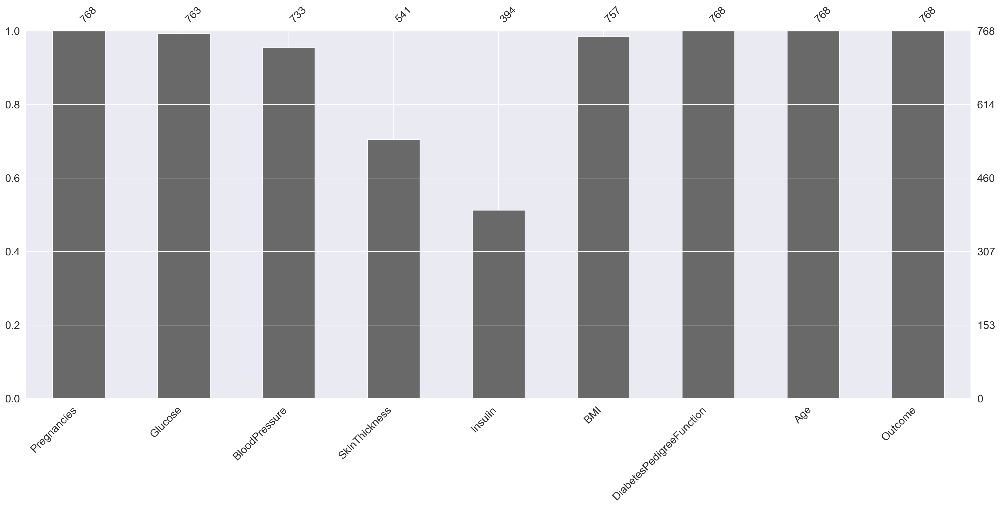

In [13]:
msno.bar(df)
plt.show()

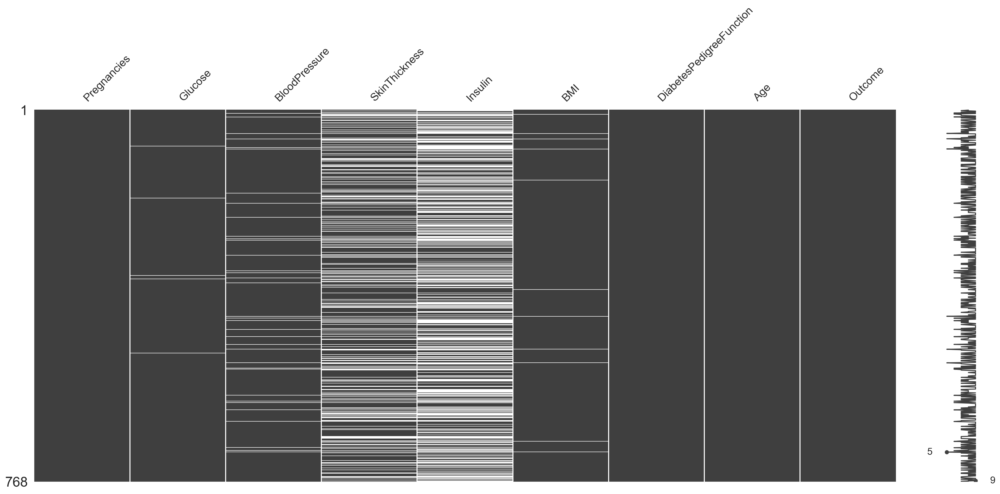

In [14]:
msno.matrix(df)
plt.show()

Na pierwszy rzut oka wydaje się, że brak danych, dotyczących grubości skóry występuje najczęściej wtedy, gdy brakuje danych na temat poziomu insuliny. Prawdopodobnie więc, brak wartości zmiennej ```SkinThickness``` jest uzależniony od braku wartości zmiennej ```Insulin```. Sprawdźmy więc, czy ta hipoteza jest słuszna i posortujmy wiersze według wartości insuliny.

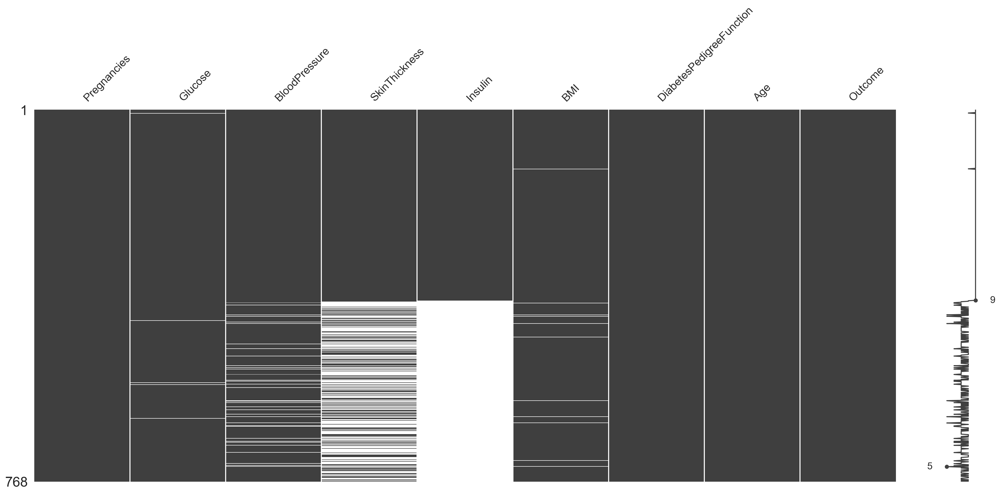

In [15]:
msno.matrix(df.sort_values(by='Insulin'))
plt.show()

Jak widzimy, brak danych, dotyczących grubości skóry, występuje tylko wtedy, gdy brakuje danych na temat insuliny. Zauważmy również, że podobną zależność obserwujemy między danymi na temat ciśnienia krwi a danymi, dotyczącymi insuliny. W przypadku pozostałych brakujących danych, tj. glukozy oraz BMI, podobna zależność nie jest widoczna.

Sprawdzimy jeszcze, czy brak wartości zmiennej ```BloodPressure``` zależy od braku wartości zmiennej ```SkinThickness```. W tym celu, posortujemy wiersze najpierw według wartości w kolumnie ```Insulin```, a następnie według wartości w kolumnie ```SkinThickness```.

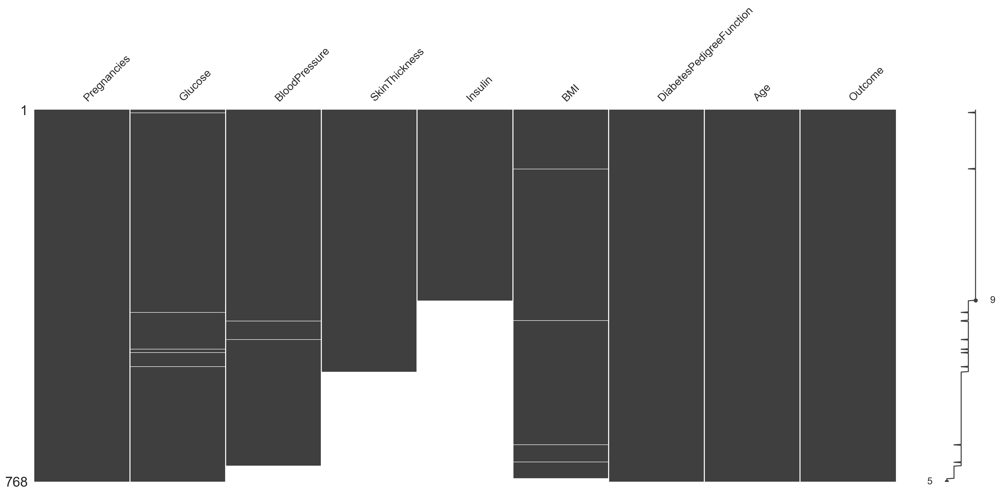

In [16]:
msno.matrix(df.sort_values(by=['Insulin', 'SkinThickness', 'BloodPressure', 'BMI']))
plt.show()

Na podstawie powyższego wykresu, możemy wyciągnąć następujące wnioski:

* jeżeli brakuje wartości zmiennej ```BloodPressure```, to zazwyczaj brakuje zarówno wartości zmiennej ```SkinThickness```, jaki i wartości zmiennej ```Insulin```,

* jeżeli brakuje wartości zmiennej ```SkinThickness```, to zawsze brakuje wartości zmiennej ```Insulin```,

* widzimy również, że duża część brakujących wartości zmiennej ```BMI``` pokrywa się z brakiem wartości ```BloodPressure```,

* w przypadku pozostałych brakujących zmiennych, nie obserwujemy żadnych zalezności.

Zobaczmy jeszcze, jak obecność lub brak danej zmiennej jest skorelowany z obecnością lub brakiem innej zmiennej ($1$ - otrzymujemy, gdy zawsze, jeżeli jedna zmienna ma wartość, to druga też ma wartość; $-1$ - gdy obecność wartości danej zmiennej, świadczy o nieobecności wartości innej zmiennej; $0$ - jeżeli zmienne nie są skorelowane. We wszystkich pozostałych przypadkach obserwyjemy tym silniejszą korelację, im wartość bezwzględna ze współczynnika korelacji jest bliższa $1$).

(Dokładniejszy opis mapy ciepła z bilbioteki ```missingno```, znajduje się tutaj: https://github.com/ResidentMario/missingno)

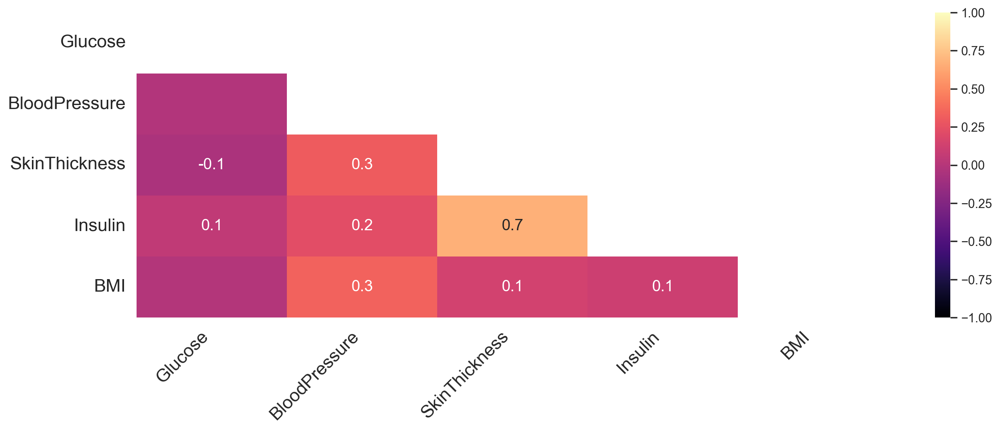

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
msno.heatmap(df, cmap='magma', ax=ax)
plt.show()

Powyższy wykres pokazuje, że zależność między brakiem wartości cechy ```Insulin``` a brakiem wartości cechy ```SkinThickness``` jest bardzo silna. Wynika stąd, że brakujące wartości ```SkinThickness``` i ```Insulin``` są wartościami MNAR (*Missing not at random*), czyli brak wartości nie jest losowy. Widzimy również niezbyt silną korelację między zmiennymi ```BloodPressure``` i ```SkinThickness```, a także między zmiennymi ```BMI``` i ```BloodPressure```.

W przypadku pozostałych cech nie obserwujemy zbyt silnej zależności, więc pozostałe brakujące cechy możemy uznać za MCAR (*Missing completely at random*), ponieważ nie jest widoczna korelacja między tymi zmiennymi.

Odrzucimy więc wszystkie wiersze, w których występują zmienne słabo skorelowane z pozostałymi brakującymi zmiennymi, a więc wiersze, które zawierają brakujące wartości, nie będące wartościami zmiennej ```Insulin``` ani zmiennej ```SkinThickness```.

In [18]:
df2 = df.dropna(subset=['Glucose', 'BloodPressure', 'BMI'])

In [19]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 724 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               724 non-null    int64  
 1   Glucose                   724 non-null    float64
 2   BloodPressure             724 non-null    float64
 3   SkinThickness             532 non-null    float64
 4   Insulin                   392 non-null    float64
 5   BMI                       724 non-null    float64
 6   DiabetesPedigreeFunction  724 non-null    float64
 7   Age                       724 non-null    int64  
 8   Outcome                   724 non-null    int64  
dtypes: float64(6), int64(3)
memory usage: 56.6 KB


In [20]:
df2.isnull().sum()

Pregnancies                   0
Glucose                       0
BloodPressure                 0
SkinThickness               192
Insulin                     332
BMI                           0
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

Jak widzimy, pozostałe brakujące wartości, dotyczą jedynie zmiennych ```Insulin``` oraz ```SkinThickness```, których uzupełnieniem zajmiemy się później.

## Wartości odstające

Ponieważ w analizowanym zbiorze danych, brakuje danych, dotyczących Insuliny dla około połowy rekordów, zdecydowałem się zacząć od analizy wartości odstających, a dopiero później przejść do uzupełniania brakujących danych. Ta decyzja wynika z faktu, iż wartości odstające mogą mieć znaczący wpływ na liczby, którymi zastąpię brakujące wartości.

W celu wyznaczenia wartości odstających, posłużymy się wykresem pudełkowym. Wszystkie wartości, które nie znajdują się między lewym i prawym *wąsem*, traktowane są jako wartości odstające. Do wyznaczenia położenia lewego oraz prawego *wąsa* posłużę się poniższymi wzorami:

* lewy wąs: $max\{x_{1:n}, Q_1 - 1.5 \cdot IQR\}$,

* prawy wąs: $min\{x_{n:n}, Q_3 + 1.5 \cdot IQR\}$,

gdzie:
    
* $x_{1:n}$ - najmniejsza wartość danej cechy,

* $x_{n:n}$ - największa wartość danej cechy,

* $Q_1$ - kwartyl dolny (kwartyl rzędu $\frac{1}{4}$),

* $Q_3$ - kwartyl górny (kwartyl rzędu $\frac{3}{4}$),

* $IQR$ - rozstęp międzykwartylowy ($IQR = Q_3 - Q_1$)

W przypadku, gdy $max\{x_{1:n}, Q_1 - 1.5 \cdot IQR\} = x_{1:n}$, nie znajdzie się żadna wartość mniejsza niż $x_{1:n}$, natomiast gdy $min\{x_{n:n}, Q_3 + 1.5 \cdot IQR\} = x_{n:n}$, nie znajdzie się żadna wartość większa niż $x_{n:n}$. Z tego powodu, możemy nie obliczać minimum ani maksimum i skorzystać z poniższych wzorów na wartości położenia *wąsów* wykresu pudełkowego:

* lewy wąs: $Q_1 - 1.5 \cdot IQR$,

* prawy wąs: $Q_3 + 1.5 \cdot IQR$

Do rysowania pomocniczych wykresów, wykorzystam następującą funkcję.

In [21]:
def draw_plots(df, feature):
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    sns.boxplot(ax=ax[0], data=df, x=feature)
    sns.histplot(ax=ax[1], data=df[feature])
    sns.despine()

Do wyznaczenia wartości odstających, wykorzystam poniższą funkcję.

In [22]:
def get_boxplot_bounds(df, feature):
    Q1 = df[feature].quantile(.25)
    Q3 = df[feature].quantile(.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return lower, upper

Do usuwania wierszy, zawierających wybrane wartosci, posłużę się następującą funkcją.

In [23]:
def remove_rows(df, feature, lower=float('-inf'), upper=float('inf')):
    df.drop(df[(df[feature] < lower) | (df[feature] > upper)].index, inplace=True)

## Analiza wartości odstających

Zobaczmy, jak się prezentują wartości odstające dla poszczególnych cech.

###### Cecha: ```Pregnancies```

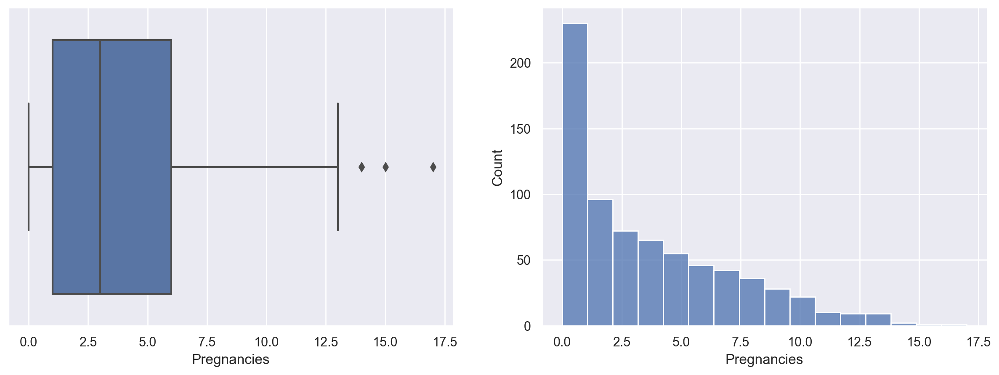

In [24]:
draw_plots(df2, 'Pregnancies')

Widzimy, że za prawym *wąsem* wykresu występują wartości odstające. Ponieważ te wartości są możliwe do osiągniecia (prawdopodobnie nie wynikają z błędu danych) i jednocześnie nie odstają bardzo od pozostałych wartości, zdecydowałem się ze zachować.

###### Cecha: ```Glucose```

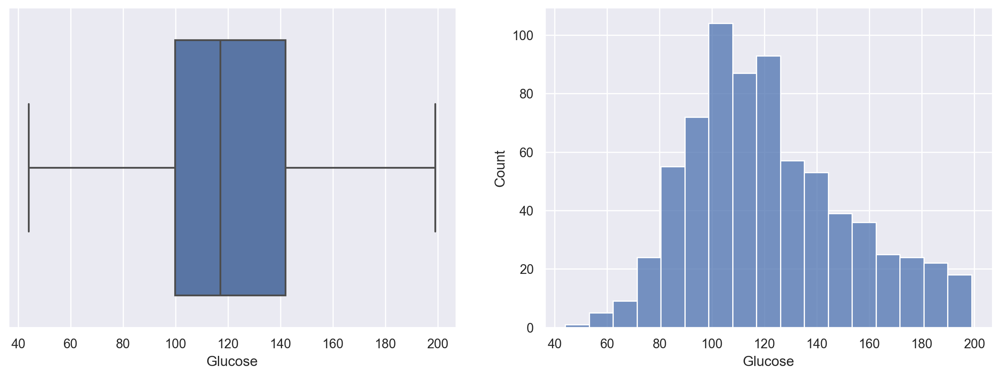

In [25]:
draw_plots(df2, 'Glucose')

W przypadku cechy ```Glucose```, nie obserwujemy wartości odstających.

###### Cecha: ```BloodPressure```

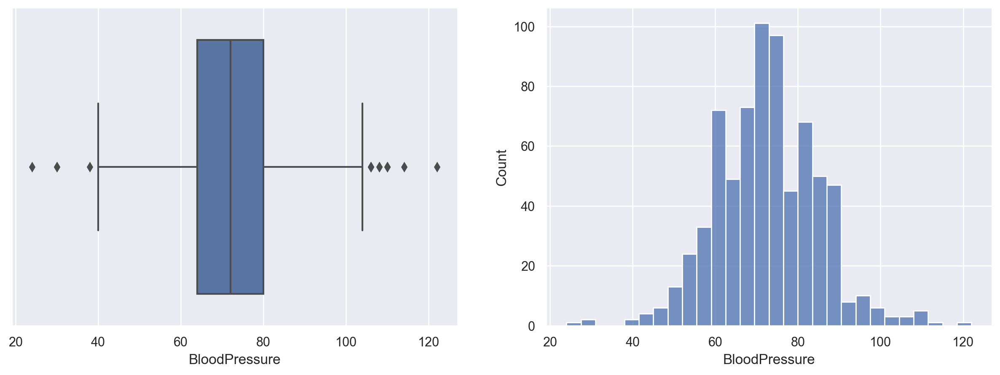

In [26]:
draw_plots(df2, 'BloodPressure')

Według strony internetowej https://www.wapteka.pl/blog/artykul/niskie-cisnienie-czy-wymaga-leczenia-przyczyny-objawy-leczenie, niedociśnienie obserwujemy, jeżeli wartość ciśnienia rozkurczowego krwi wynosi poniżej $60 \text{mmHg}$, natomiast nadciśnienie III stopnia jest wówczas, gdy wartość ciśnienia wynosi przynajmniej $110 \text{mmHg}$.

Na powyższych wykresach widzimy wartości ciśnienia poniżej $40 \text{mmHg}$, a nawet jedna z wartości jest bliska $20 \text{mmHg}$. Prawdopodobnie są to wartoście błędnie zmierzone i zostaną one usunięte.

W przypadku wartości zaliczanych do nadciśnienia III stopnia, widzimy mniej odbiegające liczby od wartości progowej. Usuniemy więc tylko ciśnienie, które wynosi powyżej $120 \text{mmHg}$.

In [27]:
remove_rows(df2, 'BloodPressure', 40, 120)

Sprawdźmy, czy wiersze, zawierające wskazane wartości, zostały usunięte prawidłowo.

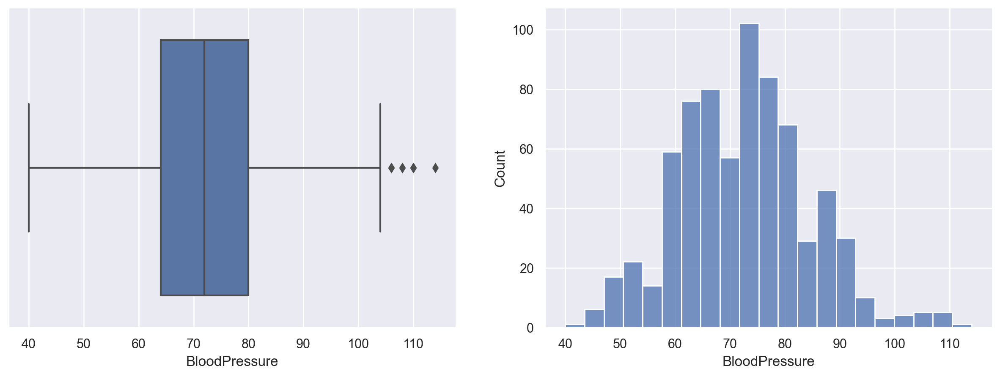

In [28]:
draw_plots(df2, 'BloodPressure')

###### Cecha: ```SkinThickness```

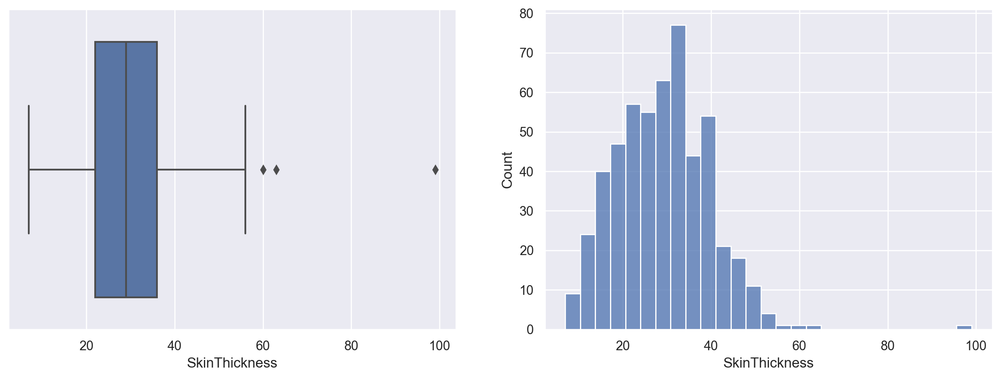

In [29]:
draw_plots(df2, 'SkinThickness')

W przypadku zmiennej ```SkinThickness``` widzimy trzy wartości odstające (znajdujące się po prawej stronie prawego *wąsa* wykresu pudełkowego). 

In [30]:
_, upper = get_boxplot_bounds(df2, 'SkinThickness')
df2[df2['SkinThickness'] > upper]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
57,0,100.0,88.0,60.0,110.0,46.8,0.962,31,0
445,0,180.0,78.0,63.0,14.0,59.4,2.420,25,1
579,2,197.0,70.0,99.0,NaN,34.7,0.575,62,1


Na podstawie powyższej tabelki, możemy dojść do wniosku, że wartość grubości fałdu skórnego, równa $99 \text{mm}$ została błędnie wpisana, ponieważ osoba, której przypisana została ta wartość, nie ma skrajnej otyłości (BMI nie jest takie wysokie, jak w przypadku innych osób). Konieczne więc będzie usunięcie wiersza, zawierającego tę wartość.

Widzimy również, że osoba, dla której grubość skóry wynosi $63 \text{mm}$ również ma nieprawidłowo wpisane dane, a mianowicie wartość insuliny jest znacznie poniżej normy. Ten wiersz także usuniemy.

In [31]:
remove_rows(df2, 'SkinThickness', upper=60)

Sprawdźmy, czy wiersze, zawierające wskazane wartości, zostały usunięte prawidłowo.

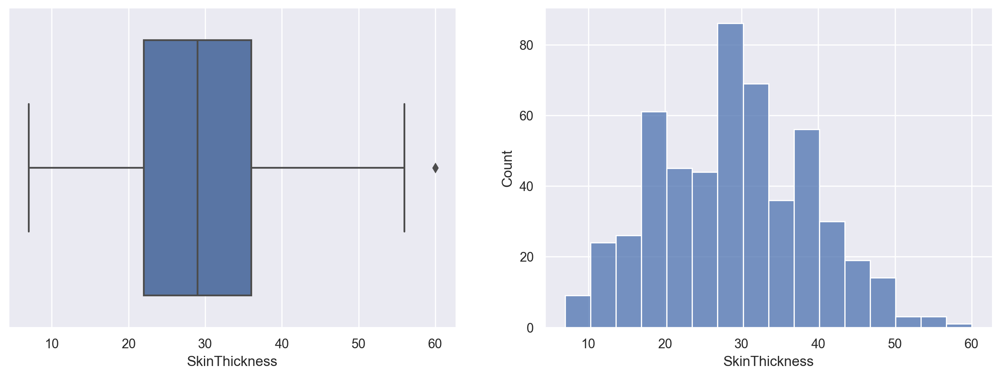

In [32]:
draw_plots(df2, 'SkinThickness')

###### Cecha: ```Insulin```

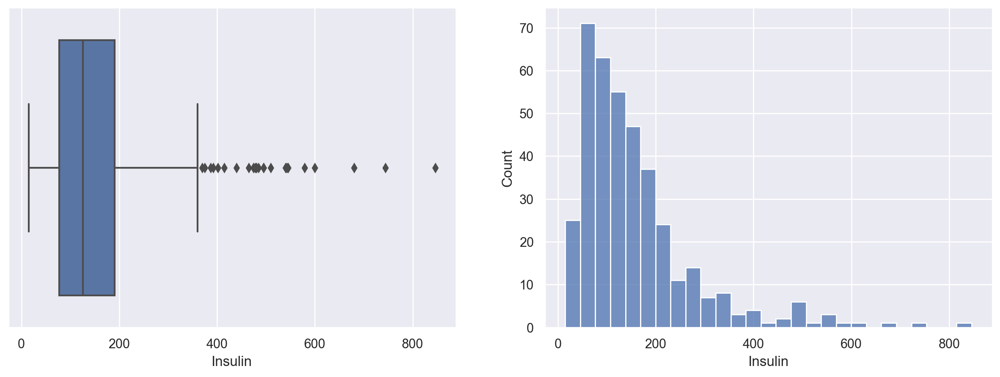

In [33]:
draw_plots(df2, 'Insulin')

W przypadku cechy ```Insulin```, obserwujemy bardzo dużą liczbę wartości odstających. Jest to jednak uzasadnione, ponieważ pacjentki były badane $2$ godziny po podaniu glukozy, więc poziom insuliny we krwi może być podwyższony. 

Uznaje się, że po dwóch godzinach od wykonania testu tolerancji glukozy, wartość insuliny, w przypadku zdrowej osoby, powinna należeć do przedziału $16-166$ $\frac{\text{mIU}}{\text{L}}$. Ponieważ wśród badanych znajdują się pacjentki chore na cukrzycę, wartości insuliny mogą być większe.

Przyjrzyjmy się więc bliżej wartościom odstającym.

In [34]:
_, upper = get_boxplot_bounds(df2, 'Insulin')
df2[df2['Insulin'] > upper].sort_values(by='Insulin', ascending=False)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
13,1,189.0,60.0,23.0,846.0,30.1,0.398,59,1
228,4,197.0,70.0,39.0,744.0,36.7,2.329,31,0
247,0,165.0,90.0,33.0,680.0,52.3,0.427,23,0
584,8,124.0,76.0,24.0,600.0,28.7,0.687,52,1
409,1,172.0,68.0,49.0,579.0,42.4,0.702,28,1
286,5,155.0,84.0,44.0,545.0,38.7,0.619,34,0
8,2,197.0,70.0,45.0,543.0,30.5,0.158,53,1
655,2,155.0,52.0,27.0,540.0,38.7,0.240,25,1
753,0,181.0,88.0,44.0,510.0,43.3,0.222,26,1
186,8,181.0,68.0,36.0,495.0,30.1,0.615,60,1


Patrząc na powyższą tabelę, nie możemy łatwo stwierdzić, czy wysokie wartości insuliny należy uznać za błędne dane. Widzimy jednak, że wraz ze wzrostem insuliny, rośnie wartość glukozy. Sprawdźmy więc, czy hipoteza, według której wartość glukozy rośnie wraz ze wzrostem wartości insuliny, jest słuszna.

In [35]:
df2['Insulin'].corr(df2['Glucose'], method='pearson')

0.5885242718651984

In [36]:
df2['Insulin'].corr(df2['Glucose'], method='spearman')

0.6671518346325628

Widzimy, że miedzy zmiennymi istnieje silna korelacja. Porównując współczynniki korelacji Pearsona oraz Spearmana, możemy dojść do wniosku, że ta zależność nie jest do końca liniowa. Sprawdźmy więc, jak na wykresie wygląda zależność obu zmiennych.

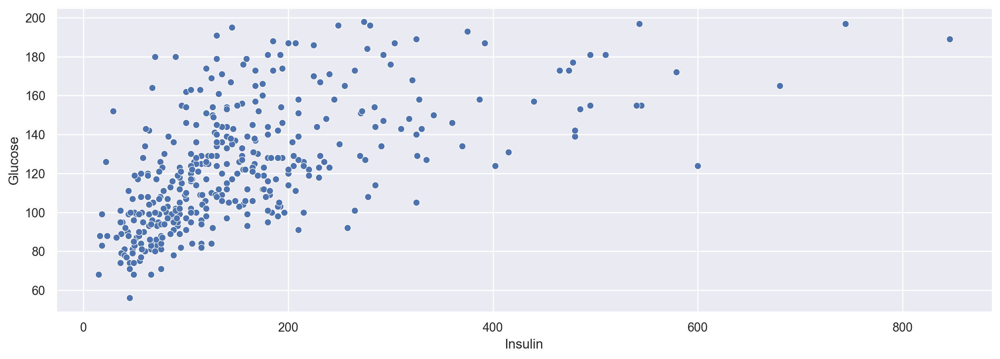

In [37]:
fig = plt.figure(figsize=(15, 5))
sns.scatterplot(data=df2, x='Insulin', y='Glucose')
plt.show()

Jak widzimy, punkty, dla których zmienna ```Insulin``` ma wartość większą lub równą $600$ $\frac{\text{mIU}}{\text{L}}$, w znaczący sposób odstają od głównego trendu. Usuniemy więc te wiersze, dla których wartość insuliny wynosi przynajmniej $600$  $\frac{\text{mIU}}{\text{L}}$.

In [38]:
remove_rows(df2, 'Insulin', upper=599)

Zobaczmy, jak teraz wygląda zależność obu zmiennych.

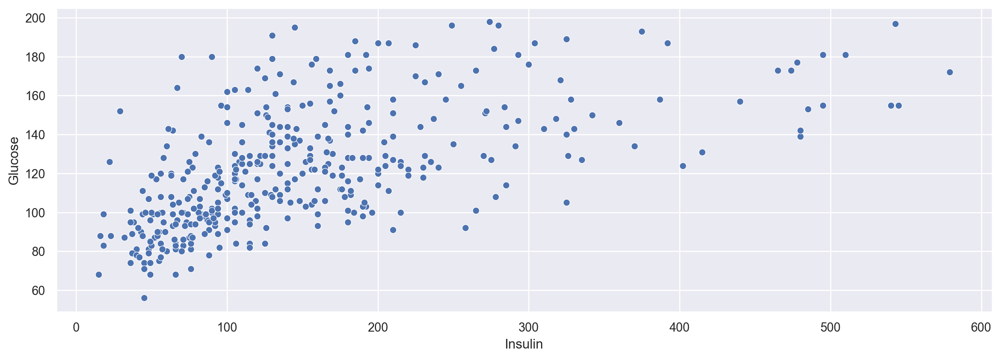

In [39]:
fig = plt.figure(figsize=(15, 5))
sns.scatterplot(data=df2, x='Insulin', y='Glucose')
plt.show()

Widzimy, że już teraz nie ma punktów, które w sposób znaczący odstawałyby od pozostałych.

###### Cecha: ```BMI```

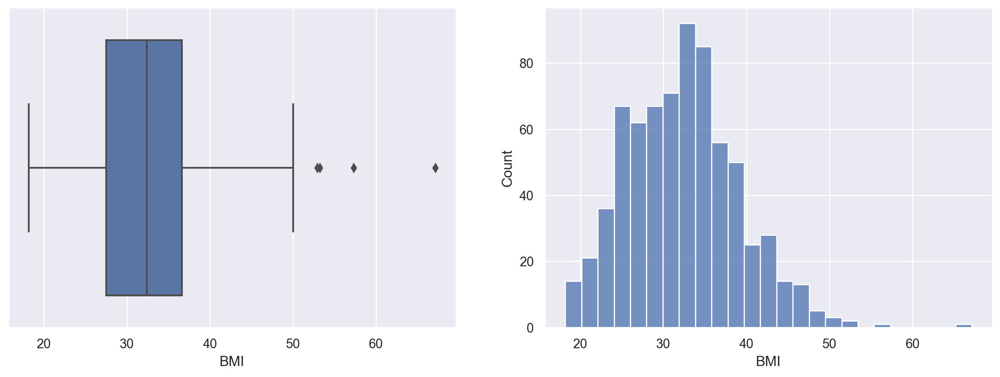

In [40]:
draw_plots(df2, 'BMI')

Jak widzimy na obu powyższych wykresach, wartości większe niż $55$ odstają dość mocno od pozostałych. Usuniemy więc tylko wiersze zawierające te wartości.

In [41]:
remove_rows(df2, 'BMI', upper=55)

Sprawdźmy, czy wiersze, zawierające wskazane wartości, zostały usunięte prawidłowo.

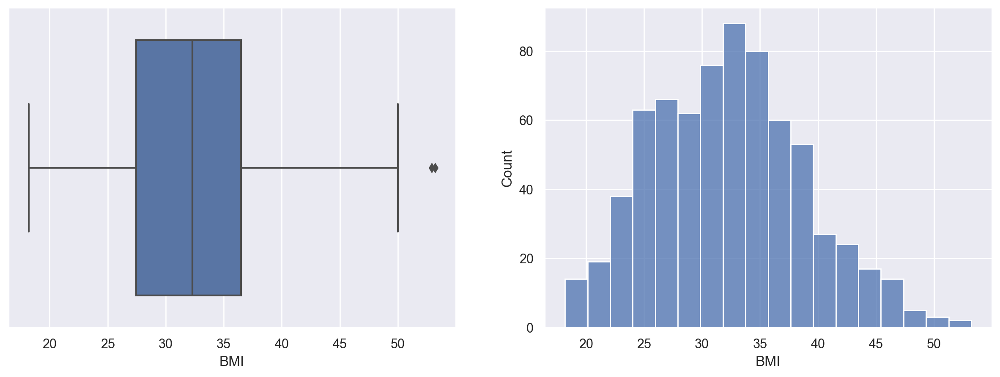

In [42]:
draw_plots(df2, 'BMI')

###### Cecha: ```Age```

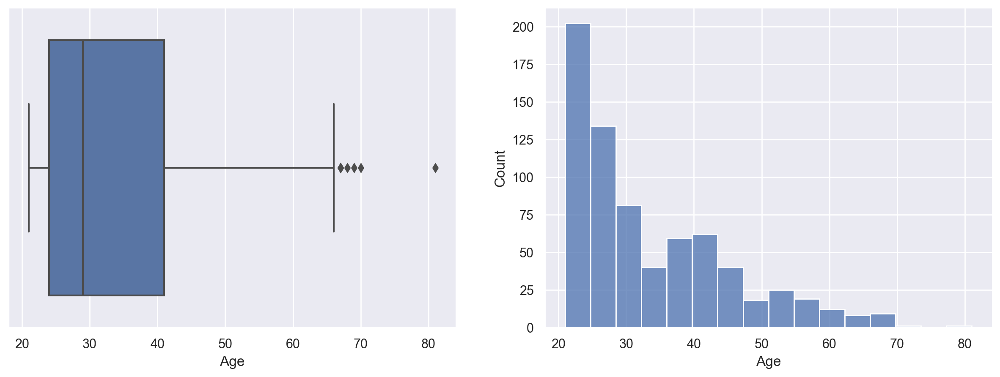

In [43]:
draw_plots(df2, 'Age')

W przypadku wieku, obserwujemy jedną szczególnie mocno odstającą wartość, większą niż $80$ lat. Usuniemy wiersz, zawierający tę wartość.

In [44]:
remove_rows(df2, 'Age', upper=80)

Sprawdźmy, czy wiersze, zawierające wskazane wartości, zostały usunięte prawidłowo.

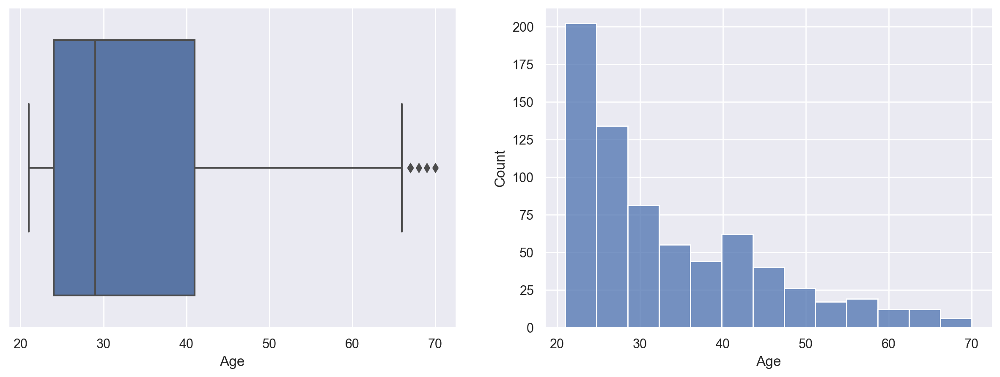

In [45]:
draw_plots(df2, 'Age')

###### Cecha: ```DiabetesPedigreeFunction```

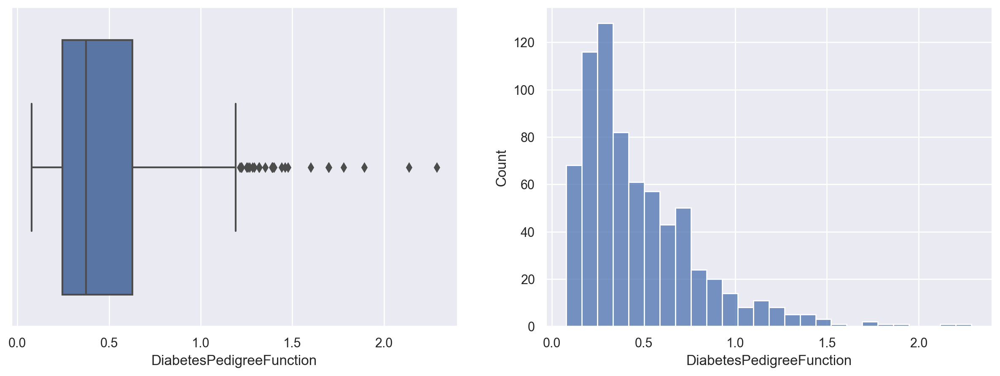

In [46]:
draw_plots(df2, 'DiabetesPedigreeFunction')

Jak widzimy, wartości powyżej $2.0$ odstają dosyć mocno od pozostałych. Usuniemy więc wiersze, które zawierają te wartości.

In [47]:
remove_rows(df2, 'DiabetesPedigreeFunction', upper=2)

Sprawdźmy, czy wiersze, zawierające wskazane wartości, zostały usunięte prawidłowo.

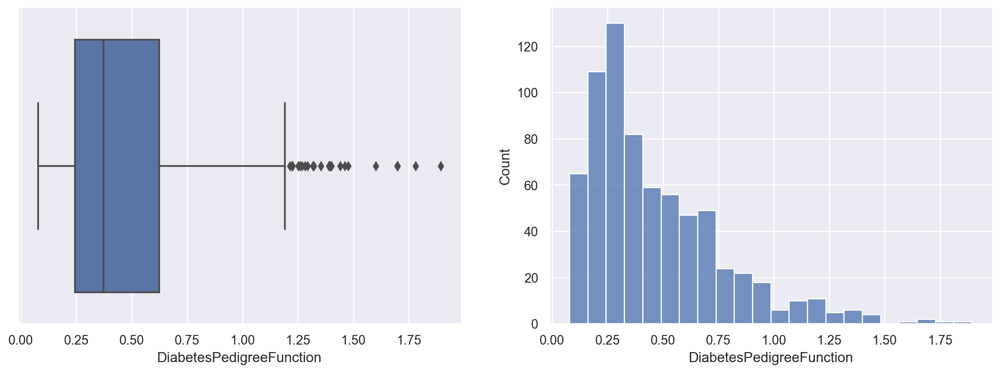

In [48]:
draw_plots(df2, 'DiabetesPedigreeFunction')

## Uzupełnianie brakujących wartości

In [49]:
round(df2['Insulin'].isnull().sum() / len(df2) * 100, 2)

46.61

Ponieważ blisko połowa rekordów nie posiada zapisanej wartości insuliny, odrzucenie wszystkich wierszy, w których brakuje wartości, spowodowałoby utratę dużej ilości danych. Analizowany zbiór danych nie jest duży, więc nie możemy sobie pozwolić na usunięcie prawie połowy wierszy. Konieczne jest zatem uzupełnienie w jakiś sposób brakujących wartości. 

Najczęściej wykorzystywaną metodą, jest zastępowanie brakujących danych liczbowych, przy pomocy median wartości, charakteryzujących obiekty z podobnej grupy. W naszym przypadku moglibyśmy, dla pacjentek, które otrzymały pozytywny wynik testu, wykorzystać medianę wartości insuliny oraz grubości fałdu skórnego, odpowiadających pacjentkom o pozytywnym wyniku testu, natomiast dla pacjentek o wyniku negatywnym, wykorzystać odpowiednie mediany wartości, uzyskanych przez pacjenki, które otrzymały negatywny wynik testu.

Zastanówmy się więc, czy jest to prawidłowy sposób uzupełniania danych, jeżeli brakuje aż tyle wartości.

Spójrzmy najpierw na poniższą macierz korelacji.

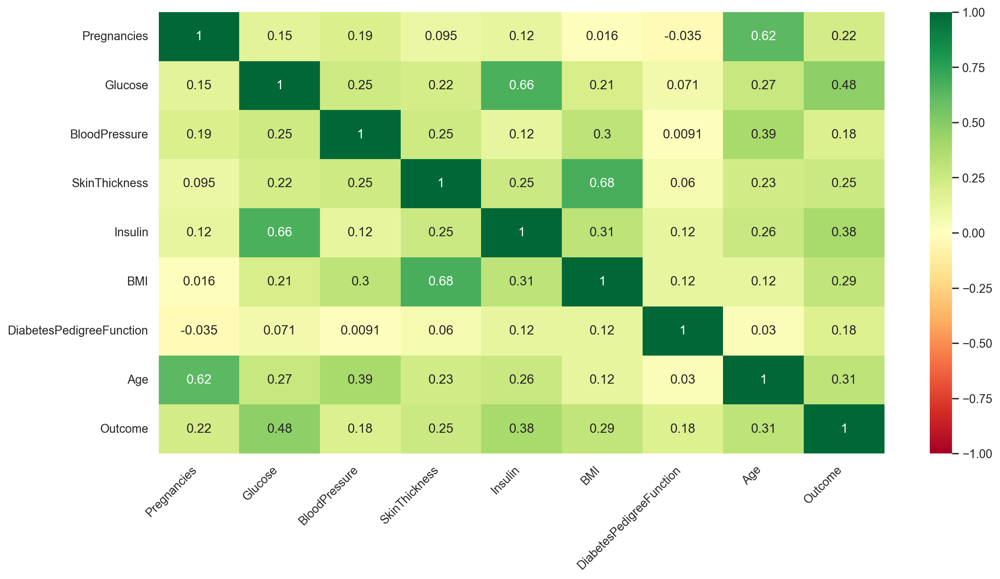

In [50]:
figure = plt.figure(figsize=(15, 7.5))
g = sns.heatmap(df2.corr('spearman'), cmap="RdYlGn", vmax=1, vmin=-1, center=0, annot=True)
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

Widzimy, że zmienna ```Insulin``` jest silnie skorelowana ze zmienną ```Glucose```. Jeszcze silniejszą korelację obserwujemy między zmienną ```SkinThickness``` a zmienną ```BMI```. Widzimy więc, że to, jaką wartość wstawimy w miejsce brakujących wartości, będzie miało wpływ na to, jak silną będziemy mieli korelację między zmiennymi.

Zobaczmy, jak prezentuje się zależność między insuliną a glukozą oraz zależność między BMI a grubością fałdu skórnego:

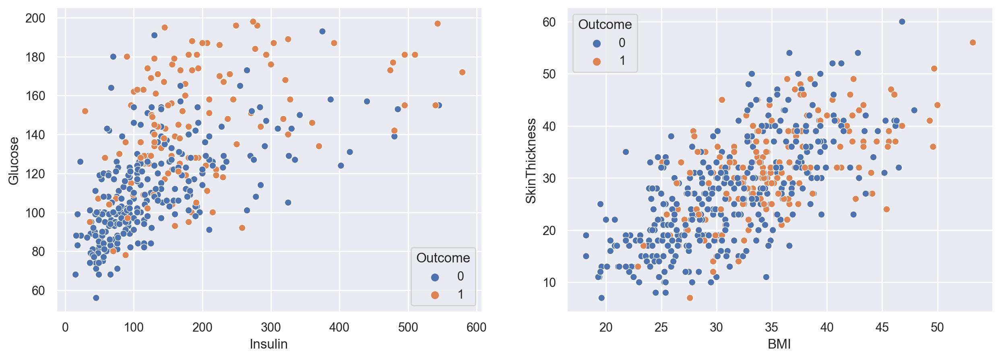

In [51]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.scatterplot(ax=ax[0], x="Insulin", y="Glucose", hue='Outcome', data=df2)
sns.scatterplot(ax=ax[1], x="BMI", y="SkinThickness", hue='Outcome', data=df2)
sns.despine()

Widzimy, że wraz ze wzrostem wartości insuliny, zwiększa się wartość glukozy.

Zobaczmy, jak wyglądałby ten wykres, gdybyśmy brakujące wartości zastąpili medianami odpowiednich zmiennych. Przy wyznaczaniu median, uwzględnimy podział na osoby zdrowe oraz chore i będziemy uzupełniać brakujące wartości odpowiednimi medianami, w zależności od tego, czy dana osoba jest chora, czy nie.

In [52]:
def fill_median(df, feature, outcome):
    median = df[feature][df['Outcome'] == outcome].median()
    df[feature].loc[(df['Outcome'] == outcome) & df[feature].isnull()] = median

In [53]:
df3 = df2.copy()
fill_median(df3, 'Insulin', 0)
fill_median(df3, 'Insulin', 1)
fill_median(df3, 'Glucose', 0)
fill_median(df3, 'Glucose', 1)

In [54]:
df3['Insulin'].isnull().sum()

0

Po uzupełnieniu brakujących wartości Insuliny i Glukozy, przy pomocy odpowiednich median, otrzymujemy poniższy rozkład obu zmiennych:

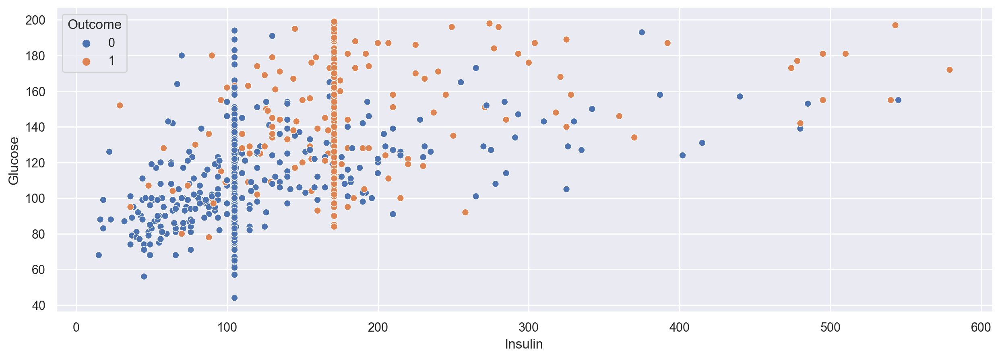

In [55]:
fig = plt.figure(figsize=(15, 5))
sns.scatterplot(x='Insulin', y='Glucose', hue='Outcome', data=df3)
sns.despine()

Bardzo dobrze widać dwa pionowe prążki, które powstały. Uzupełnienie brakujących wartości, przy pomocy median, nie jest więc dobrym podejściem, ponieważ znacząco zniekształca analizowane dane, bez uwzględniania zależności między zmiennymi. W przypadku powyższego wykresu, można zauważyć, że dla pewniej wartości insuliny, równej medianie wartości insuliny zdrowych pacjentek, otrzymujemy bardzo dużo różnych wartości glukozy, rozrzuconych na przedziale od ok. $45$ do ok. $195$.

Ponieważ uzupełnianie brakujących danych medianami, powoduje znaczące zniekształcenie zbioru danych oraz jednocześnie obserwujemy silną zależność między glukozą, dla której brakuje bardzo niewiele wartości, a insuliną, do uzupełnienia brakujących danych możemy wykorzystać algorytm, korzystający z uczenia maszynowego. Wykorzystam algorytm K-najbliższych sąsiadów, który przewiduje wartość pewnej cechy, na podstawie wartości cech najbardziej podobnych elementów (elementów z najbliższego sąsiedztwa). W naszym przypadku, algorytm wyznaczy brakującą wartość danej zmiennej, na podstawie wartości tej zmiennej, charakteryzujących inne pacjentki, których pozostałe cechy w największym stopniu są zbliżone do innych niż brakująca cech rozważanej pacjentki.

In [56]:
scaler = MinMaxScaler()
df2 = pd.DataFrame(scaler.fit_transform(df2), columns=df2.columns)
imputer = KNNImputer(n_neighbors=5)
df2 = pd.DataFrame(imputer.fit_transform(df2), columns=df2.columns)
df2 = pd.DataFrame(scaler.inverse_transform(df2), columns=df2.columns)
df2.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,313.2,33.6,0.627,50.0,1.0
1,1.0,85.0,66.0,29.0,57.2,26.6,0.351,31.0,0.0
2,8.0,183.0,64.0,30.8,238.0,23.3,0.672,32.0,1.0
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0
4,5.0,116.0,74.0,23.0,128.4,25.6,0.201,30.0,0.0


In [57]:
df2.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

Jak widzimy, wszystkie brakujące wartości zostały zamienione na wyznaczone przez algorytm wartości.

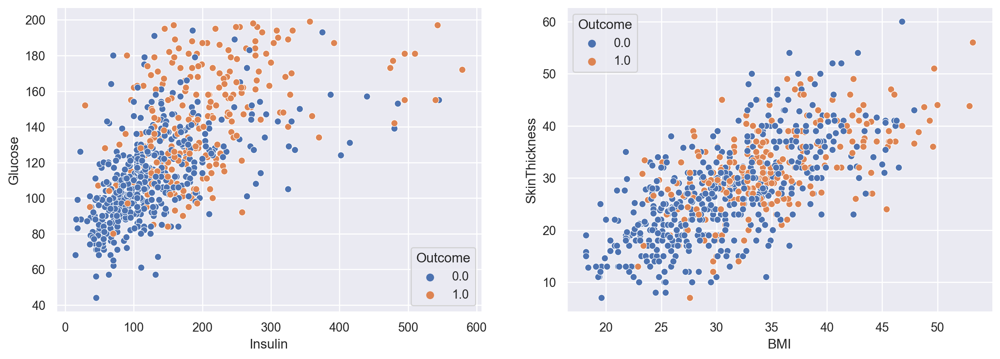

In [58]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.scatterplot(ax=ax[0], x="Insulin", y="Glucose", hue='Outcome', data=df2)
sns.scatterplot(ax=ax[1], x="BMI", y="SkinThickness", hue='Outcome', data=df2)
sns.despine()

Tym razem nie obserwujemy już pionowych prążków na wykresie, ponieważ brakujące wartości insuliny zostały wyznaczone, w zależnośći od pozostałych cech, charakteryzujących pacjentki. W podobny sposób zostały uzupełnione brakujące wartości zmiennej ```SkinThickness```.


# Analiza eksploracyjna

W celu poprawy czytelności danych, zamieńmy wartość zero-jedynkową, reprezentującą wynik testu na cukrzycę, na tekst, informujący o tym, czy pacjentka jest chora na cukrzycę, czy nie jest.

In [59]:
df3 = df2.copy()
df3['Outcome'] = df2['Outcome'].apply(lambda x: 'Sick' if x else 'Healthy')

In [60]:
df3.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,313.2,33.6,0.627,50.0,Sick
1,1.0,85.0,66.0,29.0,57.2,26.6,0.351,31.0,Healthy
2,8.0,183.0,64.0,30.8,238.0,23.3,0.672,32.0,Sick
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,Healthy
4,5.0,116.0,74.0,23.0,128.4,25.6,0.201,30.0,Healthy


## Liczba osób z cukrzycą

Zacznijmy od porównania liczby osób, u których stwierdzono cukrzycę z liczbą osób, u których nie została stwierdzona choroba.

In [61]:
df3['Outcome'].value_counts()

Healthy    467
Sick       241
Name: Outcome, dtype: int64

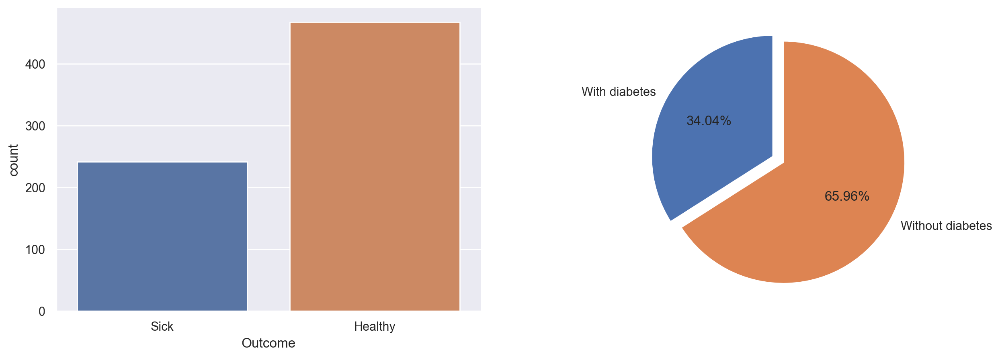

In [62]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

sns.countplot(ax=ax[0], data=df3, x='Outcome')

with_diabetes = df3[df3['Outcome'] == 'Sick'].count()[0]
without_diabetes = df3[df3['Outcome'] == 'Healthy'].count()[0]

plt.pie([with_diabetes, without_diabetes], 
        labels=['With diabetes', 'Without diabetes'], 
        autopct="%.2f%%",
        explode=[0.05,0.05],
        startangle=90)

sns.despine()

Jak widzimy, ok. $66\%$ ($2/3$) osób stanowią osoby zdrowe, natomiast $34\%$ ($1/3$) osób stanowią osoby chore.

## Wstępna analiza rozkładów badanych cech

Zobaczmy, jak wygląda rozkład wartości poszczególnych cech, w zależności od tego, czy u pacjentki stwierdzono cukrzycę.

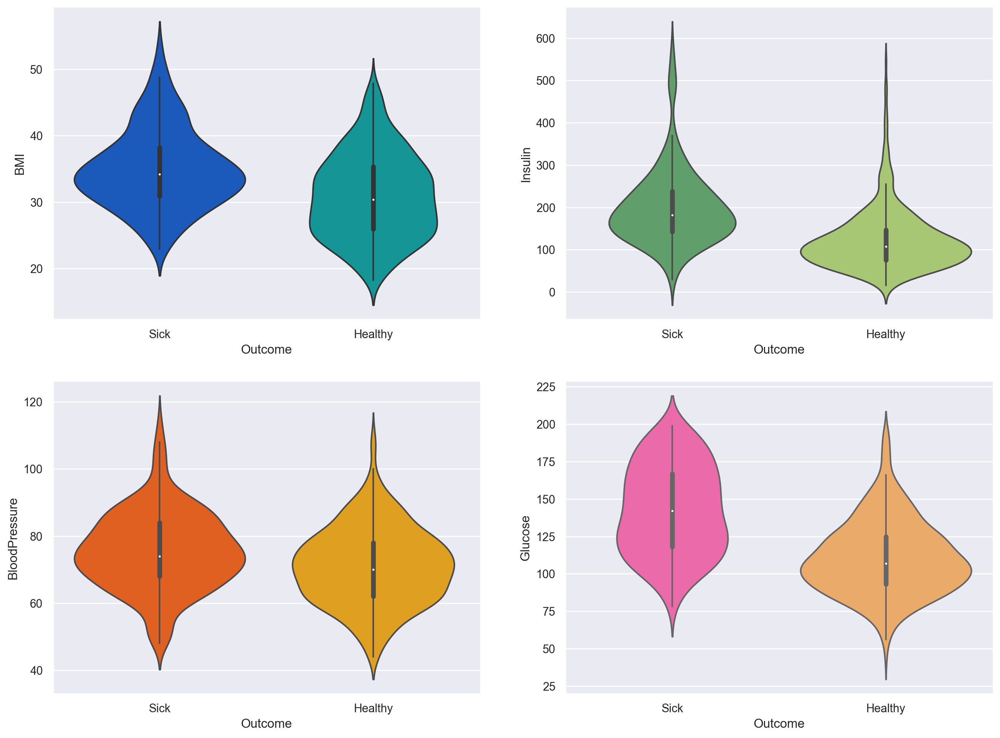

In [63]:
plt.figure(figsize=(16,12))

plt.subplot(2,2,1)
sns.violinplot(x='Outcome', y='BMI', data=df3, palette='winter')

plt.subplot(2,2,2)
sns.violinplot(x='Outcome', y='Insulin', data=df3, palette='summer')

plt.subplot(2,2,3)
sns.violinplot(x='Outcome', y='BloodPressure', data=df3, palette='autumn')

plt.subplot(2,2,4)
sns.violinplot(x='Outcome', y='Glucose', data=df3, palette='spring')

sns.despine()

Jak możemy łatwo zauważyć, osoby chore na cukrzycę charakteryzują wyższe wartości BMI, insuliny, ciśnienia krwi oraz glukozy niż osoby zdrowe. 

<br>
Sprawdźmy również, w jakim wieku oraz po ilu ciążach są najczęściej pacjentki chore oraz zdrowe. Do tego celu wykorzystamy wykresy słupkowe, pokazujące wartość oczekiwaną (odpowiednio dla wieku oraz liczby ciąż). Paski niepewności, znajdujące się w górnej części słupków wykresu, przedstawiają, w jakim przedziale mieści się $95\%$ najbardziej prawdopodobnych wartości (najbliższych wartości oczekiwanej).

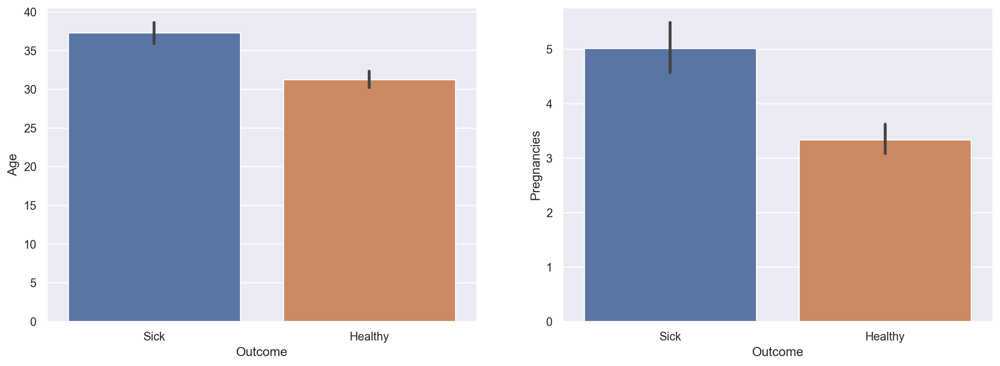

In [64]:
plt.figure(figsize=(16,12))

plt.subplot(2,2,1)
sns.barplot(x='Outcome', y='Age', data=df3)

plt.subplot(2,2,2)
sns.barplot(x='Outcome', y='Pregnancies', data=df3)
plt.show()

Widzimy, że z reguły osoby chore są starsze o średnio $5$ lat od osób zdrowych. Jeszcze większa różnica występuje pomiędzy liczbą odbytych ciąż a wynikiem testu na cukrzycę. W tym przypadku, chore na cukrzycę pacjentki odbyły zwykle prawie o $2$ ciąże więcej od pacjentek zdrowych.

## Szczegołówa analiza wybranych cech

### Wyznaczanie współczynników

W celu wyznaczenia odpowiednich współczynników, możemy skorzystać z poniższych wzorów. Wzory te uwzględniają fakt, iż mamy do czynienia z rozkładami dyskretnymi.

**Wartość średnia**

$m = E(X) = \sum_{k: \in x_k} x_k \cdot p(x_k)$

**Moment rzędu $k$**

$m_k = E(X^k)$

**Moment centralny rzędu $k$**

$\mu_k = E((X - m)^k)$

**Wariancja**

$Var(X) = E((X - m)^2)$

**Odchylenie standardowe**

$\sigma = \sqrt{Var(X)}$

**Odchylenie przeciętne**

$d_1 = E|X - m|$

**Współczynnik asymetrii (skośności)**

$A = \gamma_1 = \frac{\mu_3}{\sigma^3}$

**Kurtoza**

$K = Kurt(X) = \frac{\mu_4}{\sigma^4}$

**Współczynnik wyostrzenia**

$\gamma_2 = Kurt(X) - 3$

Możemy również skorzystać z wbudowanych metod i funkcji, dostarczonych przez biblioteki ```numpy``` oraz ```scipy```.

Zobaczmy, jak się różnią wartości, które obliczmy, przy pomocy powyższych wzorów od wartości, uzyskanych, przy pomocy predefiniowanych funkcji i metod dla wybranej zmiennej.

In [65]:
def E(X): 
    p = X.value_counts() / len(X)
    return sum(x * p[x] for x in X.unique())

u = lambda k: lambda X: E((X - E(X)) ** k)

s = lambda X: (E(X ** 2) - E(X) ** 2) ** .5

d = lambda X: E((X - E(X)).abs())

A = lambda X: u(3)(X) / s(X) ** 3

K = lambda X: u(4)(X) / s(X) ** 4

In [66]:
X = df3['Pregnancies']

* Odchylenie standardowe

In [67]:
s(X), X.std()

(3.3651312980810104, 3.3675103236861044)

Jak widzimy, obie wartości są bardzo zbliżone. Ponieważ wariancja jest równa kwadratowi odchylenia standardowego, nie musimy sprawdzać osobno wariancji.

* Odchylenie przeciętne

In [68]:
d(X), X.mad()

(2.762775703022759, 2.762775703022758)

Tym razem wartości są jeszcze bardziej zbliżone, niemalże identyczne.

* Współczynnik asymetrii

In [69]:
A(X), stats.skew(X)

(0.8923977812940238, 0.8923977812940231)

Ponownie obserwujemy zbliżone wartości.

* Kurtoza

In [70]:
K(X), stats.kurtosis(X)

(3.155676135067279, 0.1556761350672735)

Tym razem obserwujemy coś niepokojącego. Różnica między wartościami jest znacząca. Czy oznacza to, że skorzystaliśmy z nieprawidlowego wzoru na obliczenie kurtozy? Odpowiedź jest przecząca. Źródłem rozbieżności jest fakt, iż funkcja ```stats.kurtosis```, dostarczona wraz z pakietem ```scipy```, nie oblicza, jak mogłoby się wydawać, kurtozy, ale współczynnik wyostrzenia, który dany jest wzorem $\gamma_2 = Kurt(X) - 3$ (źródło informacji: https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.kurtosis.html). Sprawdźmy więc, czy jeżeli obliczymy współczynnik wysotrzenia, przy pomocy zdefiniowanych przez nas funkcji, to otrzymamy zbliżone wartości.

* Współczynnik wyostrzenia

In [71]:
K(X) - 3, stats.kurtosis(X)

(0.15567613506727884, 0.1556761350672735)

Jak widzimy, teraz obie wartości są bardzo zbliżone do siebie. Fakt, iż funkcja ```stats.kurtosis``` oblicza współczynnik wyostrzenia zamiast kurtozy, musimy mieć na uwadze, podczas dalszej analizy.

W kolejnych krokach, będę korzystał z dostarczonych wraz z pakietami funkcji i metod.

### Pomocnicza funkcja, służąca do formatowania wypisywanych liczb

In [72]:
fmt = lambda n: f'{n:.2f}'

### Do wyznaczenia wskaźników położenia, posłużę się poniższą funkcją

In [73]:
def pos_indicators(values):
    min_ = values.min()
    max_ = values.max()
    Q1 = values.quantile(.25)
    Q3 = values.quantile(.75)
    modes_res = stats.mode(values)
    modes = modes_res[0]
    counts = modes_res[1]
    max_count = counts.max()
    dominant = modes[np.where(counts == max_count)[0]][0]
    
    res = [
        ('Najmniejsza wartość (min)', fmt(min_)),
        ('Największa wartość (max)', fmt(max_)),
        ('Średnia arytmetyczna', fmt(values.mean())),
        ('Kwantyl pierwszy (Q1)', fmt(Q1)),
        ('Mediana (Q2)', fmt(values.median())),
        ('Kwantyl trzeci (Q3)', fmt(Q3)),
        ('Dominanta (moda)', f'{fmt(dominant)} ({int(max_count)} wystąpień)')
    ]
    
    return res

### Do wyznaczenia wskaźników rozproszenia, wykorzystam następującą funkcję

In [74]:
def scatter_indicators(values):
    std = values.std()
    min_ = values.min()
    max_ = values.max()
    Q1 = values.quantile(.25)
    Q3 = values.quantile(.75)
    IQR = Q3 - Q1
    Q = IQR / 2
    skew = round(stats.skew(values), 2)
    skew_msg = 'prawostronnie skośny' if skew > 0 else 'lewostronnie skośny' if skew < 0 else 'symetryczny'
    excess_kurtosis = stats.kurtosis(values)
    kurtosis = excess_kurtosis + 3
    kurtosis_msg = 'leptokurtyczny' if excess_kurtosis > 0 else 'platykurtyczny' if excess_kurtosis < 0 else 'mezokurtyczny'
    
    return [
        ('Odchylenie standardowe', fmt(std)),
        ('Wariancja', fmt(std ** 2)),
        ('Odchylenie przeciętne', fmt(values.mad())),
        ('Klasyczny współczynnik zmienności', f'{fmt(std / values.mean() * 100)}%'),
        ('Rozstęp między skrajnymi wartościami (max - min)', fmt(max_ - min_)),
        ('Rozstęp międzykwartylowy (IQR)', fmt(IQR)),
        ('Odchylenie ćwiartkowe', fmt(Q)),
        ('Pozycyjny współczynnik zmienności', f'{fmt(Q / values.median() * 100)}%'),
        ('Współczynnik asymetrii (skośności)', f"{fmt(skew)} ({skew_msg})"),
        ('Kurtoza', fmt(kurtosis)),
        ('Współczynnik wyostrzenia', f'{fmt(excess_kurtosis)} ({kurtosis_msg})')
    ]

#### Pomocnicza funkcja, wypisująca wyniki w postaci tabeli

In [75]:
show_tab = lambda fn, values: print(tabulate(fn(values), []))

###### Cecha: ```Pregnancies```

Zobaczmy, jak na wykresie prezentuje się rozkład zmiennej ```Pregnancies```.

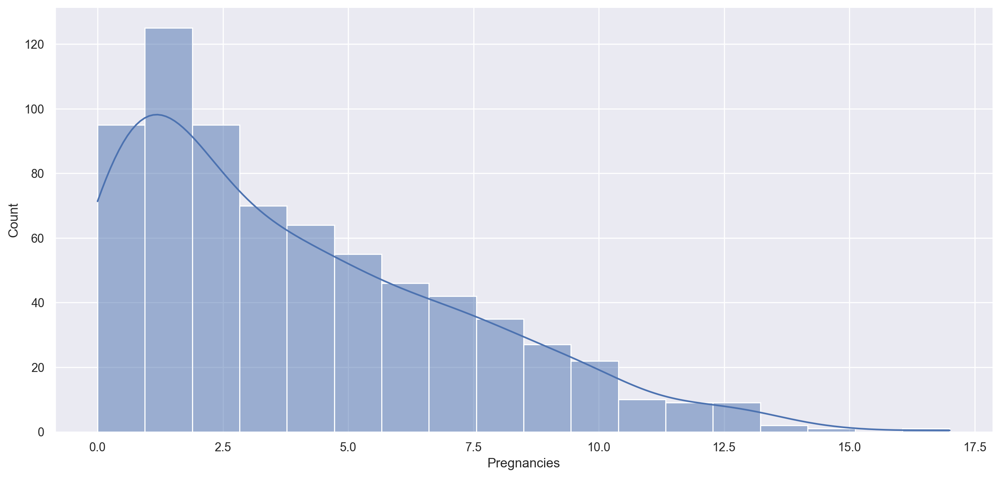

In [76]:
g = sns.displot(data=df3['Pregnancies'], kde=True, bins=18)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

Obliczmy wskaźniki położenia dla rozważanej zmiennej.

In [77]:
show_tab(pos_indicators, df3['Pregnancies'])

-------------------------  --------------------
Najmniejsza wartość (min)  0.00
Największa wartość (max)   17.00
Średnia arytmetyczna       3.90
Kwantyl pierwszy (Q1)      1.00
Mediana (Q2)               3.00
Kwantyl trzeci (Q3)        6.00
Dominanta (moda)           1.00 (125 wystąpień)
-------------------------  --------------------


Możemy zauważyć, że duże wartości oddziałują na wartość średniej, przez co jest ona zauważalnie większa od wartości mediany. Najczęściej występującą wartością jest $1$, zatem większość pacjentek była tylko raz w ciąży. 

(W tym miejscu warto zauważyć, że wszystkie rozważane przez nas rozkłady są jednomodalne, ponieważ są to rozkłady dyskretne. Zatem zawsze moda jest dominantą.)

Obliczmy wskaźniki rozproszenia dla rozważanej zmiennej.

In [78]:
show_tab(scatter_indicators, df3['Pregnancies'])

------------------------------------------------  ---------------------------
Odchylenie standardowe                            3.37
Wariancja                                         11.34
Odchylenie przeciętne                             2.76
Klasyczny współczynnik zmienności                 86.26%
Rozstęp między skrajnymi wartościami (max - min)  17.00
Rozstęp międzykwartylowy (IQR)                    5.00
Odchylenie ćwiartkowe                             2.50
Pozycyjny współczynnik zmienności                 83.33%
Współczynnik asymetrii (skośności)                0.89 (prawostronnie skośny)
Kurtoza                                           3.16
Współczynnik wyostrzenia                          0.16 (leptokurtyczny)
------------------------------------------------  ---------------------------


Widzimy, że odchylenie standardowe (odchylenie od wartości średniej) ma dużą wartość. Podobna sytuacja dotyczy odchylenia przeciętnego (odchylenia od mediany). Jeszcze dokładniej widzimy to, analizując wartości współczynników zmienności (klasycznego, liczonego jako stosunek odchylenia standardowego do średniej arytmetycznej oraz pozycyjnego, liczonego jako stosunek odchylenia ćwiartkowego do mediany). Oznacza to, że analizowaną zmienną charakteryzuje duże rozproszenie wartości, a więc wśród badanych pacjentek występuje bardzo duża rozbieżność w liczbie odbytych ciąż. 

Rozkład jest prawostronnie skośny, co oznacza, że jego ciężar jest przeniesiony na prawą stronę od wartości oczekiwanej, równej w tym przypadku średniej arytmetycznej. Innymi słowy, obserwujemy wydłużony prawy ogon rozkładu. Rozkład jest także rozkładem leptokurtycznym (wysmukłym - o smuklejszym szczycie i cięższym ogonie niż rozkład normalny).

Zobaczmy, jak zmieni się rozkład, gdy pogrupujemy wartości zmiennej ```Pregnancies``` według wyniku testu na cukrzycę (zmiennej ```Outcome```).

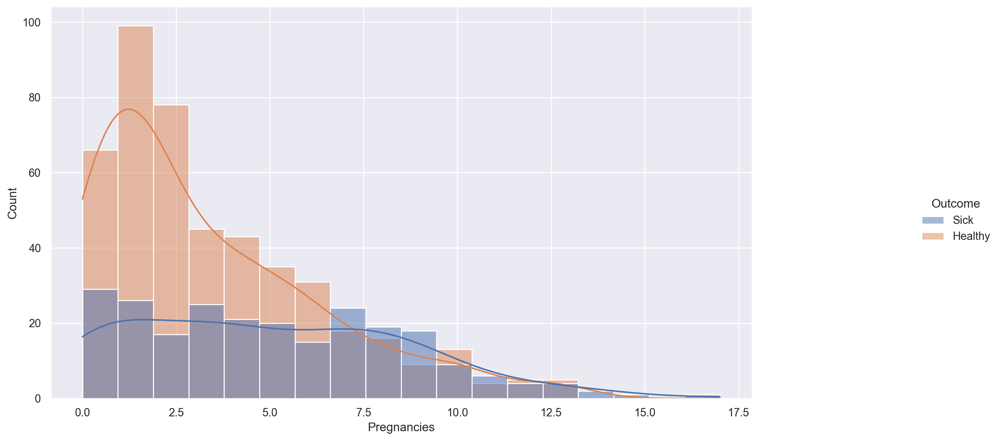

In [79]:
g = sns.displot(x='Pregnancies', data=df3, kde=True, hue='Outcome', bins=18)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

* Pacjentki zdrowe

In [80]:
# df2 is the same as df3 except for an Outcome column which is numeric in df2
values = df2['Pregnancies'][df2['Outcome'] == 0]
show_tab(pos_indicators, values)

-------------------------  -------------------
Najmniejsza wartość (min)  0.00
Największa wartość (max)   13.00
Średnia arytmetyczna       3.33
Kwantyl pierwszy (Q1)      1.00
Mediana (Q2)               2.00
Kwantyl trzeci (Q3)        5.00
Dominanta (moda)           1.00 (99 wystąpień)
-------------------------  -------------------


In [81]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            3.03
Wariancja                                         9.20
Odchylenie przeciętne                             2.44
Klasyczny współczynnik zmienności                 90.98%
Rozstęp między skrajnymi wartościami (max - min)  13.00
Rozstęp międzykwartylowy (IQR)                    4.00
Odchylenie ćwiartkowe                             2.00
Pozycyjny współczynnik zmienności                 100.00%
Współczynnik asymetrii (skośności)                1.11 (prawostronnie skośny)
Kurtoza                                           3.67
Współczynnik wyostrzenia                          0.67 (leptokurtyczny)
------------------------------------------------  ---------------------------


* Pacjentki chore

In [82]:
values = df2['Pregnancies'][df2['Outcome'] == 1]
show_tab(pos_indicators, values)

-------------------------  -------------------
Najmniejsza wartość (min)  0.00
Największa wartość (max)   17.00
Średnia arytmetyczna       5.01
Kwantyl pierwszy (Q1)      2.00
Mediana (Q2)               5.00
Kwantyl trzeci (Q3)        8.00
Dominanta (moda)           0.00 (29 wystąpień)
-------------------------  -------------------


In [83]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            3.70
Wariancja                                         13.68
Odchylenie przeciętne                             3.09
Klasyczny współczynnik zmienności                 73.86%
Rozstęp między skrajnymi wartościami (max - min)  17.00
Rozstęp międzykwartylowy (IQR)                    6.00
Odchylenie ćwiartkowe                             3.00
Pozycyjny współczynnik zmienności                 60.00%
Współczynnik asymetrii (skośności)                0.48 (prawostronnie skośny)
Kurtoza                                           2.60
Współczynnik wyostrzenia                          -0.40 (platykurtyczny)
------------------------------------------------  ---------------------------


Widzimy, że w przypadku osób chorych na cukrzycę, rozkład zmiennej ```Pregnancies``` jest bardzo spłaszczony i nie ma wyraźnie widocznej mody, natomiast, dla osób zdrowych, rozkład stał się jeszcze bardziej wysmukły niż rozkład nieuwzględniający podziału na pacjentki chore i zdrowe.

Widzimy również, że w przypadku chorych pacjentek, średnia oraz mediana liczby ciąż znacząco wzrosły. Co ciekawe, jednocześnie dominanta, w przypadku chorych pacjentek, wynosi $0$, a w przypadku zdrowych, jest równa $1$, więc większość chorych pacjentek nie zaszła ani razu w ciążę, ale równocześnie, to właśnie wśród pacjentek chorych na cukrzycę, znalazły się kobiety, które odbyły największą liczbę ciąż (wartość maksymalna wynosi $17$ w porównaniu do wartości maksymalnej dla osób zdrowych, wynoszącej $13$).

###### Cecha: ```Glucose```

Zobaczmy, jak na wykresie prezentuje się rozkład zmiennej ```Glucose```.

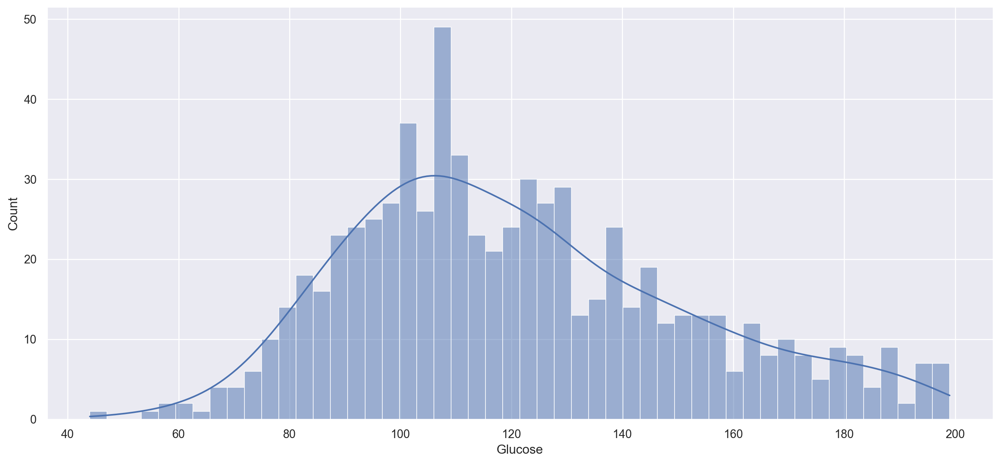

In [84]:
g = sns.displot(data=df3['Glucose'], kde=True, bins=50)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

Obliczmy wskaźniki położenia dla rozważanej zmiennej.

In [85]:
show_tab(pos_indicators, df3['Glucose'])

-------------------------  ---------------------
Najmniejsza wartość (min)  44.00
Największa wartość (max)   199.00
Średnia arytmetyczna       121.48
Kwantyl pierwszy (Q1)      99.00
Mediana (Q2)               117.00
Kwantyl trzeci (Q3)        141.00
Dominanta (moda)           100.00 (16 wystąpień)
-------------------------  ---------------------


W przypadku tej zmiennej, obserwujemy zbliżone wartości średniej arytmetycznej oraz mediany. Wśród badanych, najczęściej występującą wartością glukozy jest $100$, czyli większość pacjentek ma glukozę w normie (za normę uznaje się przedział $70-139$ $\frac{\text{mg}}{\text{dL}}$). Jest to uzasadnione, ponieważ aż $2/3$, czyli większość badanych, stanowią pacjentki zdrowe.

Obliczmy wskaźniki rozproszenia dla rozważanej zmiennej.

In [86]:
show_tab(scatter_indicators, df3['Glucose'])

------------------------------------------------  ---------------------------
Odchylenie standardowe                            30.46
Wariancja                                         927.92
Odchylenie przeciętne                             24.63
Klasyczny współczynnik zmienności                 25.07%
Rozstęp między skrajnymi wartościami (max - min)  155.00
Rozstęp międzykwartylowy (IQR)                    42.00
Odchylenie ćwiartkowe                             21.00
Pozycyjny współczynnik zmienności                 17.95%
Współczynnik asymetrii (skośności)                0.52 (prawostronnie skośny)
Kurtoza                                           2.70
Współczynnik wyostrzenia                          -0.30 (platykurtyczny)
------------------------------------------------  ---------------------------


Widzimy, że w przypadku tego rozkładu, współczynniki zmienności są dużo mniejsze niż dla zmiennej ```Pregnancies```. Oznacza to, że zmierzone wartości glukozy są w większym stopniu skoncentrowane (występuje mniejsze rozproszenie wartości). Rozkład jest również prawostronnie skośny, co jest uzasadnione, ponieważ wśród badanych, około $1/3$ pacjentek jest chora na cukrzycę, a więc z reguły ma podwyższoną wartość glukozy. Rozkład jest także platykurtyczny, co oznacza, że ma bardziej spłaszczony szczyt oraz lżejszy ogon od rozkładu normalnego.

Zobaczmy, jak zmieni się rozkład, gdy pogrupujemy wartości zmiennej ```Glucose``` według wyniku testu na cukrzycę (zmiennej ```Outcome```).

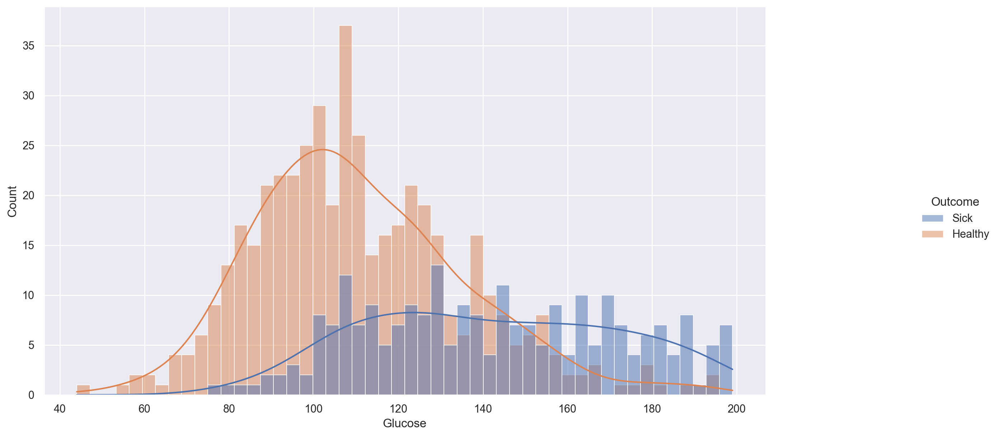

In [87]:
g = sns.displot(x='Glucose', data=df3, kde=True, hue='Outcome', bins=50)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

* Pacjentki zdrowe

In [88]:
values = df2['Glucose'][df2['Outcome'] == 0]
show_tab(pos_indicators, values)

-------------------------  --------------------
Najmniejsza wartość (min)  44.00
Największa wartość (max)   194.00
Średnia arytmetyczna       110.74
Kwantyl pierwszy (Q1)      93.00
Mediana (Q2)               107.00
Kwantyl trzeci (Q3)        125.00
Dominanta (moda)           99.00 (15 wystąpień)
-------------------------  --------------------


In [89]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            24.72
Wariancja                                         610.97
Odchylenie przeciętne                             19.47
Klasyczny współczynnik zmienności                 22.32%
Rozstęp między skrajnymi wartościami (max - min)  150.00
Rozstęp międzykwartylowy (IQR)                    32.00
Odchylenie ćwiartkowe                             16.00
Pozycyjny współczynnik zmienności                 14.95%
Współczynnik asymetrii (skośności)                0.60 (prawostronnie skośny)
Kurtoza                                           3.49
Współczynnik wyostrzenia                          0.49 (leptokurtyczny)
------------------------------------------------  ---------------------------


* Pacjentki chore

In [90]:
values = df2['Glucose'][df2['Outcome'] == 1]
show_tab(pos_indicators, values)

-------------------------  --------------------
Najmniejsza wartość (min)  78.00
Największa wartość (max)   199.00
Średnia arytmetyczna       142.29
Kwantyl pierwszy (Q1)      118.00
Mediana (Q2)               142.00
Kwantyl trzeci (Q3)        167.00
Dominanta (moda)           125.00 (6 wystąpień)
-------------------------  --------------------


In [91]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            29.80
Wariancja                                         887.82
Odchylenie przeciętne                             25.44
Klasyczny współczynnik zmienności                 20.94%
Rozstęp między skrajnymi wartościami (max - min)  121.00
Rozstęp międzykwartylowy (IQR)                    49.00
Odchylenie ćwiartkowe                             24.50
Pozycyjny współczynnik zmienności                 17.25%
Współczynnik asymetrii (skośności)                0.07 (prawostronnie skośny)
Kurtoza                                           2.01
Współczynnik wyostrzenia                          -0.99 (platykurtyczny)
------------------------------------------------  ---------------------------


Możemy zaobserwować, że po pogrupowaniu wartości w zależności od wyniku testu na cukrzycę, otrzymujemy nieznacznie mniejszą zmienność (oba współczynniki zmienności) w przypadku obu grup. Rozkład zmiennej ```Glucose``` dla zdrowych osób, jest bardziej wysmukły niż wspólny rozkład, natomiast dla chorych pacjentek, rozkład jest w dużym stopniu spłaszczony. Oznacza to, że większość zdrowych pacjentek, ma glukozę o zbliżonej wartości. Tego samego nie możemy powiedzieć o pacjentkech chorych.

Widzimy również, że wartości średniej oraz mediany dla chorych pacjentek są znacznie wyższe niż wartości tych zmiennych dla pacjentek zdrowych. Podobna zależność dotyczy najmniejszej zmierzonej wartości glukozy, która w przypadku chorych osób jest prawie dwukrotnie wyższa niż w przypadku osób zdrowych.

###### Cecha: ```BloodPressure```

Zobaczmy, jak na wykresie prezentuje się rozkład zmiennej ```BloodPressure```.

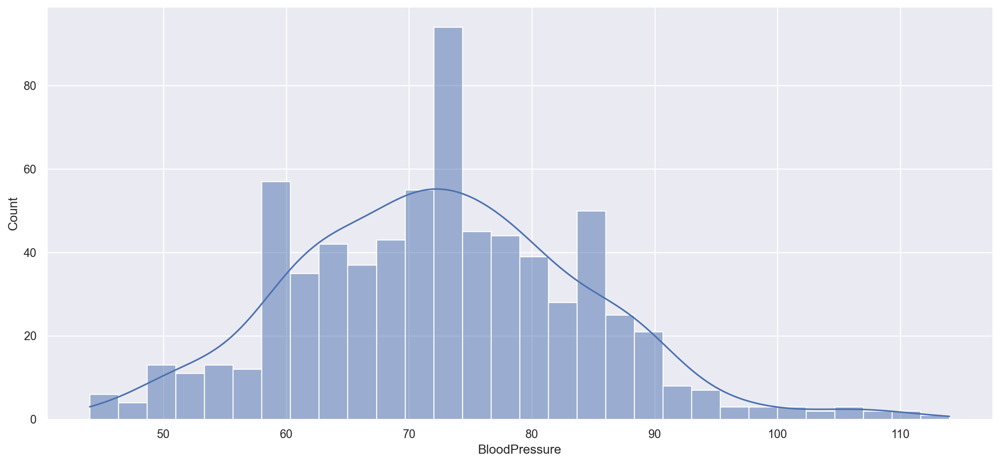

In [92]:
g = sns.displot(data=df3['BloodPressure'], kde=True, bins=30)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

Obliczmy wskaźniki położenia dla rozważanej zmiennej.

In [93]:
show_tab(pos_indicators, df3['BloodPressure'])

-------------------------  --------------------
Najmniejsza wartość (min)  44.00
Największa wartość (max)   114.00
Średnia arytmetyczna       72.49
Kwantyl pierwszy (Q1)      64.00
Mediana (Q2)               72.00
Kwantyl trzeci (Q3)        80.00
Dominanta (moda)           70.00 (55 wystąpień)
-------------------------  --------------------


Widzimy, że mediana niemalże idealnie pokrywa się z wartością średnią. Oznacza to, że dana zmienna ma rozkład zbliżony do rozkładu symetrycznego. Możemy również zauważyć, że dominującą wartością ciśnienia rozkurczowego krwi jest $70$, czyli wartość uznawana za normalną.

Obliczmy wskaźniki rozproszenia dla rozważanej zmiennej.

In [94]:
show_tab(scatter_indicators, df3['BloodPressure'])

------------------------------------------------  ---------------------------
Odchylenie standardowe                            11.74
Wariancja                                         137.74
Odchylenie przeciętne                             9.31
Klasyczny współczynnik zmienności                 16.19%
Rozstęp między skrajnymi wartościami (max - min)  70.00
Rozstęp międzykwartylowy (IQR)                    16.00
Odchylenie ćwiartkowe                             8.00
Pozycyjny współczynnik zmienności                 11.11%
Współczynnik asymetrii (skośności)                0.26 (prawostronnie skośny)
Kurtoza                                           3.21
Współczynnik wyostrzenia                          0.21 (leptokurtyczny)
------------------------------------------------  ---------------------------


Na podstawie powyższej tabelki, możemy stwierdzić, że rozkład jest zbliżony do rozkładu symetrycznego. Poza tym, współczynniki zmienności mają także niewielką wartość, więc rozkład charakteryzuje niewielkie rozproszenie zmierzonych wartości. Widzimy również, że rozkład jest nieznacznie leptokurtyczny, co oznacza, że ma trochę bardziej zwężony szczyt niż rozkład normalny i jednocześnie nieznacznie cięższe ogony.

Zobaczmy, jak zmieni się rozkład, gdy pogrupujemy wartości zmiennej ```BloodPressure``` według wyniku testu na cukrzycę (zmiennej ```Outcome```).

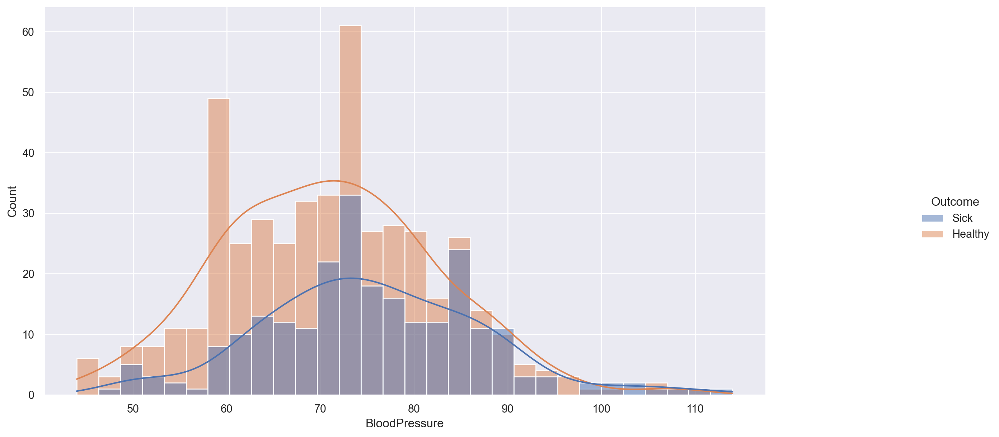

In [95]:
g = sns.displot(x='BloodPressure', data=df3, kde=True, hue='Outcome', bins=30)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

* Pacjentki zdrowe

In [96]:
values = df2['BloodPressure'][df2['Outcome'] == 0]
show_tab(pos_indicators, values)

-------------------------  --------------------
Najmniejsza wartość (min)  44.00
Największa wartość (max)   110.00
Średnia arytmetyczna       70.95
Kwantyl pierwszy (Q1)      62.00
Mediana (Q2)               70.00
Kwantyl trzeci (Q3)        78.00
Dominanta (moda)           70.00 (33 wystąpień)
-------------------------  --------------------


In [97]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            11.49
Wariancja                                         131.91
Odchylenie przeciętne                             9.21
Klasyczny współczynnik zmienności                 16.19%
Rozstęp między skrajnymi wartościami (max - min)  66.00
Rozstęp międzykwartylowy (IQR)                    16.00
Odchylenie ćwiartkowe                             8.00
Pozycyjny współczynnik zmienności                 11.43%
Współczynnik asymetrii (skośności)                0.25 (prawostronnie skośny)
Kurtoza                                           3.07
Współczynnik wyostrzenia                          0.07 (leptokurtyczny)
------------------------------------------------  ---------------------------


* Pacjentki chore

In [98]:
values = df2['BloodPressure'][df2['Outcome'] == 1]
show_tab(pos_indicators, values)

-------------------------  --------------------
Najmniejsza wartość (min)  48.00
Największa wartość (max)   114.00
Średnia arytmetyczna       75.48
Kwantyl pierwszy (Q1)      68.00
Mediana (Q2)               74.00
Kwantyl trzeci (Q3)        84.00
Dominanta (moda)           70.00 (22 wystąpień)
-------------------------  --------------------


In [99]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            11.66
Wariancja                                         136.02
Odchylenie przeciętne                             9.12
Klasyczny współczynnik zmienności                 15.45%
Rozstęp między skrajnymi wartościami (max - min)  66.00
Rozstęp międzykwartylowy (IQR)                    16.00
Odchylenie ćwiartkowe                             8.00
Pozycyjny współczynnik zmienności                 10.81%
Współczynnik asymetrii (skośności)                0.29 (prawostronnie skośny)
Kurtoza                                           3.45
Współczynnik wyostrzenia                          0.45 (leptokurtyczny)
------------------------------------------------  ---------------------------


W przypadku rozdzielenia wartości na grupy, zależne od wyniku testu na cukrzycę, widzimy, że rozkład, odpowiadający wartościom dla osób chorych, jest przesunięty nieco bardziej w prawą stronę. Obserwujemy większą wartość mediany oraz średniej arytmetycznej niż dla rozkładu, odpowiadającego zdrowym osobom. Wciąż jednak oba rozkłady charakteryzuje niewielka zmienność oraz współczynnik asymetrii bliski zeru (rozkłady są prawie symetryczne).

###### Cecha: ```SkinThickness```

Zobaczmy, jak na wykresie prezentuje się rozkład zmiennej ```SkinThickness```.

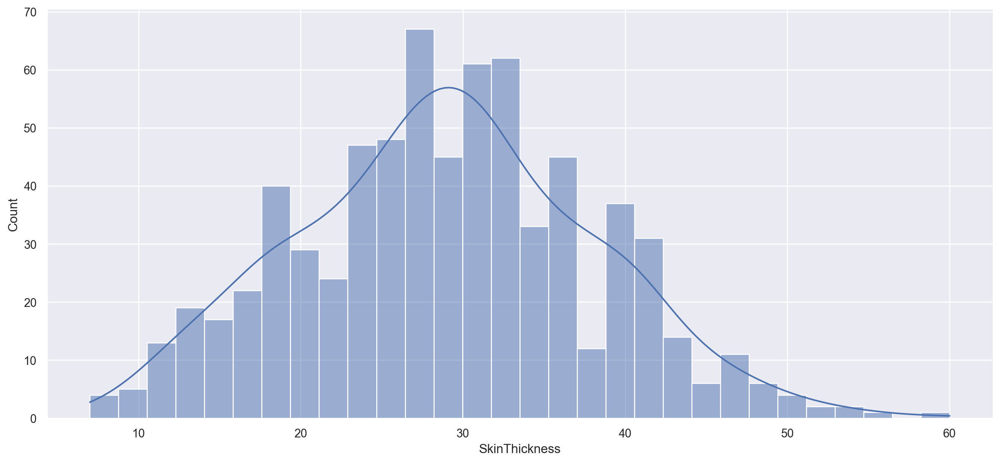

In [100]:
g = sns.displot(data=df3['SkinThickness'], kde=True, bins=30)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

Obliczmy wskaźniki położenia dla rozważanej zmiennej.

In [101]:
show_tab(pos_indicators, df3['SkinThickness'])

-------------------------  --------------------
Najmniejsza wartość (min)  7.00
Największa wartość (max)   60.00
Średnia arytmetyczna       28.94
Kwantyl pierwszy (Q1)      23.00
Mediana (Q2)               29.00
Kwantyl trzeci (Q3)        35.00
Dominanta (moda)           32.00 (31 wystąpień)
-------------------------  --------------------


Widzimy, że rożnica między wartością największą a wartością najmniejszą jest całkiem znacząca. Jest to uzasadnione, ponieważ w badanej grupie pacjentek, występowały zarówno pacjentki szczupłe, które mają mniejszą grubość fałdu skórnego oraz pacjentki otyłe, charakteryzujące się grubszym fałdem skórnym. Możemy zauważyć również, że mediana oraz średnia mają bardzo zbliżone wartości, więc rozkład jest prawie symetryczny.

Obliczmy wskaźniki rozproszenia dla rozważanej zmiennej.

In [102]:
show_tab(scatter_indicators, df3['SkinThickness'])

------------------------------------------------  ---------------------------
Odchylenie standardowe                            9.14
Wariancja                                         83.49
Odchylenie przeciętne                             7.26
Klasyczny współczynnik zmienności                 31.57%
Rozstęp między skrajnymi wartościami (max - min)  53.00
Rozstęp międzykwartylowy (IQR)                    12.00
Odchylenie ćwiartkowe                             6.00
Pozycyjny współczynnik zmienności                 20.69%
Współczynnik asymetrii (skośności)                0.13 (prawostronnie skośny)
Kurtoza                                           2.80
Współczynnik wyostrzenia                          -0.20 (platykurtyczny)
------------------------------------------------  ---------------------------


Na podstawie powyższej tabeli, możemy wyciągnąć wniosek, że rozkład zmiennej ```SkinThickness``` ma umiarkowane rozproszenie (wartość współczynnika zmienności), ale jednocześnie jest prawie symetryczny i bliski rozkładowi mezokurtycznemu (współczynnik wyostrzenia jest bliski zeru).

Zobaczmy, jak zmieni się rozkład, gdy pogrupujemy wartości zmiennej ```SkinThickness``` według wyniku testu na cukrzycę (zmiennej ```Outcome```).

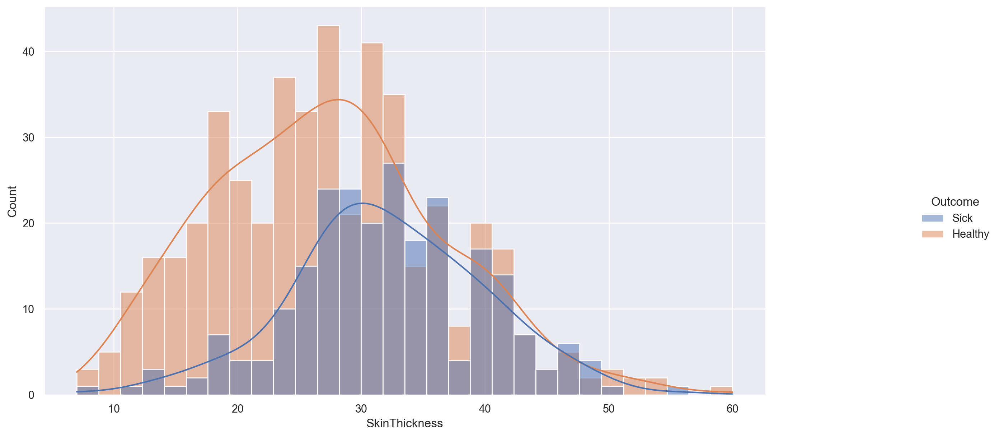

In [103]:
g = sns.displot(x='SkinThickness', data=df3, kde=True, hue='Outcome', bins=30)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

* Osoby zdrowe

In [104]:
values = df2['SkinThickness'][df2['Outcome'] == 0]
show_tab(pos_indicators, values)

-------------------------  --------------------
Najmniejsza wartość (min)  7.00
Największa wartość (max)   60.00
Średnia arytmetyczna       27.27
Kwantyl pierwszy (Q1)      20.00
Mediana (Q2)               27.00
Kwantyl trzeci (Q3)        32.90
Dominanta (moda)           30.00 (19 wystąpień)
-------------------------  --------------------


In [105]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            9.32
Wariancja                                         86.88
Odchylenie przeciętne                             7.47
Klasyczny współczynnik zmienności                 34.18%
Rozstęp między skrajnymi wartościami (max - min)  53.00
Rozstęp międzykwartylowy (IQR)                    12.90
Odchylenie ćwiartkowe                             6.45
Pozycyjny współczynnik zmienności                 23.89%
Współczynnik asymetrii (skośności)                0.35 (prawostronnie skośny)
Kurtoza                                           2.89
Współczynnik wyostrzenia                          -0.11 (platykurtyczny)
------------------------------------------------  ---------------------------


* Osoby chore

In [106]:
values = df2['SkinThickness'][df2['Outcome'] == 1]
show_tab(pos_indicators, values)

-------------------------  --------------------
Najmniejsza wartość (min)  7.00
Największa wartość (max)   56.00
Średnia arytmetyczna       32.17
Kwantyl pierwszy (Q1)      27.20
Mediana (Q2)               32.00
Kwantyl trzeci (Q3)        37.00
Dominanta (moda)           32.00 (14 wystąpień)
-------------------------  --------------------


In [107]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            7.83
Wariancja                                         61.35
Odchylenie przeciętne                             6.13
Klasyczny współczynnik zmienności                 24.35%
Rozstęp między skrajnymi wartościami (max - min)  49.00
Rozstęp międzykwartylowy (IQR)                    9.80
Odchylenie ćwiartkowe                             4.90
Pozycyjny współczynnik zmienności                 15.31%
Współczynnik asymetrii (skośności)                -0.05 (lewostronnie skośny)
Kurtoza                                           3.27
Współczynnik wyostrzenia                          0.27 (leptokurtyczny)
------------------------------------------------  ---------------------------


Po podzieleniu wartości zmiennej na grupy, odpowiadające wynikowi testu widzimy, że rozkład dla osób zdrowych jest zbliżony do rozkładu mezokurtycznego, natomiast rozkład dla osób chorych jest niemalże symetryczny. Również, podobnie jak w przypadku rozkładu zmiennej ```BloodPressure```, rozkład zmiennej ```SkinThickness```, w przypadku osób chorych, jest przesunięty w prawą stronę względem rozkładu dla osób zdrowych. Wartości mediany oraz średniej są odpowiednio większe w przypadku rozkładu dla chorych pacjentek.

###### Cecha: ```Insulin```

Zobaczmy, jak na wykresie prezentuje się rozkład zmiennej ```Insulin```.

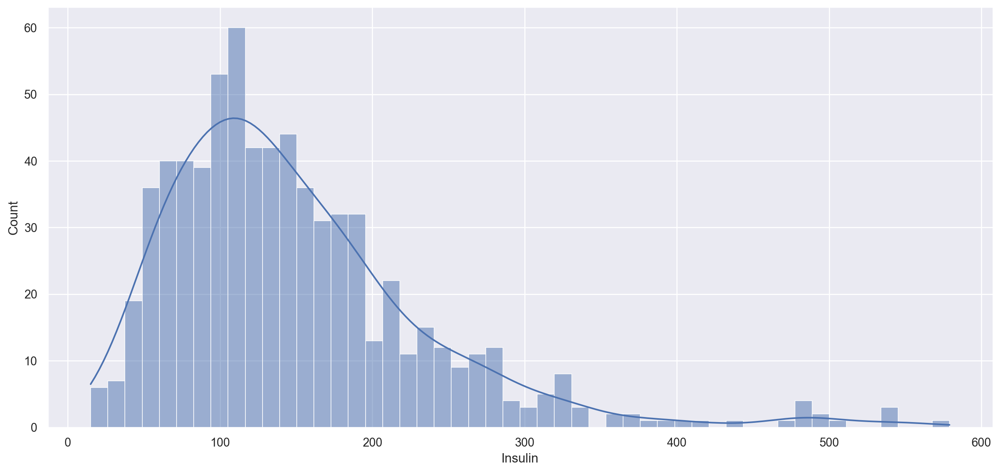

In [108]:
g = sns.displot(data=df3['Insulin'], kde=True, bins=50)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

Obliczmy wskaźniki położenia dla rozważanej zmiennej.

In [109]:
show_tab(pos_indicators, df3['Insulin'])

-------------------------  ---------------------
Najmniejsza wartość (min)  15.00
Największa wartość (max)   579.00
Średnia arytmetyczna       149.11
Kwantyl pierwszy (Q1)      90.00
Mediana (Q2)               130.00
Kwantyl trzeci (Q3)        185.20
Dominanta (moda)           105.00 (11 wystąpień)
-------------------------  ---------------------


Możemy zauważyć, że różnica między największą a najmniejszą wartością jest znacząca. Widzimy także, że średnia odstaje od mediany. Jest to skutkiem występowania długiego prawego ogonu rozkładu, który przesuwa środek ciężkości w stronę dużych wartości insuliny.

Obliczmy wskaźniki rozproszenia dla rozważanej zmiennej.

In [110]:
show_tab(scatter_indicators, df3['Insulin'])

------------------------------------------------  ---------------------------
Odchylenie standardowe                            86.69
Wariancja                                         7515.43
Odchylenie przeciętne                             63.69
Klasyczny współczynnik zmienności                 58.14%
Rozstęp między skrajnymi wartościami (max - min)  564.00
Rozstęp międzykwartylowy (IQR)                    95.20
Odchylenie ćwiartkowe                             47.60
Pozycyjny współczynnik zmienności                 36.62%
Współczynnik asymetrii (skośności)                1.66 (prawostronnie skośny)
Kurtoza                                           7.10
Współczynnik wyostrzenia                          4.10 (leptokurtyczny)
------------------------------------------------  ---------------------------


Jak widzimy, powyższy rozkład charakteryzuje duża zmienność. Jest to efektem znacznego rozproszenia wartości. Rozkład ten jest również silnie prawostronnie skośny, ponieważ ma bardzo wydłużony prawy ogon. Również współczynnik wyostrzenia ma znacznie większą wartość niż w przypadku poprzednich rozkładów, co oznacza, występowanie smuklejszego szczytu oraz cięższych ogonów.

Zobaczmy, jak zmieni się rozkład, gdy pogrupujemy wartości zmiennej ```Insulin``` według wyniku testu na cukrzycę (zmiennej ```Outcome```).

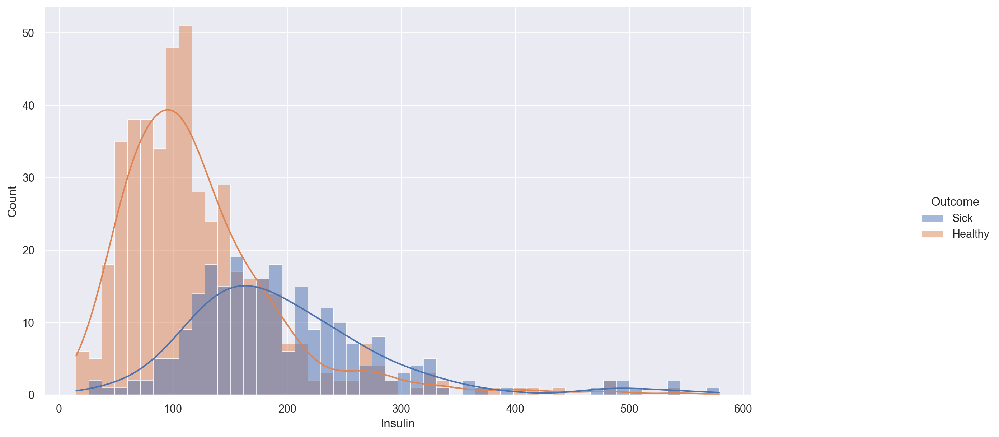

In [111]:
g = sns.displot(x='Insulin', data=df3, kde=True, hue='Outcome', bins=50)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

* Osoby zdrowe

In [112]:
values = df2['Insulin'][df2['Outcome'] == 0]
show_tab(pos_indicators, values)

-------------------------  ---------------------
Najmniejsza wartość (min)  15.00
Największa wartość (max)   545.00
Średnia arytmetyczna       123.20
Kwantyl pierwszy (Q1)      75.10
Mediana (Q2)               107.60
Kwantyl trzeci (Q3)        147.20
Dominanta (moda)           105.00 (10 wystąpień)
-------------------------  ---------------------


In [113]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            72.57
Wariancja                                         5267.11
Odchylenie przeciętne                             50.96
Klasyczny współczynnik zmienności                 58.91%
Rozstęp między skrajnymi wartościami (max - min)  530.00
Rozstęp międzykwartylowy (IQR)                    72.10
Odchylenie ćwiartkowe                             36.05
Pozycyjny współczynnik zmienności                 33.50%
Współczynnik asymetrii (skośności)                2.06 (prawostronnie skośny)
Kurtoza                                           9.40
Współczynnik wyostrzenia                          6.40 (leptokurtyczny)
------------------------------------------------  ---------------------------


* Osoby chore

In [114]:
values = df2['Insulin'][df2['Outcome'] == 1]
show_tab(pos_indicators, values)

-------------------------  --------------------
Najmniejsza wartość (min)  29.00
Największa wartość (max)   579.00
Średnia arytmetyczna       199.32
Kwantyl pierwszy (Q1)      142.00
Mediana (Q2)               181.40
Kwantyl trzeci (Q3)        238.00
Dominanta (moda)           130.00 (5 wystąpień)
-------------------------  --------------------


In [115]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            89.85
Wariancja                                         8073.89
Odchylenie przeciętne                             64.77
Klasyczny współczynnik zmienności                 45.08%
Rozstęp między skrajnymi wartościami (max - min)  550.00
Rozstęp międzykwartylowy (IQR)                    96.00
Odchylenie ćwiartkowe                             48.00
Pozycyjny współczynnik zmienności                 26.46%
Współczynnik asymetrii (skośności)                1.58 (prawostronnie skośny)
Kurtoza                                           6.67
Współczynnik wyostrzenia                          3.67 (leptokurtyczny)
------------------------------------------------  ---------------------------


Jak widzimy, rozkład, odpowiadający chorym osobom ma znacznie większą wartość mediany oraz średniej arytmetycznej od rozkładu, odpowiadającego zdrowym osobom. Zatem poziom insuliny, jaki został zmierzony u pacjentek po dwóch godzinach od podania glukozy, jest dużo wyższy w przypadku chorych osób. 

Co ciekawe, wciąż oba rozkłady są bardzo silnie prawostronnie skośne, a nawet rozkład dla pacjentek, które otrzymały negatywny wynik testu na cukrzycę (tych, które uznajemy za zdrowe), ma jeszcze cięższy prawy ogon od rozkładu dla pacjentek z pozytywnym wynikiem testu. Być może oznacza to, że część testów dała nieprawidłowy wynik (u pacjentek chorych nie została wykryta choroba), bądź wartość insuliny nie jest istotnym czynnikiem, determinującym to, czy dana osoba jest chora.

Oba rozkłady są leptokurtyczne, co oznacza, że mają smukłe szczyty i ciężkie ogony. 

###### Cecha: ```BMI```

Zobaczmy, jak na wykresie prezentuje się rozkład zmiennej ```BMI```.

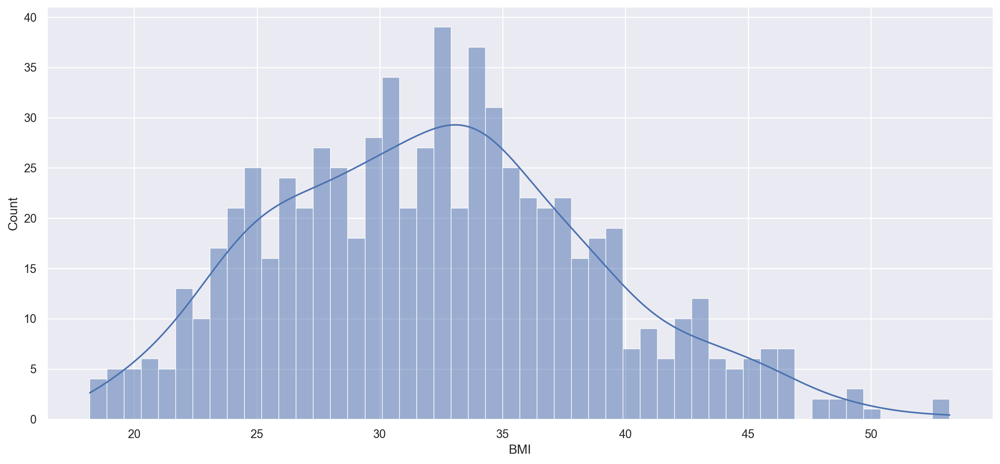

In [116]:
g = sns.displot(data=df3['BMI'], kde=True, bins=50)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

Obliczmy wskaźniki położenia dla rozważanej zmiennej.

In [117]:
show_tab(pos_indicators, df3['BMI'])

-------------------------  --------------------
Najmniejsza wartość (min)  18.20
Największa wartość (max)   53.20
Średnia arytmetyczna       32.29
Kwantyl pierwszy (Q1)      27.48
Mediana (Q2)               32.30
Kwantyl trzeci (Q3)        36.50
Dominanta (moda)           31.20 (12 wystąpień)
-------------------------  --------------------


Wartości BMI często dzieli się na poniższe grupy:

- $0 - 18.49$ - niedowaga,

- $18.50 - 24.99$ - norma,

- $25 - 29.99$ - nadwaga,

- $30 - 34.99$ - otyłość stopnia I,

- $35 - 39.99$ - otyłość stopnia II,

- $\ge40$ - otyłość stopnia III.

Jak możemy zauważyć, największa wartość BMI znacząco przekracza próg $40$ dla otyłości stopnia III. Oznacza to, że w badanej grupie była pacjentka, która miała skrajną otyłość. Najmniejsza wartość BMI natomiast jest poniżej normy i oznacza niedowagę. Widzimy również, że dominującą wartością BMI jest $31.2$, która odpowiada otyłości I stopnia. Również wartość średnia oraz mediana, które są niemalże identyczne, znajują się w przedziale, odpowiadającym otyłości I stopnia. Oznacza to, że wśród pacjentek, największą część stanowiły kobiety, zmagające się z otyłością.

Obliczmy wskaźniki rozproszenia dla rozważanej zmiennej.

In [118]:
show_tab(scatter_indicators, df3['BMI'])

------------------------------------------------  ---------------------------
Odchylenie standardowe                            6.54
Wariancja                                         42.84
Odchylenie przeciętne                             5.26
Klasyczny współczynnik zmienności                 20.27%
Rozstęp między skrajnymi wartościami (max - min)  35.00
Rozstęp międzykwartylowy (IQR)                    9.03
Odchylenie ćwiartkowe                             4.51
Pozycyjny współczynnik zmienności                 13.97%
Współczynnik asymetrii (skośności)                0.31 (prawostronnie skośny)
Kurtoza                                           2.79
Współczynnik wyostrzenia                          -0.21 (platykurtyczny)
------------------------------------------------  ---------------------------


Powyższa tabelka pokazuje, że rozkład charakteryzuje umiarkowana zmienność, więc wartości nie są bardzo rozproszone. Współczynnik skośności jest niewiele większy od $0$, więc rozkład jest nieznacznie prawostronnie skośny. Widzimy również wartość współczynnika wyostrzenia bardzo bliską $0$. Oznacza to, że rozkład przypomina rozkład mezokurtyczny.


Zobaczmy, jak zmieni się rozkład, gdy pogrupujemy wartości zmiennej ```BMI``` według wyniku testu na cukrzycę (zmiennej ```Outcome```).

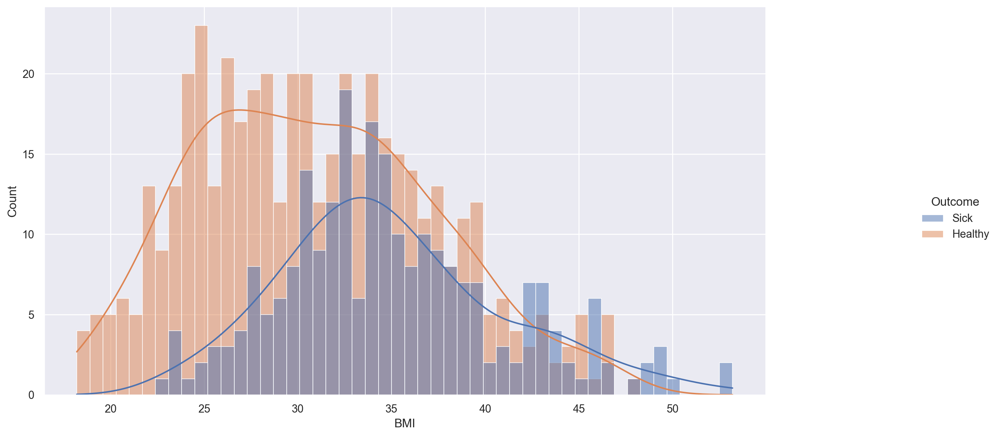

In [119]:
g = sns.displot(x='BMI', data=df3, kde=True, hue='Outcome', bins=50)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

* Osoby zdrowe

In [120]:
values = df2['BMI'][df2['Outcome'] == 0]
show_tab(pos_indicators, values)

-------------------------  -------------------
Najmniejsza wartość (min)  18.20
Największa wartość (max)   47.90
Średnia arytmetyczna       30.89
Kwantyl pierwszy (Q1)      25.90
Mediana (Q2)               30.40
Kwantyl trzeci (Q3)        35.35
Dominanta (moda)           30.80 (7 wystąpień)
-------------------------  -------------------


In [121]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            6.38
Wariancja                                         40.69
Odchylenie przeciętne                             5.28
Klasyczny współczynnik zmienności                 20.65%
Rozstęp między skrajnymi wartościami (max - min)  29.70
Rozstęp międzykwartylowy (IQR)                    9.45
Odchylenie ćwiartkowe                             4.72
Pozycyjny współczynnik zmienności                 15.54%
Współczynnik asymetrii (skośności)                0.31 (prawostronnie skośny)
Kurtoza                                           2.49
Współczynnik wyostrzenia                          -0.51 (platykurtyczny)
------------------------------------------------  ---------------------------


* Osoby chore

In [122]:
values = df2['BMI'][df2['Outcome'] == 1]
show_tab(pos_indicators, values)

-------------------------  -------------------
Najmniejsza wartość (min)  22.90
Największa wartość (max)   53.20
Średnia arytmetyczna       35.01
Kwantyl pierwszy (Q1)      30.90
Mediana (Q2)               34.20
Kwantyl trzeci (Q3)        38.20
Dominanta (moda)           31.60 (7 wystąpień)
-------------------------  -------------------


In [123]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            6.00
Wariancja                                         35.95
Odchylenie przeciętne                             4.69
Klasyczny współczynnik zmienności                 17.13%
Rozstęp między skrajnymi wartościami (max - min)  30.30
Rozstęp międzykwartylowy (IQR)                    7.30
Odchylenie ćwiartkowe                             3.65
Pozycyjny współczynnik zmienności                 10.67%
Współczynnik asymetrii (skośności)                0.56 (prawostronnie skośny)
Kurtoza                                           3.12
Współczynnik wyostrzenia                          0.12 (leptokurtyczny)
------------------------------------------------  ---------------------------


Po podzieleniu wartości na grupy zależne od wyniku testu, widzimy, że dla osób z pozytywnym wynikiem testu, wartość mediany oraz średniej zmalała względem rozkładu, nie uwzględniającego podziału na osoby z pozytywnym wynikiem oraz z wynikiem negatywnym. W przypadku pacjentek, dla których wynik jest pozytywny, średnia oraz mediana wzrosły. Podobną zależność obserwujemy, w przypadku najmniejszej i największej wartości. Obie te wartości są mniejsze dla osób z negatywnym wynikiem niż dla osób z wynikiem pozytywnym.

Widzimy również, że oba rozkłady są prawostronnie skośne, co oznacza występowanie cięższego prawego ogona. Rozkład, odpowiadający pacjentkom z negatywnym wynikiem testu, jest rozkładem platykurtycznym, co można łatwo zauważyć na wykresie. W przypadku tej grupy widzimy szczególnie duże nagromadzenie wartości BMI między $25$ a $35$. Wszystkie wartości z tego przedziału oznaczają nadwagę lub otyłość I stopnia.

###### Cecha: ```DiabetesPedigreeFunction```

Zobaczmy, jak na wykresie prezentuje się rozkład zmiennej ```DiabetesPedigreeFunction```.

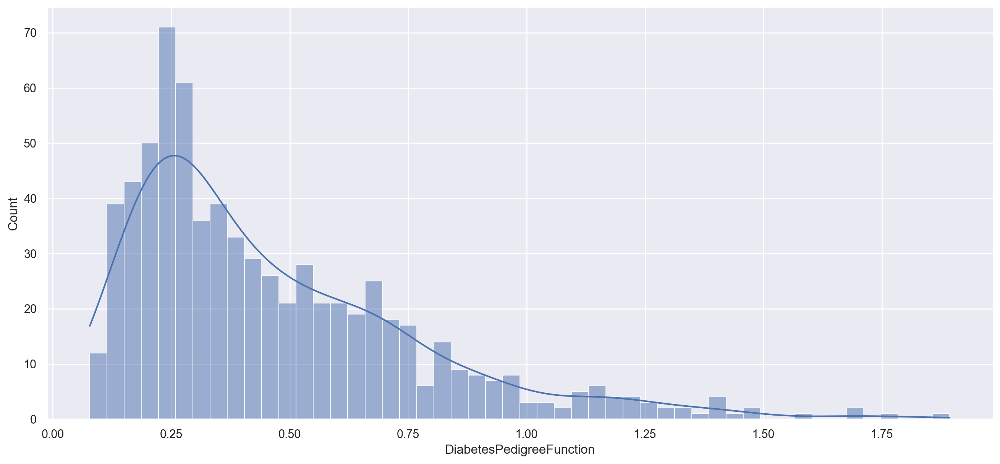

In [124]:
g = sns.displot(data=df3['DiabetesPedigreeFunction'], kde=True, bins=50)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

Obliczmy wskaźniki położenia dla rozważanej zmiennej.

In [125]:
show_tab(pos_indicators, df3['DiabetesPedigreeFunction'])

-------------------------  ------------------
Najmniejsza wartość (min)  0.08
Największa wartość (max)   1.89
Średnia arytmetyczna       0.46
Kwantyl pierwszy (Q1)      0.24
Mediana (Q2)               0.37
Kwantyl trzeci (Q3)        0.62
Dominanta (moda)           0.25 (6 wystąpień)
-------------------------  ------------------


Istnieje dość duża rozbieżność między wartością najmniejszą a największą. Występuje również zauważalna różnica między średnią arytmetyczną a medianą wartości. Oznacza to, że rozkład nie jest symetryczny (co widzimy na powyższym wykresie).

Obliczmy wskaźniki rozproszenia dla rozważanej zmiennej.

In [126]:
show_tab(scatter_indicators, df3['DiabetesPedigreeFunction'])

------------------------------------------------  ---------------------------
Odchylenie standardowe                            0.31
Wariancja                                         0.09
Odchylenie przeciętne                             0.24
Klasyczny współczynnik zmienności                 65.80%
Rozstęp między skrajnymi wartościami (max - min)  1.81
Rozstęp międzykwartylowy (IQR)                    0.38
Odchylenie ćwiartkowe                             0.19
Pozycyjny współczynnik zmienności                 50.97%
Współczynnik asymetrii (skośności)                1.41 (prawostronnie skośny)
Kurtoza                                           5.19
Współczynnik wyostrzenia                          2.19 (leptokurtyczny)
------------------------------------------------  ---------------------------


Widzimy, że rozkład jest dosyć silnie prawostronnie skośny. Rozkład charakteryzuje także znacząca zmienność, co oznacza duże rozproszenie wartości. Także współczynnik wyostrzenia ma dużą wartość, rozkład jest silnie leptokurtyczny, a więc ma smukły szczyt oraz ciężkie ogony.

Zobaczmy, jak zmieni się rozkład, gdy pogrupujemy wartości zmiennej ```DiabetesPedigreeFunction``` według wyniku testu na cukrzycę (zmiennej ```Outcome```).

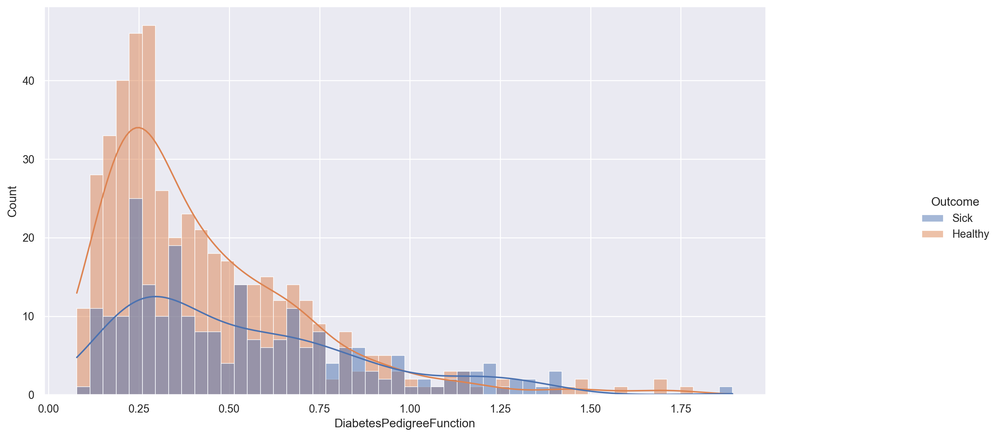

In [127]:
g = sns.displot(x='DiabetesPedigreeFunction', data=df3, kde=True, hue='Outcome', bins=50)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

* Osoby zdrowe

In [128]:
values = df2['DiabetesPedigreeFunction'][df2['Outcome'] == 0]
show_tab(pos_indicators, values)

-------------------------  ------------------
Najmniejsza wartość (min)  0.08
Największa wartość (max)   1.78
Średnia arytmetyczna       0.43
Kwantyl pierwszy (Q1)      0.23
Mediana (Q2)               0.34
Kwantyl trzeci (Q3)        0.56
Dominanta (moda)           0.17 (4 wystąpień)
-------------------------  ------------------


In [129]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            0.28
Wariancja                                         0.08
Odchylenie przeciętne                             0.21
Klasyczny współczynnik zmienności                 66.64%
Rozstęp między skrajnymi wartościami (max - min)  1.70
Rozstęp międzykwartylowy (IQR)                    0.33
Odchylenie ćwiartkowe                             0.16
Pozycyjny współczynnik zmienności                 48.88%
Współczynnik asymetrii (skośności)                1.68 (prawostronnie skośny)
Kurtoza                                           6.70
Współczynnik wyostrzenia                          3.70 (leptokurtyczny)
------------------------------------------------  ---------------------------


* Osoby chore

In [130]:
values = df2['DiabetesPedigreeFunction'][df2['Outcome'] == 1]
show_tab(pos_indicators, values)

-------------------------  ------------------
Najmniejsza wartość (min)  0.09
Największa wartość (max)   1.89
Średnia arytmetyczna       0.54
Kwantyl pierwszy (Q1)      0.26
Mediana (Q2)               0.45
Kwantyl trzeci (Q3)        0.73
Dominanta (moda)           0.25 (4 wystąpień)
-------------------------  ------------------


In [131]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            0.33
Wariancja                                         0.11
Odchylenie przeciętne                             0.27
Klasyczny współczynnik zmienności                 61.56%
Rozstęp między skrajnymi wartościami (max - min)  1.80
Rozstęp międzykwartylowy (IQR)                    0.47
Odchylenie ćwiartkowe                             0.23
Pozycyjny współczynnik zmienności                 52.35%
Współczynnik asymetrii (skośności)                1.02 (prawostronnie skośny)
Kurtoza                                           3.67
Współczynnik wyostrzenia                          0.67 (leptokurtyczny)
------------------------------------------------  ---------------------------


Po podzieleniu wartości na grupy, obserwujemy dużo większą wartość średniej arytemtycznej oraz mediany, w przypadku wartości, odpowiadających osobom z pozytywnym wynikiem testu w porównaniu do wartości średniej oraz mediany dla osób, które uzyskały wynik negatywny. Oba rozkłady wciąż są prawostronnie skośne. Oba rozkłady są leptokurtyczne, a więc posiadają smukłe szczyty i ciężkie ogony.

###### Cecha: ```Age```

Zobaczmy, jak na wykresie prezentuje się rozkład zmiennej ```DiabetesPedigreeFunction```.

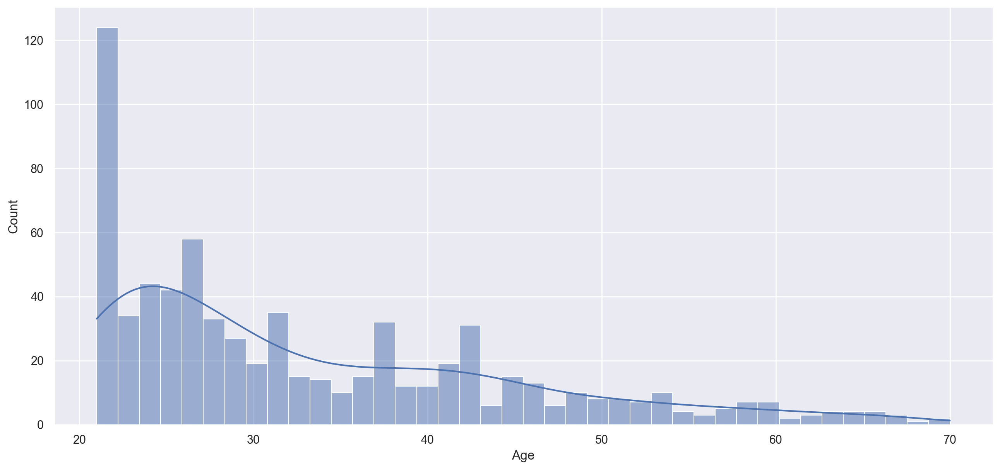

In [132]:
g = sns.displot(data=df3['Age'], kde=True, bins=40)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

Obliczmy wskaźniki położenia dla rozważanej zmiennej.

In [133]:
show_tab(pos_indicators, df3['Age'])

-------------------------  --------------------
Najmniejsza wartość (min)  21.00
Największa wartość (max)   70.00
Średnia arytmetyczna       33.30
Kwantyl pierwszy (Q1)      24.00
Mediana (Q2)               29.00
Kwantyl trzeci (Q3)        41.00
Dominanta (moda)           22.00 (66 wystąpień)
-------------------------  --------------------


Możemy zauważyć, że w badanej grupie pacjentek występowały zarówno osoby młode oraz osoby w podeszłym wieku. Co ciekawe, największą część badanych stanowią osoby w wieku $22$ lat (dominanta). Jest aż $66$ osób w tym wieku. Istnieje również zauważalna różnica między medianą a średnią arytmetyczną. Większa wartość średniej jest uzasadniona, ze względu na obecność długiego prawego ogona.

Obliczmy wskaźniki rozproszenia dla rozważanej zmiennej.

In [134]:
show_tab(scatter_indicators, df3['Age'])

------------------------------------------------  ---------------------------
Odchylenie standardowe                            11.61
Wariancja                                         134.72
Odchylenie przeciętne                             9.56
Klasyczny współczynnik zmienności                 34.86%
Rozstęp między skrajnymi wartościami (max - min)  49.00
Rozstęp międzykwartylowy (IQR)                    17.00
Odchylenie ćwiartkowe                             8.50
Pozycyjny współczynnik zmienności                 29.31%
Współczynnik asymetrii (skośności)                1.04 (prawostronnie skośny)
Kurtoza                                           3.28
Współczynnik wyostrzenia                          0.28 (leptokurtyczny)
------------------------------------------------  ---------------------------


Zobaczmy, jak zmieni się rozkład, gdy pogrupujemy wartości zmiennej ```Age``` według wyniku testu na cukrzycę (zmiennej ```Outcome```).

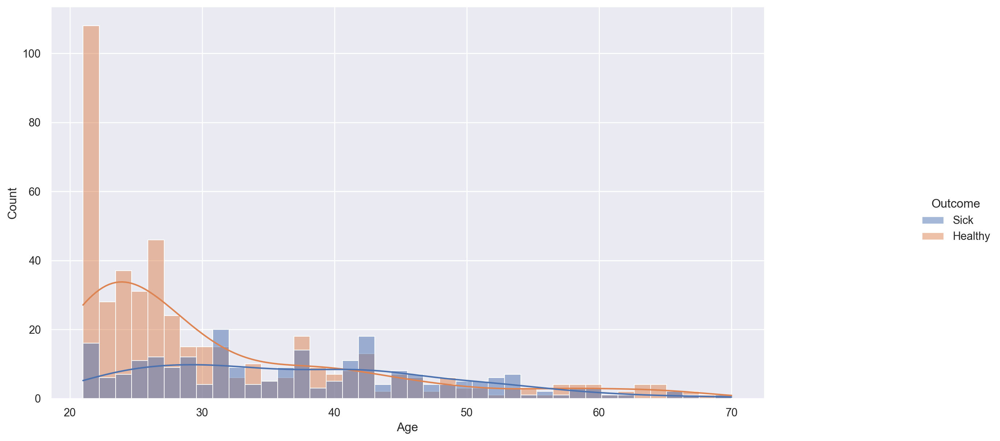

In [135]:
g = sns.displot(x='Age', data=df3, kde=True, hue='Outcome', bins=40)
g.fig.set_figwidth(15)
g.fig.set_figheight(6.5)

* Osoby zdrowe

In [136]:
values = df2['Age'][df2['Outcome'] == 0]
show_tab(pos_indicators, values)

-------------------------  --------------------
Najmniejsza wartość (min)  21.00
Największa wartość (max)   69.00
Średnia arytmetyczna       31.23
Kwantyl pierwszy (Q1)      23.00
Mediana (Q2)               27.00
Kwantyl trzeci (Q3)        37.00
Dominanta (moda)           22.00 (55 wystąpień)
-------------------------  --------------------


In [137]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            11.40
Wariancja                                         129.99
Odchylenie przeciętne                             8.95
Klasyczny współczynnik zmienności                 36.51%
Rozstęp między skrajnymi wartościami (max - min)  48.00
Rozstęp międzykwartylowy (IQR)                    14.00
Odchylenie ćwiartkowe                             7.00
Pozycyjny współczynnik zmienności                 25.93%
Współczynnik asymetrii (skośności)                1.45 (prawostronnie skośny)
Kurtoza                                           4.36
Współczynnik wyostrzenia                          1.36 (leptokurtyczny)
------------------------------------------------  ---------------------------


* Osoby chore

In [138]:
values = df2['Age'][df2['Outcome'] == 1]
show_tab(pos_indicators, values)

-------------------------  --------------------
Najmniejsza wartość (min)  21.00
Największa wartość (max)   70.00
Średnia arytmetyczna       37.30
Kwantyl pierwszy (Q1)      28.00
Mediana (Q2)               36.00
Kwantyl trzeci (Q3)        45.00
Dominanta (moda)           29.00 (12 wystąpień)
-------------------------  --------------------


In [139]:
show_tab(scatter_indicators, values)

------------------------------------------------  ---------------------------
Odchylenie standardowe                            10.96
Wariancja                                         120.02
Odchylenie przeciętne                             9.13
Klasyczny współczynnik zmienności                 29.37%
Rozstęp między skrajnymi wartościami (max - min)  49.00
Rozstęp międzykwartylowy (IQR)                    17.00
Odchylenie ćwiartkowe                             8.50
Pozycyjny współczynnik zmienności                 23.61%
Współczynnik asymetrii (skośności)                0.53 (prawostronnie skośny)
Kurtoza                                           2.62
Współczynnik wyostrzenia                          -0.38 (platykurtyczny)
------------------------------------------------  ---------------------------


Jak możemy zauważyć, średnia oraz mediana wieku osób z pozytywnym wynikiem testu są większe niż te wartości dla osób z negatywnym wynikiem testu. Widzimy również, że rozkład dla osób zdrowych ma dużo wyższą wartość współczynnika skośności od rozkładu dla osób chorych. Wynika to stąd, że w większości osoby zdrowe to osoby młode, więc większa koncentracja wartości przypada na niższy wiek, dlatego rozkład ten posiada dłuższy i cięższy prawy ogon od rozkładu dla osób chorych, dla którego mediana oraz średnia są przesunięte w stronę wyższych wartości.

## Badanie zależności między BMI a wynikiem testu na cukrzycę

Zobaczmy, ile pacjentek ma nadwagę oraz, w jaki sposób BMI jest powiązane posiadaniem cukrzycy. W tym celu dodamy nową kolumnę, w której znajdzie się grupa, odpowiadająca danemu zakresowi BMI, a następnie przyporządkujemy pacjentkom odpowiednie grupy.

In [140]:
BMI_groups = {
    'Underweight': (0, 18.5),
    'Healthy weight': (18.5, 25),
    'Overweight': (25, 30),
    'Obesity 1': (30, 35),
    'Obesity 2': (35, 40),
    'Obesity 3': (40, float('inf'))
}

df3['BMIGroup'] = pd.Series(BMI_groups.keys())

for gr, (lower, upper) in BMI_groups.items():
    df3.loc[(df3['BMI'] >= lower) & (df3['BMI'] < upper), 'BMIGroup'] = gr
    
df3.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,BMIGroup
0,6.0,148.0,72.0,35.0,313.2,33.6,0.627,50.0,Sick,Obesity 1
1,1.0,85.0,66.0,29.0,57.2,26.6,0.351,31.0,Healthy,Overweight
2,8.0,183.0,64.0,30.8,238.0,23.3,0.672,32.0,Sick,Healthy weight
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,Healthy,Overweight
4,5.0,116.0,74.0,23.0,128.4,25.6,0.201,30.0,Healthy,Overweight


Sprawdźmy, ile jest pacjentek z poszczególnych kategorii BMI.

In [141]:
df3['BMIGroup'].value_counts()

Obesity 1         214
Overweight        168
Obesity 2         143
Healthy weight     94
Obesity 3          85
Underweight         4
Name: BMIGroup, dtype: int64

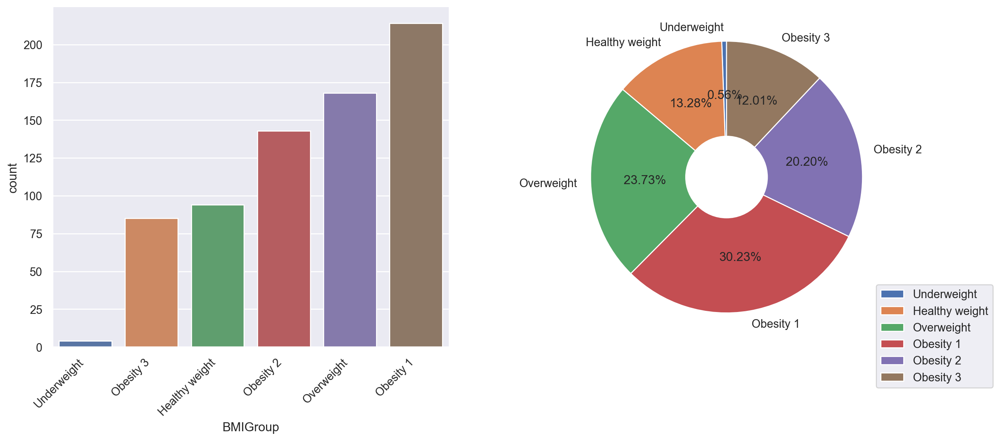

In [142]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

orderby = df3.groupby('BMIGroup').count().sort_values(by='Outcome').index
g = sns.countplot(ax=ax[0], data=df3, x='BMIGroup', order=orderby)
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')

BMI_by_groups = dict.fromkeys(BMI_groups, 0)

for gr in BMI_by_groups:
    BMI_by_groups[gr] = df3['BMIGroup'][df3['BMIGroup'] == gr].count()
    
counts = BMI_by_groups.values()
labels = BMI_by_groups.keys()
plt.pie(counts, labels=labels, autopct="%.2f%%", startangle=90)

center_hole = plt.Circle((0, 0), .3, color='white')
plt.gcf().gca().add_artist(center_hole)
plt.legend(bbox_to_anchor=(1.3, .2))

sns.despine()

Jak widzimy, bardzo duża część osób ma nadwagę. Sprawdźmy, czy nadwaga dotyczy głównie osób z cukrzycą, czy obecność choroby nie zależy od BMI.

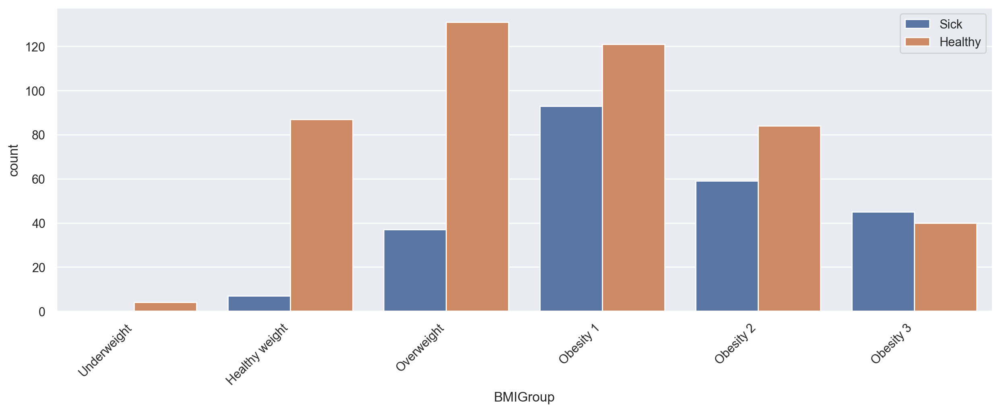

In [143]:
plt.figure(figsize=(15, 5))
g = sns.countplot(data=df3, x='BMIGroup', hue='Outcome', order=BMI_by_groups)
g.legend(loc='upper right')
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

Na podstawie powyższego wykresu, wydawać by się mogło, że nie ma ścisłej zależności między BMI a cukrzycą. Jedynie u osób ze skrajną nadwagą (typu 3), obserwujemy większą liczbę osób chorych na cukrzycę niż zdrowych. Musimy jednak mieć na uwadze, że jedynie $34\%$ przebadanych pacjentek ma stwierdzoną cukrzycę. Powinniśmy więc znormalizować wykres, aby przedstawiał liczbę osób z danej kategorii wagowej o danym wyniku testu na cukrzycę w stosunku do łącznej liczby osób o tym samym wyniku testu na cukrzycę.

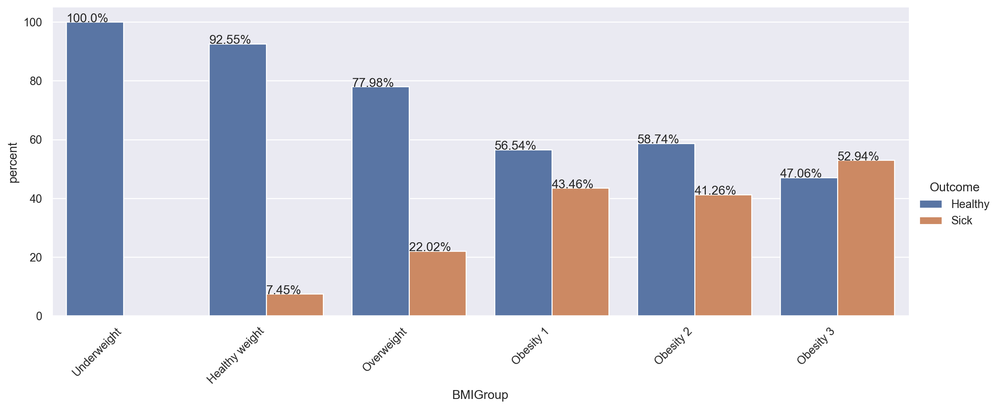

In [144]:
df4 = df3.groupby('BMIGroup')['Outcome'].value_counts(normalize=True)
df4 = df4.mul(100)
df4 = df4.rename('percent').reset_index()
g = sns.catplot(data=df4, kind='bar', x='BMIGroup', y='percent', hue='Outcome', 
                order=BMI_by_groups.keys(), height=5, aspect=2.5)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x()
    txt_y = p.get_height()
    if np.isnan(txt_x): txt_x = 0
    if np.isnan(txt_y): txt_y = 0
    g.ax.text(txt_x, txt_y, '' if not txt_y else txt)

plt.xticks(rotation=45, horizontalalignment='right')
plt.show()

Powyższy wykres już wyraźnie ilustruje zależność między wartością BMI a obecnością cukrzycy. Widzimy, że procentowy udział osób chorych na cukrzycę jest tym większy, im większe BMI ma badana grupa. Zatem, możemy wyciągnąć wniosek, iż na zachorowanie na cukrzycę narażone są w większym stopniu osoby otyłe niż osoby, których masa jest w normie.

## Badanie zależności między wartością insuliny a wynikiem testu na cukrzycę

Według informacji zawartych na stronie internetowej https://emedicine.medscape.com/article/2089224-overview, normalne poziomy insuliny przedstawiają się następująco (w pliku pdf nie jest widoczny obrazek z tabelką):

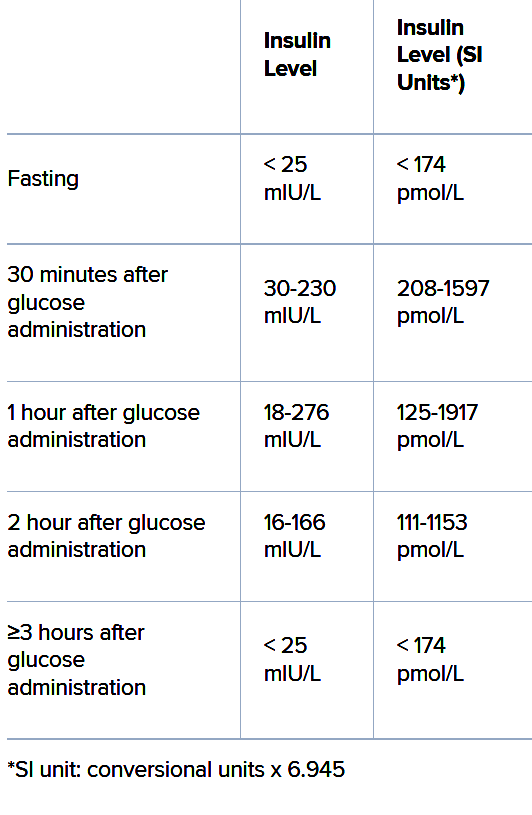</img>


Ponieważ, w przypadku pacjentek, których dotyczy analizowany zbiór danych, insulina była mierzona po upływie $2$ godzin od podania glukozy, za normalny poziom insuliny uznaje się przedział $16-166$ $[\frac{\text{mIU}}{\text{L}}]$.

<br>

Podzielmy więc pacjentki na $2$ grupy:

- Pacjentki z insuliną w normie,

- Pacjentki z insuliną poza normą.

In [145]:
df3['InsulinLevel'] = pd.Series(['Normal', 'Abnormal'])
df3['InsulinLevel'] = df3['Insulin'].apply(lambda x: 'Normal' if 16 <= x <= 166 else 'Abnormal')
df3.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,BMIGroup,InsulinLevel
0,6.0,148.0,72.0,35.0,313.2,33.6,0.627,50.0,Sick,Obesity 1,Abnormal
1,1.0,85.0,66.0,29.0,57.2,26.6,0.351,31.0,Healthy,Overweight,Normal
2,8.0,183.0,64.0,30.8,238.0,23.3,0.672,32.0,Sick,Healthy weight,Abnormal
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,Healthy,Overweight,Normal
4,5.0,116.0,74.0,23.0,128.4,25.6,0.201,30.0,Healthy,Overweight,Normal


Zobaczmy, jak na tle całej badanej grupy, prezentuje się liczba pacjentek, u których wartość insuliny przekracza normę.

In [146]:
df3['InsulinLevel'].value_counts()

Normal      475
Abnormal    233
Name: InsulinLevel, dtype: int64

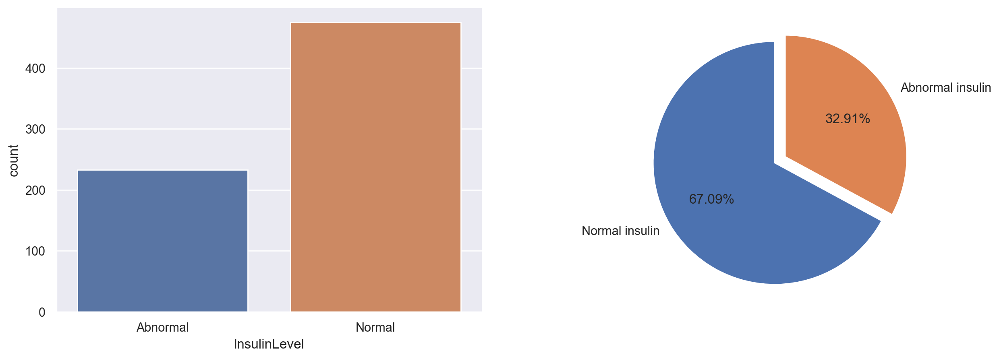

In [147]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

sns.countplot(ax=ax[0], data=df3, x='InsulinLevel')

normal_insulin = df3[df3['InsulinLevel'] == 'Normal'].count()[0]
abnormal_insulin = df3[df3['InsulinLevel'] == 'Abnormal'].count()[0]

plt.pie([normal_insulin, abnormal_insulin], 
        labels=['Normal insulin', 'Abnormal insulin'], 
        autopct="%.2f%%",
        explode=[0.05,0.05],
        startangle=90)

sns.despine()

Sprawdźmy jeszcze, czy zmierzona wartość poziomu insuliny jest uzależniona od tego, czy dana pacjentka jest chora na cukrzycę.

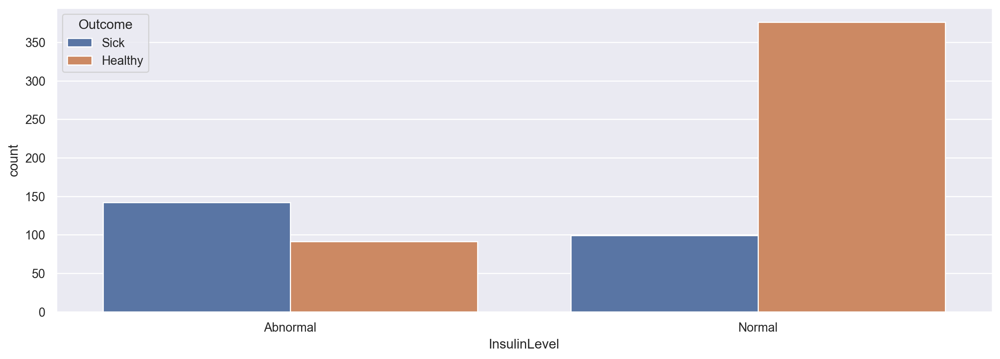

In [148]:
fig = plt.figure(figsize=(15, 5))
sns.countplot(data=df3, x='InsulinLevel', hue='Outcome')
plt.show()

Jak widzimy, w przypadku osób, u których zmierzona wartość insuliny przekracza dopuszczalny zakres, możemy zaobserwować dużo większy udział pacjentek, u których stwierdzono cukrzycę. W przypadku osób o normalnym poziomie cukrzycy, obserwujemy odwrotną zależność, a mianowicie, w tej grupie pacjentek przytłaczającą większość stanowią osoby zdrowe.

## Badanie zależności między wartością glukozy a wynikiem testu na cukrzycę

Według informacji zawartych na stronie internetowej https://www.cdc.gov/diabetes/basics/getting-tested.html, przedziały wartości glukozy przedstawiają się następująco:

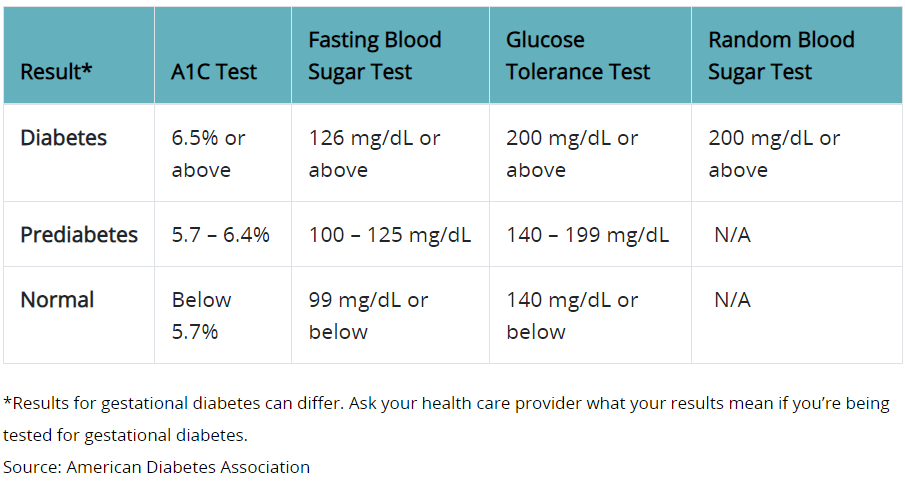</img>

Również na załączonej stronie internetowej, widnieje następujący opis metodologii pomiaru glukozy w teście tolerancji glukozy:

> **Glucose Tolerance Test**
>
> This measures your blood sugar before and after you drink a liquid that contains glucose. You’ll fast (not eat) overnight before the test and have your blood drawn to determine your fasting blood sugar level. Then you’ll drink the liquid and have your blood sugar level checked 1 hour, 2 hours, and possibly 3 hours afterward. At 2 hours, a blood sugar level of 140 mg/dL or lower is considered normal, 140 to 199 mg/dL indicates you have prediabetes, and 200 mg/dL or higher indicates you have diabetes.

Ponieważ pacjentki, których dane analizujemy, były badane po $2$ godzinach po podaniu płynu z glukozą, możemy skorzystać z danych zamieszczonych na wyżej wymienionej stronie internetowej, ponieważ dotyczyły one pomiarów, dokonywanych również $2$ godziny po podaniu płynu.

Powyższe źródło nie podaje wartości, przy której wartość glukozy możemy uznać za niską. Korzystając z informacji zamieszczonych na tej stronie internetowej https://www.mayoclinic.org/diseases-conditions/hypoglycemia/symptoms-causes/syc-20373685, przyjmuję, że niski poziom glukozy odpowiada zakresowi wartości $0-70$ $\frac{\text{mg}}{\text{dL}}$.

Podzielimy więc pacjentki na $4$ grupy:

- Pacjentki z glukozą znacznie powyżej normy (przynajmniej $200$ $\frac{\text{mg}}{\text{dL}}$),

- Pacjentki z glukozą nieznacznie powyżej normy ($140-199$ $\frac{\text{mg}}{\text{dL}}$),

- Pacjentki z glukozą w normie ($70-139$ $\frac{\text{mg}}{\text{dL}}$),

- Pacjentki z niskim poziomem glukozy (co najwyżej $69$ $\frac{\text{mg}}{\text{dL}}$)


In [149]:
Glucose_groups = {
    'Low': (0, 70),
    'Normal': (70, 140),
    'High': (140, 200),
    'Extreme': (200, float('inf'))
}

df3['GlucoseLevel'] = pd.Series(Glucose_groups.keys())

for gr, (lower, upper) in Glucose_groups.items():
    df3.loc[(df3['Glucose'] >= lower) & (df3['Glucose'] < upper), 'GlucoseLevel'] = gr

In [150]:
df3.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,BMIGroup,InsulinLevel,GlucoseLevel
0,6.0,148.0,72.0,35.0,313.2,33.6,0.627,50.0,Sick,Obesity 1,Abnormal,High
1,1.0,85.0,66.0,29.0,57.2,26.6,0.351,31.0,Healthy,Overweight,Normal,Normal
2,8.0,183.0,64.0,30.8,238.0,23.3,0.672,32.0,Sick,Healthy weight,Abnormal,High
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,Healthy,Overweight,Normal,Normal
4,5.0,116.0,74.0,23.0,128.4,25.6,0.201,30.0,Healthy,Overweight,Normal,Normal


In [151]:
df3['GlucoseLevel'].value_counts()

Normal    513
High      184
Low        11
Name: GlucoseLevel, dtype: int64

In [152]:
df3['GlucoseLevel'][df3['GlucoseLevel'] == 'Extreme']

Series([], Name: GlucoseLevel, dtype: object)

In [153]:
df['Glucose'][df['Glucose'] > 200]

Series([], Name: Glucose, dtype: float64)

Jak widać, wśród pacjentek nie ma żadnej osoby, która by miała wartość glukozy znacznie przekraczającą normę. Takiej pacjentki nie było nawet przed usunięciem wartości odstających ze zbioru.

Przedstawmy na wykresach, jak się prezentują liczebności poszczególnych grup pacjentek, którym odpowiada dany poziom glukozy.

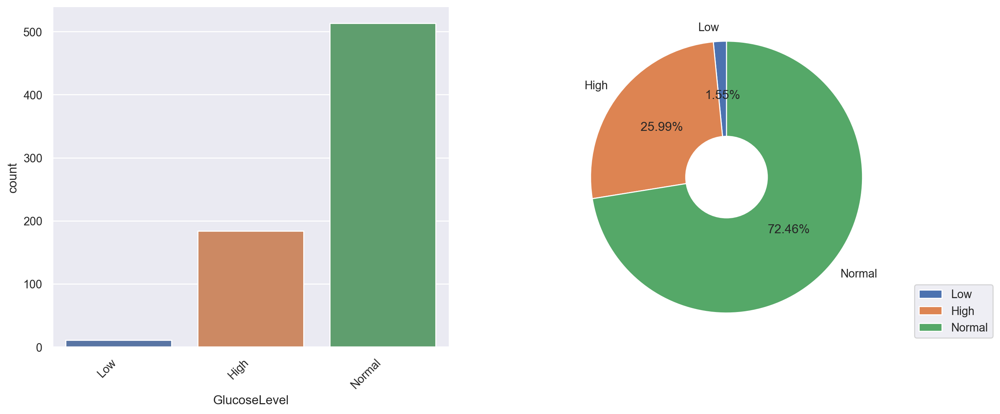

In [154]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

orderby = df3.groupby('GlucoseLevel').count().sort_values(by='Outcome').index
g = sns.countplot(ax=ax[0], data=df3, x='GlucoseLevel', order=orderby)
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')

glucose_by_groups = dict.fromkeys(Glucose_groups, 0)

for gr in glucose_by_groups:
    glucose_by_groups[gr] = df3['GlucoseLevel'][df3['GlucoseLevel'] == gr].count()
    
counts = [glucose_by_groups[group] for group in orderby]
labels = orderby
plt.pie(counts, labels=labels, autopct="%.2f%%", startangle=90)

center_hole = plt.Circle((0, 0), .3, color='white')
plt.gcf().gca().add_artist(center_hole)
plt.legend(bbox_to_anchor=(1.3, .2))

sns.despine()

Jak widzimy, w całej grupie badanych pacjentek tylko około $1/4$ ma poziom glukozy, wykraczający poza normę. Prawdopodobnie jest tak dlatego, że w grupie badanych osób tylko około $1/3$ stanowią osoby chore na cukrzycę.

Sprawdźmy zatem, jak zmierzony poziom glukozy zależy od tego, czy pacjentka ma stwierdzoną cukrzycę.

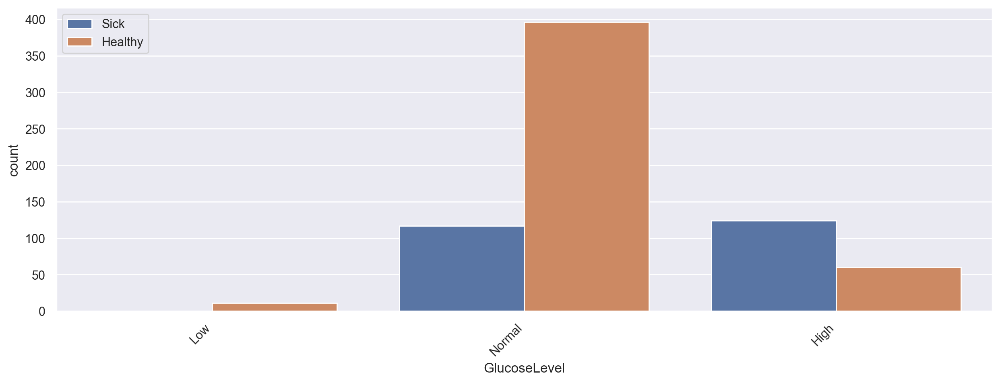

In [155]:
plt.figure(figsize=(15, 5))
order = [*glucose_by_groups]
order.remove('Extreme')
g = sns.countplot(data=df3, x='GlucoseLevel', hue='Outcome', order=order)
g.legend(loc='upper left')
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

Zobaczmy jeszcze, jak wygląda procentowy udział osób chorych na cukrzycę oraz osób zdrowych w grupach o tym samym poziomie glukozy, który został u nich zmierzony.

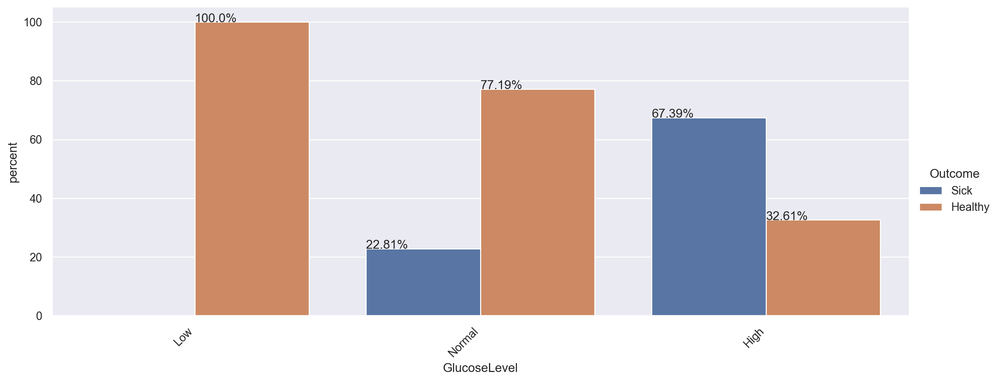

In [156]:
df4 = df3.groupby('GlucoseLevel')['Outcome'].value_counts(normalize=True)
df4 = df4.mul(100)
df4 = df4.rename('percent').reset_index()
g = sns.catplot(data=df4, kind='bar', x='GlucoseLevel', y='percent', hue='Outcome', 
                order=order, height=5, aspect=2.5)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x()
    txt_y = p.get_height()
    if np.isnan(txt_x): txt_x = 0
    if np.isnan(txt_y): txt_y = 0
    g.ax.text(txt_x, txt_y, '' if not txt_y else txt)

plt.xticks(rotation=45, horizontalalignment='right')
plt.show()

Jak możemy zauważyć, wśród pacjentek o wysokim poziomie glukozy, ponad $2/3$ osób to pacjentki chore na cukrzycę. W przypadku osób o normalnym poziomie glukozy, tylko niespełna $1/4$ osób to pacjentki chore. Widzimy więc wyraźną zależność, pokazującą, że im wyższy jest poziom glukozy, tym większy jest odsetek osób chorych na cukrzycę.

# Szczegółowa analiza

## Testowanie normalności rozkładów zmiennych

### Test normalności D'Agostino-Pearsona

Ten test statystyczny służy do zbadania hipotezy, czy dana próba pochodzi z rozkładu normalnego. Bazuje on na wartości współczynnika asymetrii (skośności) oraz kurtozy, przy pomocy których porównuje rozkład z rozkładem normalnym. Test zwraca statystykę $s^2 + k^2$, gdzie $s$ oznacza wynik z-score testu skośności rozkładu, natomiast $k$ oznacza wynik z-score testu kurtozy oraz wartość $p$, oznaczającą jak bardzo prawdopodobne jest spełnienie hipotezy zerowej. z-score to wartość statystyczna, która mówi, ile odchyleń standardowych od średniej z całego zbioru danych przypada na określoną wartość.

Za hipotezę zerową (*null hypothesis*) przyjmujemy $H_0$, natomiast za hipotezę alternatywną (*alternative hipothesis*) przyjmujemy $H_a$:

$H_0$ - Próbka pochodzi z rozkładu normalnego,

$H_a$ - Próbka nie pochodzi z rozkładu normalnego.

Jeżeli otrzymamy wartość $p$ poniżej $\alpha=0.05$, oznacza to, że możemy odrzucić hipotezę zerową, Przyjmujemy wtedy, że próbka nie pochodzi z rozkładu normalnego (za $\alpha$ zwykle przyjmuje się wartość $0.05$). W przypadku jednak, gdy $p \ge \alpha$, nie istnieją przesłanki, które świadczyłyby, że konieczne jest odrzucenie hipotezy $H_0$. Uznajemy wówczas, że hipoteza $H_0$ jest możliwa do spełnienia (nie mamy jednak pewności, iż próbka pochodzi z rozkładu normalnego. Możemy jedynie stwierdzić, że jest taka możliwość).

In [157]:
alpha = .05

for c in df2.columns.drop('Outcome'):
    statistic, pvalue = stats.normaltest(df2[c])
    msg = 'Null hypothesis can be rejected for:' if pvalue < alpha else 'Cannot reject null hypothesis for:'
    print(msg, c, f'p={pvalue}')

Null hypothesis can be rejected for: Pregnancies p=1.2952730902408826e-16
Null hypothesis can be rejected for: Glucose p=1.0629064222185689e-07
Null hypothesis can be rejected for: BloodPressure p=0.008678825247521081
Cannot reject null hypothesis for: SkinThickness p=0.19393704754824678
Null hypothesis can be rejected for: Insulin p=3.438356197541473e-54
Null hypothesis can be rejected for: BMI p=0.002073525732386311
Null hypothesis can be rejected for: DiabetesPedigreeFunction p=5.582129781469317e-40
Null hypothesis can be rejected for: Age p=5.6182352095636806e-21


Jak widzimy, jedynie w przypadku zmiennej ```SkinThickness``` stwierdzamy, że hipotezy zerowej nie możemy odrzucić. Kolejne zmienne, dla których otrzymana wartość współczynnika $p$ nie jest dużo mniejsza niż $0.05$, to kolejno ```BloodPressure``` oraz ```BMI```. W przypadku wszystkich innych zmiennych, wartość współczynnika $p$ jest tak mała, że od razu widzimy, iż wartości tych zmiennych nie pochodzą z rozkładu normalnego.

### Test Kołmogorowa-Smirnowa

Ten test pozwala na porównywanie rozkładów jendowymiarowych cech statystycznych. Służy więc on do sprawdzania nie tylko, czy rozkład jest normalny, jednakże my wykorzystamy ten test do zbadania normalności rozkładu.

Ponownie przyjmujemy następujące hipotezy:

$H_0$ - Dwie próbki są z tego samego rozkładu (u nas normalnego),

$H_a$ - Dwie próbki nie są z różnych rozkładów.

Definiujemy dystrybuantę empiryczną jako:

$F_n(x) = P_n(X \le x) = \frac{1}{n} \sum_{i=1}^{n}I(X_i \le x)$

Definiujemy teoretyczną dystrybuantę jako: $F(x)$. W przypadku testowania rozkładu pod kątem normalności, $F(x)$ jest dystrybuantą rozkładu normalnego.

Statystykę Kołmogorowa-Smirnowa definiujemy w następujący sposób:

$D_n = sup_{x}{|F_n(x) - F(x)|}$

Widzimy więc, że ta statystyka mierzy największy dystans między porównywanymi dystrybucjami dla każdej możliwej wartości zmiennej (dla każdego $x$).

W celu wykonania testu Kołmogorowa-Smirnowa, skorzystamy z dostarczonej wraz z biblioteką ```scipy``` funkcji ```kstest```.

###### Cecha: ```SkinThickness```

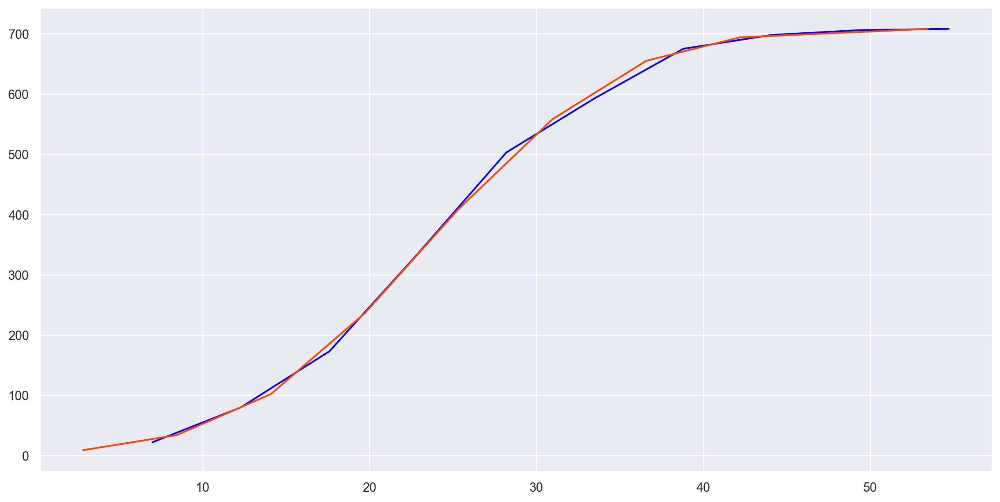

In [158]:
df_norm = np.random.normal(np.mean(df2['SkinThickness']), np.std(df2['SkinThickness']), len(df2))
values, base = np.histogram(df2['SkinThickness'])
values_norm, base_norm = np.histogram(df_norm)
cumulative = np.cumsum(values)
cumulative_norm = np.cumsum(values_norm)
fig = plt.figure(figsize=(15, 7.5))
plt.plot(base[:-1], cumulative, c='blue')
plt.plot(base_norm[:-1], cumulative_norm, c='orangered')
plt.show()

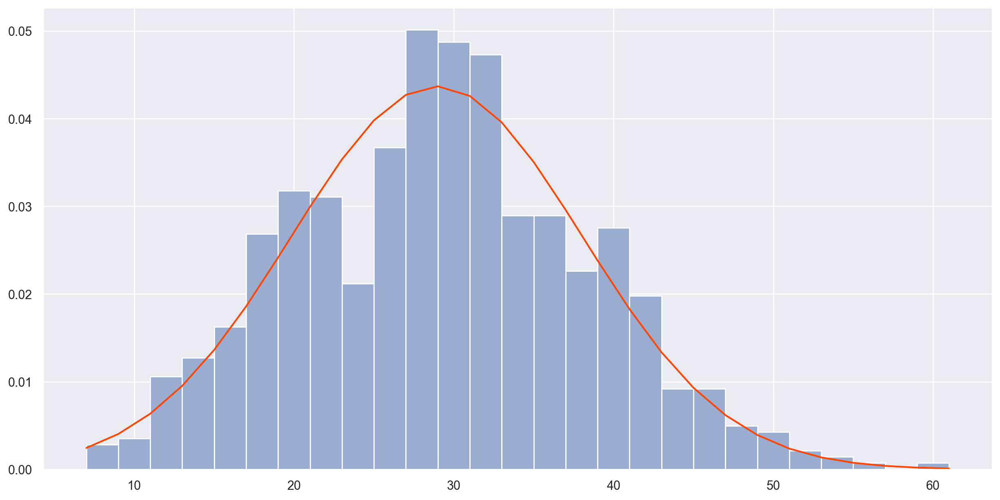

In [159]:
data = df2['SkinThickness']
norm = stats.norm
loc, scale = norm.fit(data)
n = norm(loc=loc, scale=scale)

fig = plt.figure(figsize=(15, 7.5))
plt.hist(data, bins=np.arange(data.min(), data.max()+2, 2), rwidth=1, color='#9aadd0', density=True)
x = np.arange(data.min(), data.max()+2, 2)
plt.plot(x, n.pdf(x), color='orangered')
plt.show()

In [160]:
statistic, pvalue = stats.kstest(data, n.cdf)
print(statistic, pvalue)

0.03682155862801728 0.28531855681562224


Jak widzimy, wartość współczynnika $p$ jest sporo wyższa od $0.05$. Oznacza to, że nie możemy odrzucić hipotezy zerowej, a więc istnieje możliwość, że wartości zmiennej ```SkinThickness``` pochodzą z rozkładu normalnego.

W analigoczny sposób zbadajmy również dwa pozostałe rozkłady, które miały kurtozę i współczynnik asymetrii zbliżone do rozkładu normalnego.

###### Cecha: ```BloodPressure```

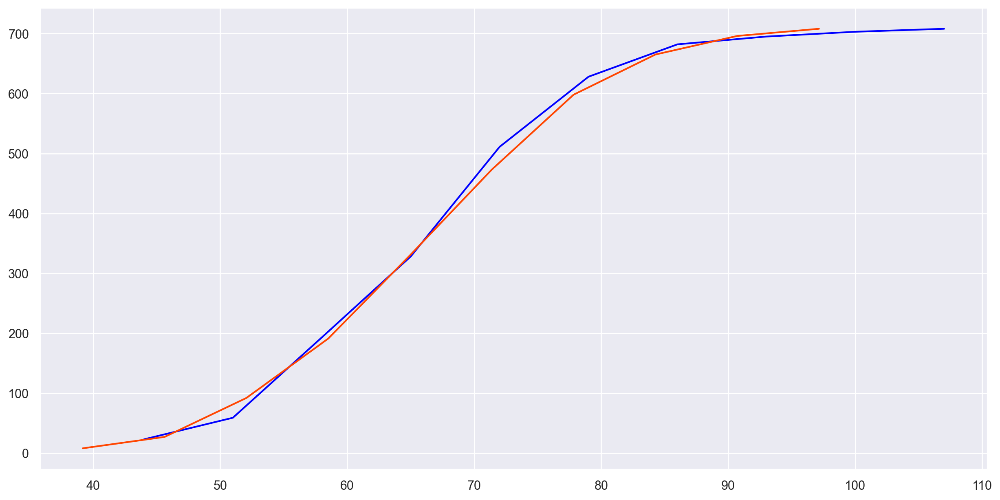

In [161]:
df_norm = np.random.normal(np.mean(df2['BloodPressure']), np.std(df2['BloodPressure']), len(df2))
values, base = np.histogram(df2['BloodPressure'])
values_norm, base_norm = np.histogram(df_norm)
cumulative = np.cumsum(values)
cumulative_norm = np.cumsum(values_norm)
fig = plt.figure(figsize=(15, 7.5))
plt.plot(base[:-1], cumulative, c='blue')
plt.plot(base_norm[:-1], cumulative_norm, c='orangered')
plt.show()

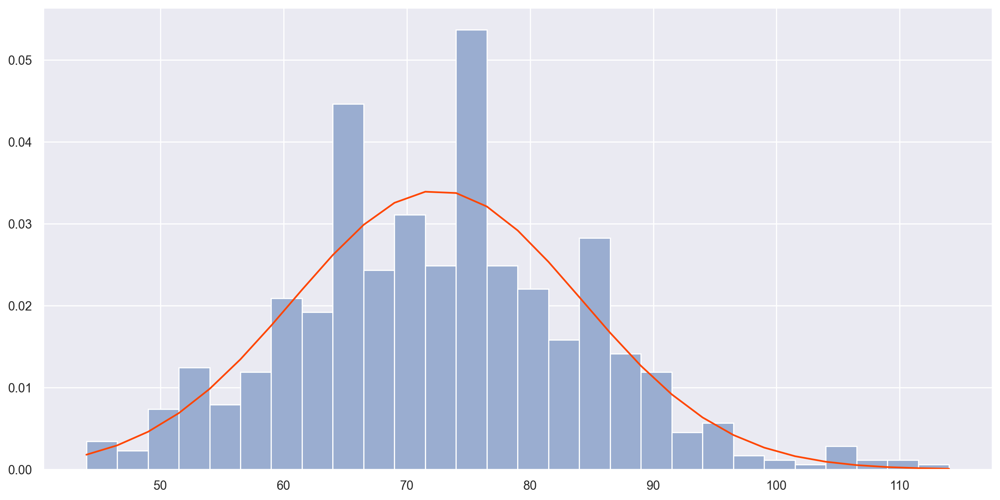

In [162]:
data = df2['BloodPressure']
norm = stats.norm
loc, scale = norm.fit(data)
n = norm(loc=loc, scale=scale)

fig = plt.figure(figsize=(15, 7.5))
plt.hist(data, bins=np.arange(data.min(), data.max()+2.5, 2.5), rwidth=1, color='#9aadd0', density=True)
x = np.arange(data.min(), data.max()+2.5, 2.5)
plt.plot(x, n.pdf(x), color='orangered')
plt.show()

In [163]:
statistic, pvalue = stats.kstest(data, n.cdf)
print(statistic, pvalue)

0.04739659679125213 0.08045340661115241


Jak widzimy, tym razem również wartość współczynnika $p$ jest wyższa od przyjętej wartości $0.05$, zatem ponownie nie możemy odrzucić hipotezy zerowej.

###### Cecha: ```BMI```

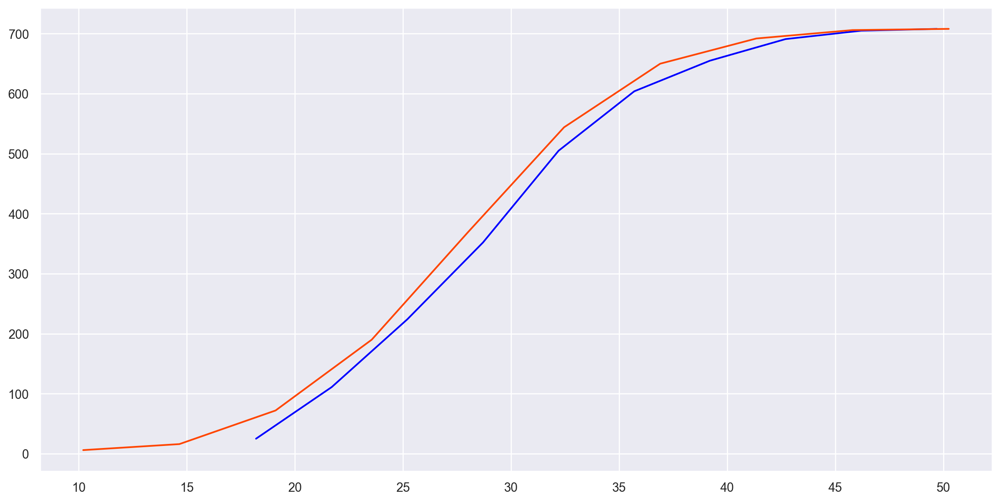

In [164]:
df_norm = np.random.normal(np.mean(df2['BMI']), np.std(df2['BMI']), len(df2))
values, base = np.histogram(df2['BMI'])
values_norm, base_norm = np.histogram(df_norm)
cumulative = np.cumsum(values)
cumulative_norm = np.cumsum(values_norm)
fig = plt.figure(figsize=(15, 7.5))
plt.plot(base[:-1], cumulative, c='blue')
plt.plot(base_norm[:-1], cumulative_norm, c='orangered')
plt.show()

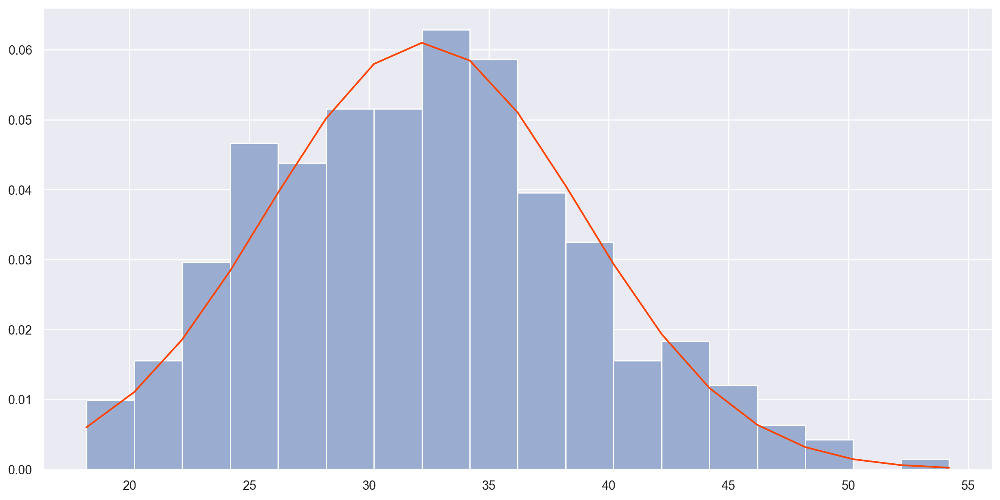

In [165]:
data = df2['BMI']
norm = stats.norm
loc, scale = norm.fit(data)
n = norm(loc=loc, scale=scale)

fig = plt.figure(figsize=(15, 7.5))
plt.hist(data, bins=np.arange(data.min(), data.max()+2, 2), rwidth=1, color='#9aadd0', density=True)
x = np.arange(data.min(), data.max()+2, 2)
plt.plot(x, n.pdf(x), color='orangered')
plt.show()

In [166]:
statistic, pvalue = stats.kstest(data, n.cdf)
print(statistic, pvalue)

0.032026976164664434 0.4526852558941007


Jak widzimy, tym razem również wartość współczynnika $p$ jest wyższa od przyjętej wartości $0.05$, zatem ponownie nie możemy odrzucić hipotezy zerowej.

### Test Shapiro-Wilka

Ten test służy do badania normalności rozkładu. Jest on zdefiniowany następująco:

$W = \Large \frac{(\sum_{i=1}^{n}{a_ix_i})^2}{\sum_{i=1}^{n}{(x_i-\overline{x})^2}}$

gdzie $x_i$ oznacza $i$-tą najmniejszą liczbę w próbie ($x_1 \le x_2 \le ... \le x_n$), natomiast $a_i$ to stałe, wygenerowane na podstawie wariancji, kowariancji oraz średniej dla rozkładu normalnego.

Do wykonania testu posłużymy się dostarczoną wraz z biblioteką ```scipy``` funkcją ```shapiro```.

###### Cecha: ```SkinThickness```

In [167]:
statistic, pvalue = stats.shapiro(df2['SkinThickness'])
print(statistic, pvalue)

0.9950786828994751 0.02284642867743969


Jak widzimy, tym razem wartość współczynnika $p$ jest niższa od przyjętej wartości $0.05$, więc możemy odrzucić hipotezę zerową.

###### Cecha: ```BloodPressure```

In [168]:
statistic, pvalue = stats.shapiro(df2['BloodPressure'])
print(statistic, pvalue)

0.9913814067840576 0.0003813853836618364


Jak widzimy, tym razem wartość współczynnika $p$ jest niższa od przyjętej wartości $0.05$, więc możemy odrzucić hipotezę zerową.

###### Cecha: ```BMI```

In [169]:
statistic, pvalue = stats.shapiro(df2['BMI'])
print(statistic, pvalue)

0.9902631044387817 0.00012427102774381638


Jak widzimy, tym razem wartość współczynnika $p$ jest niższa od przyjętej wartości $0.05$, więc możemy odrzucić hipotezę zerową.

#### Wykresy Q-Q Plot

Czym jest wykres Q-Q Plot (*quantile-quantile plot*)? Jest to wykres, który służy do graficznego porównania dwóch rozkładów prawdopodobieństwa, poprzez umieszczenie na wykresie kwantyli z obu rozkładów.

W naszej sytuacji, wykorzystamy ten wykres do porównania rozkładów wybranych zmiennych z rozkładem normalnym. 

###### Cecha: ```SkinThickness```

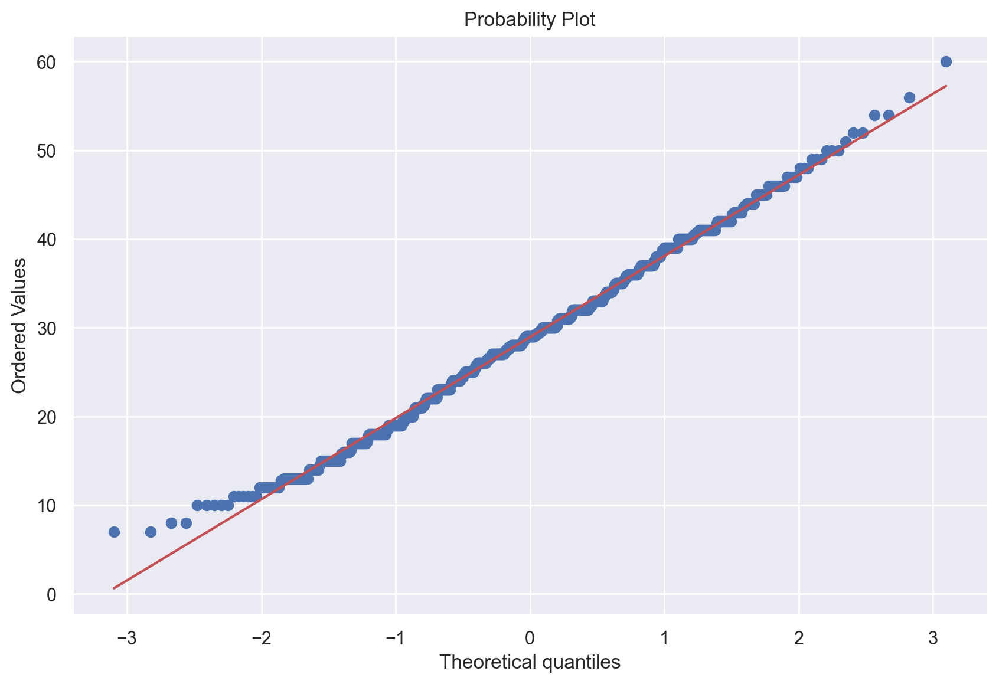

In [170]:
fig = plt.figure(figsize=(10, 6.5))
stats.probplot(df2['SkinThickness'], dist="norm", plot=pylab)
pylab.show()

Jak widzimy, prawie wszystkie wartości pokrywają się niemalże idealnie z linią prostą, odpowiadającą rozkładowi normalnemu. Jedynie wartości odstające zaburzają ten rozkład. 

Sprawdźmy więc, czy również z powodu zaburzenia, spowodowanego wartościami odstającymi, dla zmiennych ```BloodPressure``` oraz ```BMI``` została odrzucona hipoteza zerowa.

###### Cecha: ```BloodPressure```

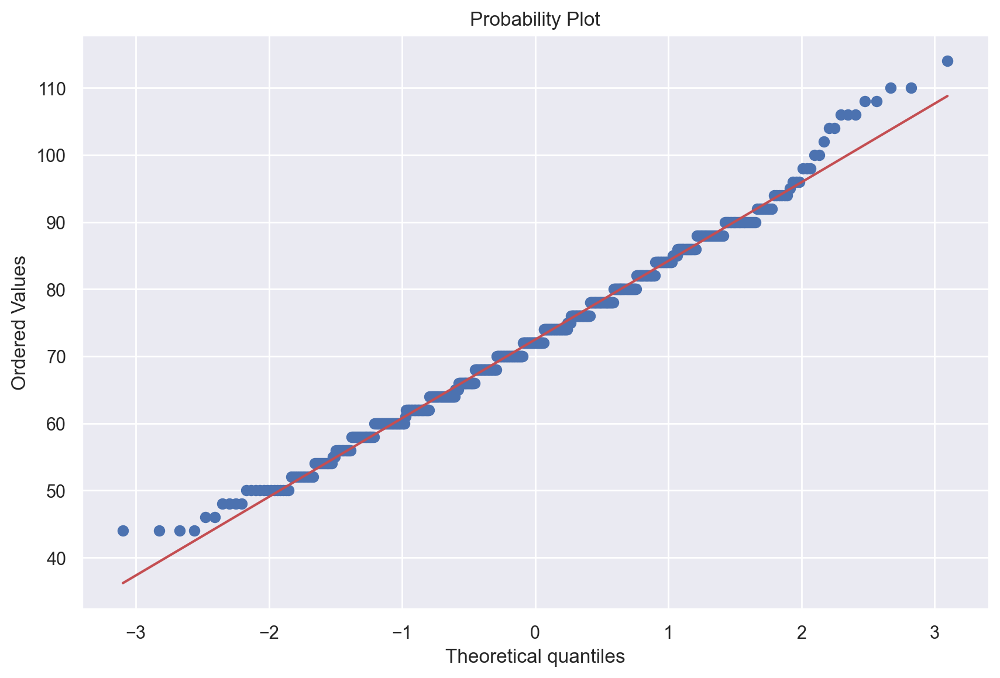

In [171]:
fig = plt.figure(figsize=(10, 6.5))
stats.probplot(df2['BloodPressure'], dist="norm", plot=pylab)
pylab.show()

Ponownie widzimy, że wartości odstające zaburzają rozkład. W tym przypadku jednak większe zaburzenie spowodowane jest dużymi wartościami skrajnymi.

###### Cecha: ```BMI```

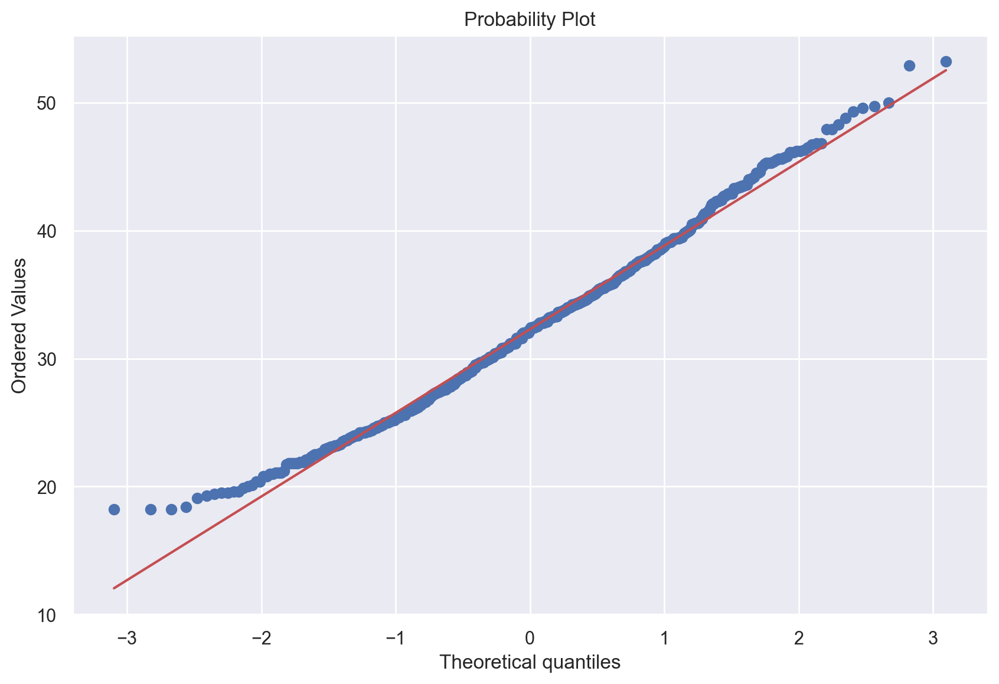

In [172]:
fig = plt.figure(figsize=(10, 6.5))
stats.probplot(df2['BMI'], dist="norm", plot=pylab)
pylab.show()

Dla ```BMI```, podobnie jak dla ```SkinThickness```, największe zaburzenie powodują małe wartości skrajne.

### Podsumowanie testów normalności

Wyniki testów przedstawiają się następująco:

In [173]:
 print(tabulate([
     ('D\'Agostino-Pearsona', 'nie odrzucać', 'odrzucić', 'ordrzucić'),
     ('Kołmogorowa-Smirnowa', 'nie odrzucać', 'nie odrzucać', 'nie odrzucać'),
     ('Shapiro-Wilka', 'odrzucić', 'odrzucić', 'ordrzucić')
 ], [
     '', 'SkinThickness', 'BloodPressure', 'BMI'
 ]))

                      SkinThickness    BloodPressure    BMI
--------------------  ---------------  ---------------  ------------
D'Agostino-Pearsona   nie odrzucać     odrzucić         ordrzucić
Kołmogorowa-Smirnowa  nie odrzucać     nie odrzucać     nie odrzucać
Shapiro-Wilka         odrzucić         odrzucić         ordrzucić


*W powyższej tabeli wartość **odrzucić** oznacza, że według wartości, które otrzymaliśmy po wykonaniu testu, powinniśmy odrzucić hipotezę $H_0$, natomiast **nie odrzucać** oznacza, że nie możemy odrzucić tej hipotezy*

Widzimy, że wyniki są różne, w zależności od wykonanego testu. Obserwujemy jednak, że w każdym teście, występowało największe prawdopodobieństwo tego, iż wartości zmiennej ```SkinThickness``` pochodzą z rozkładu normalnego.

## Badanie korelacji zmiennych

### Korelacja Pearsona

Zobaczmy, korzystając z macierzy korelacji, między którymi parami zmiennych istnieje najsilniejsza zależność. W tym przypadku skorzystamy ze współczynnika korelacji Pearsona, który mierzy liniową zależność między parą zmiennych.

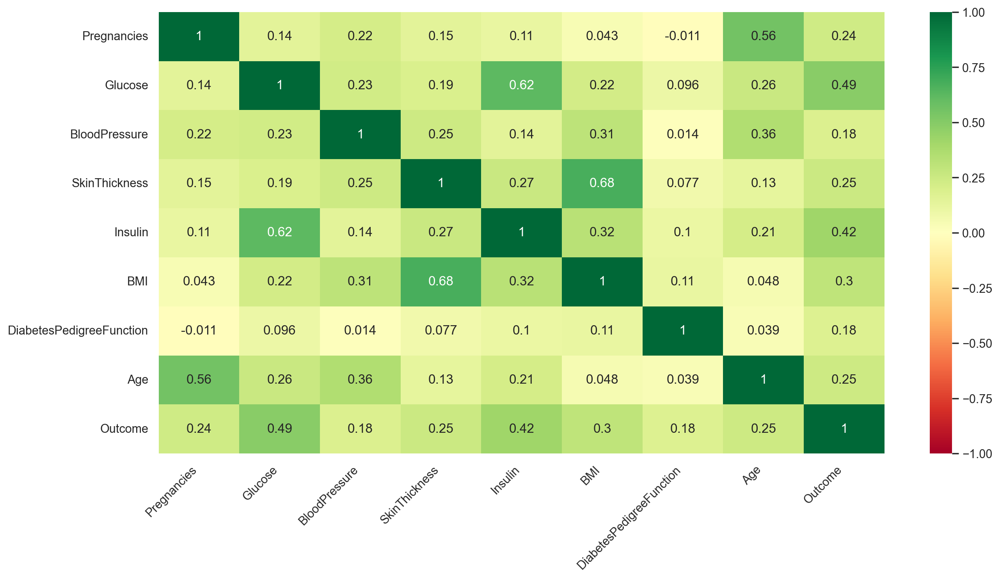

In [174]:
figure = plt.figure(figsize=(15, 7.5))
g = sns.heatmap(df2.corr('pearson'), cmap="RdYlGn", vmax=1, vmin=-1, center=0, annot=True)
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

Powyższa mapa ciepła pozwala wyciągnąć następujące wnioski:
- występuje pozytywna korelacja między grubością fałdu skórnego a BMI. Zależność ta nie jest niczym zaskakującym, ponieważ zwykle osoby o wyższym wskaźniku BMI są bardziej otyłe, przez co mają więcej tkanki tłuszczowej pod skórą,
- występuje pozytywna korelacja między wiekiem a liczbą odbytych ciąż. Ponownie, nie jest to zaskakująca zależność, ponieważ, z reguły kobiety w młodym wieku nie posiadają tak liczbego potomstwa, jak kobiety starsze,
- występuje pozytywna korelacja między poziomem insuliny a poziomem glukozy. Uzasadnieniem tej zależności może być fakt, iż pacjentki mające cukrzycę, z reguły mają wyższą glukozę od pacjentek zdrowych,
- widzimy także pozytywną korelację między poziomem glukozy a wynikiem testu na cukrzycę. Wynika ona stąd, że osoby chore na cukrzycę, zwykle mają wyższą glukozę we krwi od osób zdrowych.

### Korelacja Spearmana

Sprawdźmy, czy istnieją zmienne, które są ze sobą skorelowane, ale zależność ta nie jest liniowa. W tym celu, skorzystamy ze współczynnika korelacji Spearmana.

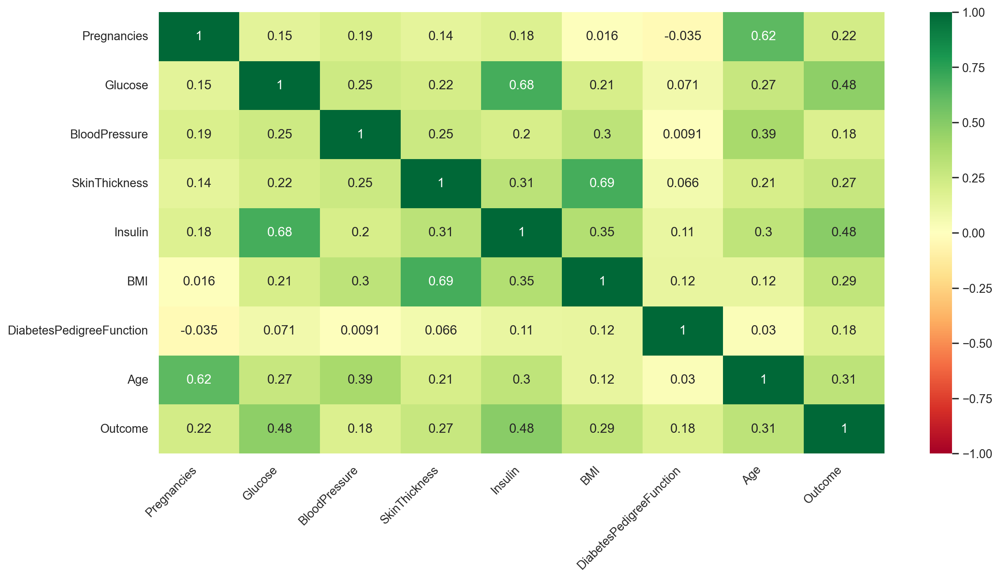

In [175]:
figure = plt.figure(figsize=(15, 7.5))
g = sns.heatmap(df2.corr('spearman'), cmap="RdYlGn", vmax=1, vmin=-1, center=0, annot=True)
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

Otrzymane wyniki są zbliżone do poprzednich. Tym razem jednak obserwujemy różnice, takie jak:
- niewiele silniejsza korelacja wieku oraz liczby odbytych ciąż,
- niewiele silniejsza korelacja zmierzonej wartości insuliny i wyniku testu na cukrzycę,
- niewiele silniejsza korelacja między insuliną a glukozą,
- prawie identyczna wartość współczynnika korelacji między BMI a grubością fałdu skórnego.

## Analiza zależności zmiennych, przy pomocy regresji

### Pomocnicze funkcje

* Dopasowywanie prostej do punktów

In [176]:
def fit_line_score(data, x_col, y_col):
    x = np.array(data[x_col]).reshape((-1, 1))
    y = data[y_col]
    model = LinearRegression().fit(x, y)
    return model.score(x, y)

* Dopasowywanie wielomianu do punktów

In [177]:
def fit_polynomial_score(data, x_col, y_col, degree=2):
    x = np.array(data[x_col]).reshape((-1, 1))
    y = data[y_col]
    transformer = PolynomialFeatures(degree=degree, include_bias=False)
    x_ = PolynomialFeatures(degree=degree, include_bias=False).fit_transform(x)
    model = LinearRegression().fit(x_, y)
    return model.score(x_, y)

* Rysowanie wykresu z dopasowaną prostą

In [178]:
def reg_plot(data, x_col, y_col):
    g = sns.lmplot(x=x_col, y=y_col, hue="Outcome", data=data, fit_reg=False)
    sns.regplot(x=x_col, y=y_col, data=df3, scatter=False, ax=g.axes[0, 0])
    g.fig.set_figwidth(15)
    g.fig.set_figheight(7.5)

### Dopasowywanie prostej lub krzywej wielomianowej

###### Zależność ```BMI``` - ```SkinThickness```

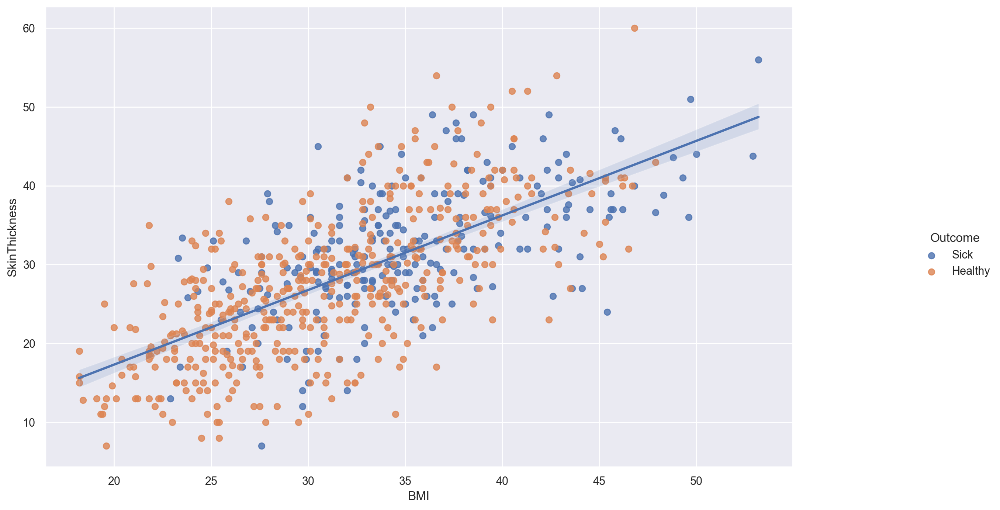

In [179]:
reg_plot(df3, 'BMI', 'SkinThickness')

Spróbujmy, przy pomocy regresji liniowej, dowiedzieć się, jak dobre jest dopasowanie prostej do punktów na wykresie. Wykorzystamy w tym celu bibliotekę ```sklearn```.

In [180]:
fit_line_score(df3, 'BMI', 'SkinThickness')

0.45968028117852033

Spróbujmy do punktów dopasować wielomian.

In [181]:
fit_polynomial_score(df3, 'BMI', 'SkinThickness', 8)

0.4717801128473387

Najlepsze dopasowanie udało mi się uzyskać dla wielomianu $8$. stopnia. Wciąż wynik współczynnika dopasowania nie jest zbyt wysoki, co wynika z dużego rozproszenia wartości, przez co dobre dopasowanie krzywej do punktów nie jest za bardzo możliwe.

###### Zależność ```Insulin``` - ```Glucose```

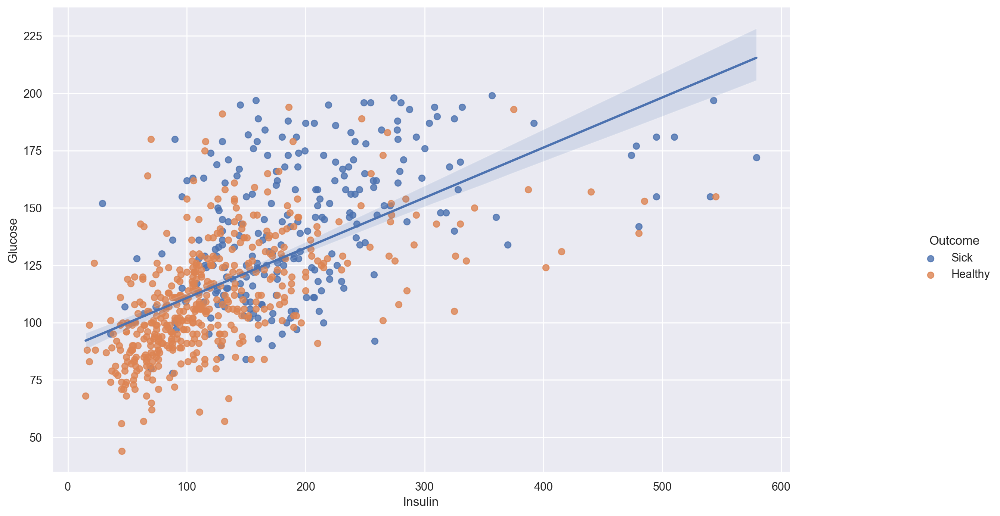

In [182]:
reg_plot(df3, 'Insulin', 'Glucose')

Spróbujmy, przy pomocy regresji liniowej, dowiedzieć się, jak dobre jest dopasowanie prostej do punktów na wykresie. Wykorzystamy w tym celu bibliotekę ```sklearn```.

In [183]:
fit_line_score(df3, 'Insulin', 'Glucose')

0.387202701728782

Spróbujmy do punktów dopasować wielomian.

In [184]:
fit_polynomial_score(df3, 'Insulin', 'Glucose', 6)

0.44251671297162043

Najlepsze dopasowanie udało mi się uzyskać dla wielomianu $6$. stopnia. Ponownie wynik nie jest zbyt wysoki.

###### Zależność ```Age``` - ```Pregnancies```

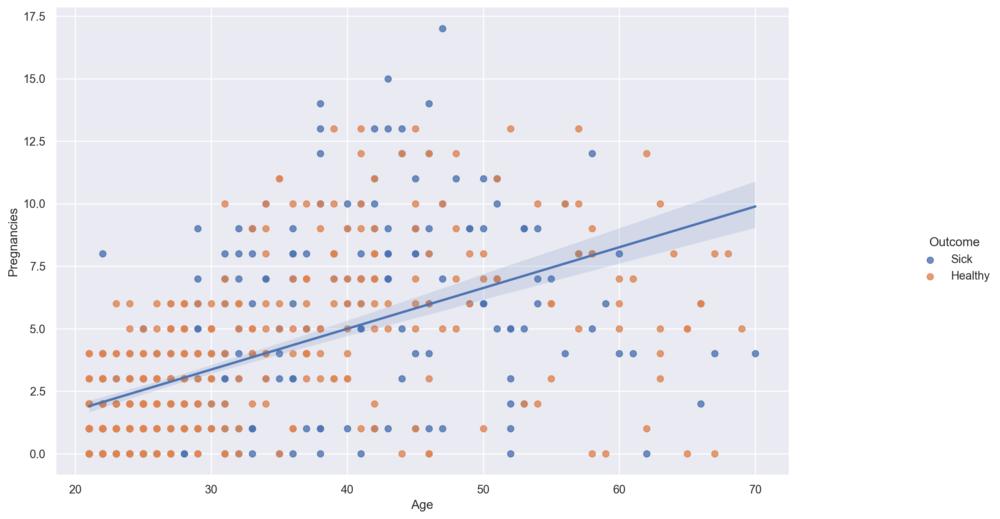

In [185]:
reg_plot(df3, 'Age', 'Pregnancies')

Spróbujmy, przy pomocy regresji liniowej, dowiedzieć się, jak dobre jest dopasowanie prostej do punktów na wykresie. Wykorzystamy w tym celu bibliotekę ```sklearn```.

In [186]:
fit_line_score(df3, 'Age', 'Pregnancies')

0.31567917157287884

Spróbujmy do punktów dopasować wielomian.

In [187]:
fit_polynomial_score(df3, 'Age', 'Pregnancies', 8)

0.4434904987188978

Najlepsze dopasowanie udało mi się uzyskać dla wielomianu $8$. stopnia. Ponownie wynik nie jest zbyt wysoki.

### Podsumowanie

Jak widzimy, nie jest możliwe dopasowanie prostej, ani krzywej wielomianowej, dla którego współczynnik dopasowania miałby dużą wartość (żeby dopasowanie było dokładne). Być może powinniśmy spróbować dopasować krzywą, niebędącą wielomianem, jednakże punkty na wykresach charakteryzuje tak duże rozproszenie, że trudno jest wybrać krzywą, która by najlepiej oddawała zależności między zmiennymi. Widzimy więc istnienie zależności między parami odpowiednich zmiennych, prezentowanych wyżej, jednakże opisanie tych zależności, przy pomocy funkcji, nie jest prawdopodobnie możliwe.

# Wnioski

Nadszedł czas na podsumowanie tego trochę przydługawego dokumentu. Podczas analizy danych, dotyczących cukrzycy, mogliśmy zaobserwować następujące własności:

* osoby, mające cukrzycę, charakteryzują się z reguły wyższym BMI, wyższą wartością insuliny oraz glukozy, a także nieco wyższym ciśnieniem rozkurczowym krwi,

* w większości przypadków, osoby pacjentki na cukrzycę były starsze od pacjentek zdrowych, co może świadczyć o tym, że te pacjentki nabyły cukrzycę, np. wskutek nieodpowiedniego trybu życia oraz diety (na co wskazują podwyższone wartości BMI u osób chorych). Choroba nie pojawia się od razu, więc potrzeba dłuższego czasu, przez który osoba prowadzi nieodpowiedni tryb życia, aby zachorować na cukrzycę,

* w badanej grupie pacjentek niecałe $15\%$ osób ma masę w normie. Pozostałe pacjentki, to pacjenki z nadwagą lub otyłością. Po pogrupowaniu pacjentek na kategorie wagowe, możemy zauważyć, że im większych wartości BMI dotyczy dana grupa, tym więcej pacjentek chorych występuje w takiej grupie. Zależność jest bardzo dobrze widoczna, więc możemy wyciągnąć wniosek, że cukrzyca najczęściej dotyczy osób z nadwagą i otyłością. Nie jest to zaskakujące, ponieważ zwykle takie osoby spożywają dużo więcej niezdrowych potraw, a w szczególności tych, które zawierają duże ilości cukru słodyczy,

* w przypadku chorych pacjentek, u większości, 2 godziny po podaniu glukozy, wciąż we krwi utrzymywał się poziom glukozy przekraczający normę. Także w przypadku wysokich wartości glukozy, większość osób, u których zarejestrowano wysoką wartość, to pacjentki chore na cukrzycę (ponad $2/3$ osób),

* szczegółowa analiza, nie dała jednoznacznych wyników, na podstawie których można by uznać rozkład którejkolwiek ze zmiennych za rozkład normalny. Prawdopodobnie wpływ na to miały ostające wartości oraz niska liczebność badanej grupy osób. Najbardziej zbliżonym rozkładem do rozkładu normalnego był rozkład zmiennej ```SkinThickness```. Również rozkłady ```BloodPressure``` i ```BMI``` były zbliżone do rozkładu normalnego,

* możemy zaobserwować dosyć silną korelację zmienncyh ```BMI``` oraz ```SkinThickness``` (co by wyjaśniało, dlaczego oba te rozkłady są do siebie zbliżone), a także zmiennych ```Insulin``` oraz ```Glucose```. Również widoczna jest zależność między zmiennymi ```Age``` oraz ```Pregnancies```, jednakże nie jest to zaskakujące, że kobiety w starszym wieku były więcej razy w ciąży niż kobiety młode. Do żadnej z zależności nie można dopasować idelanie prostej (ani krzywej) regresji, ponieważ występuje bardzo duże rozproszenie wartości.